# Notebook for previous data analyses (not currently used, but useful) 
- carried out on 'sensory' [random/sensory photostim target groups] or 'projection' [projection/non-projection target groups] sessions 
- carried out on dataframes (see ia_dataframe_basic.ipynb)
- also carried out on pickled class objects 

In [35]:
%run ./rob_setup_notebook.ipynb

import utils.utils_funcs as uf
import utils.gsheets_importer as gsi
import utils.ia_funcs as ia 
from utils.paq2py import *

# session_type = 'sensory_nodetrend'
# session_type = 'sensory_highactivity'
# session_type = 'sensory_topactivity'
# session_type = 'sensory_topcells'
# session_type = 'sensory_extremefilter'
# session_type = 'sensory_responsivecells'
session_type = 'sensory_2sec_test'
# session_type = 'projection_nodetrend'
# session_type = 'projection_2sec_test'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload

Suite2p path: ['/home/rlees/anaconda3/envs/suite2p/lib/python3.7/site-packages/suite2p']
QNAP_path: /home/rlees/mnt/qnap 
QNAP_data_path /home/rlees/mnt/qnap/Data 
Pickle folder: /home/rlees/mnt/qnap/pkl_files 
Master pickle: /home/rlees/mnt/qnap/master_pkl/master_obj.pkl 
Figure save path: /home/rlees/mnt/qnap/Analysis/Figures 
STA movie save path: /home/rlees/mnt/qnap/Analysis/STA_movies 
S2 borders path: /home/rlees/mnt/qnap/Analysis/S2_borders


# Define dataframe paths

In [36]:
session_df_path = qnap_path + '/pkl_files/dataframes/' + session_type + '_session_df.pkl'
experiment_df_path = qnap_path + '/pkl_files/dataframes/' + session_type + '_experiment_df.pkl'
trial_df_path = qnap_path + '/pkl_files/dataframes/' + session_type + '_trial_df.pkl'
cell_df_path = qnap_path + '/pkl_files/dataframes/' + session_type + '_cell_df.pkl'
cell_trial_df_path = qnap_path + '/pkl_files/dataframes/' + session_type + '_cell_trial_df.pkl'
cell_mean_timepoint_df_path = qnap_path + '/pkl_files/dataframes/' + session_type + '_cell_mean_timepoint_df.pkl'
cell_trial_single_timepoint_df_path = (qnap_path + '/pkl_files/dataframes/' + session_type + 
                                       '_cell_trial_single_timepoint_df.pkl')

crop = False

if crop:
    session_df_path = os.path.splitext(session_df_path)[0] + '_postSep2020.pkl'
    experiment_df_path = os.path.splitext(experiment_df_path)[0] + '_postSep2020.pkl'
    trial_df_path = os.path.splitext(trial_df_path)[0] + '_postSep2020.pkl'
    cell_df_path = os.path.splitext(cell_df_path)[0] + '_postSep2020.pkl'
    cell_trial_df_path = os.path.splitext(cell_trial_df_path)[0] + '_postSep2020.pkl'
    cell_mean_timepoint_df_path = os.path.splitext(cell_mean_timepoint_df_path)[0] + '_postSep2020.pkl'
    cell_trial_single_timepoint_df_path = os.path.splitext(cell_trial_single_timepoint_df_path)[0] + '_postSep2020.pkl'

# Make copy of dataframes with pre-Sep 2020 animals removed

In [ ]:
# Open all dataframes for cropping
cell_df = pd.read_pickle(qnap_path + '/pkl_files/dataframes/' + session_type + '_cell_df.pkl')
cell_trial_df = pd.read_pickle(qnap_path + '/pkl_files/dataframes/' + session_type + '_cell_trial_df.pkl')
cell_mean_timepoint_df = pd.read_pickle(qnap_path + '/pkl_files/dataframes/' + session_type + '_cell_mean_timepoint_df.pkl')
cell_trial_single_timepoint_df = pd.read_pickle(qnap_path + '/pkl_files/dataframes/' + session_type + '_cell_trial_single_timepoint_df.pkl')
experiment_df = pd.read_pickle(qnap_path + '/pkl_files/dataframes/' + session_type + '_experiment_df.pkl')
trial_df = pd.read_pickle(qnap_path + '/pkl_files/dataframes/' + session_type + '_trial_df.pkl')
session_df = pd.read_pickle(qnap_path + '/pkl_files/dataframes/' + session_type + '_session_df.pkl')

In [ ]:
# Crop out all pre-Sep 2020 animals

# dfs = [
#     cell_df,
#     cell_trial_df,
#     cell_mean_timepoint_df,
#     cell_trial_single_timepoint_df,
#     experiment_df,
#     trial_df,
#     session_df
# ]

# df_names = [
#     session_type + '_cell_df_preSep2020.pkl',
#     session_type + '_cell_trial_df_preSep2020.pkl',
#     session_type + '_cell_mean_timepoint_df_preSep2020.pkl',
#     session_type + '_cell_trial_single_timepoint_df_preSep2020.pkl',
#     session_type + '_experiment_df_preSep2020.pkl',
#     session_type + '_trial_df_preSep2020.pkl',
#     session_type + '_session_df_preSep2020.pkl'
# ]

# keep_ids = cell_df['session_id'].unique()[-8:]

# for df, df_name in zip(dfs, df_names):
#     if df.index.name == 'session_id':
#         df.reset_index(drop=False, inplace=True)
    
#     df = df[df['session_id'].isin(keep_ids)]

#     if df.index.name is not 'session_id':
#         df.set_index('session_id', inplace=True)
    
#     df.to_pickle(qnap_path + '/pkl_files/dataframes/' + df_name)

# Standard deviation and max of dF/F values

In [ ]:
cell_trial_single_timepoint_df = pd.read_pickle(cell_trial_single_timepoint_df_path)
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)

In [ ]:
# aim: baselines should be close to 0, if baseline dFF values are >2 or so, it implies a very noisy ROI

baseline_df = cell_trial_single_timepoint_df.query('timepoint < 0')

trials = ['pr', 'ps', 'spont']

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10,15))

for trial, color, ax in zip(trials, ['C0', 'C1', 'C2'], axes):
    sns.histplot(data=baseline_df, x=trial + '_resp', color=color, ax=ax, bins=100)
    ax.set_ylim([0,2000]);
    ax.set_xlim([-200,200])
    ax.set_xlabel('dFF')
    
plt.suptitle('Distribution of baseline dFF values', fontsize='xx-large');

In [ ]:
#distribution of max dFF values for all cells

# max_df = cell_trial_single_timepoint_df.groupby('cell_id').max()

trials = ['pr', 'ps', 'spont']

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10,15))

for trial, color, ax in zip(trials, ['C0', 'C1', 'C2'], axes):
    sns.histplot(data=max_df, x=trial + '_resp', color=color, ax=ax, stat='probability')

    ax.set_ylim([0, 0.06]);
    ax.set_xlim([0, 50]);
    ax.set_xlabel('Max dFF in trial');

plt.suptitle('Distributions of maximum dFF values over all trials', y=0.92, fontsize='xx-large');

In [ ]:
#distribution of std of dFF values for all cells

# std_df = cell_trial_single_timepoint_df.groupby('cell_id').std()

trials = ['pr', 'ps', 'spont']

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10,15))

for trial, color, ax in zip(trials, ['C0', 'C1', 'C2'], axes):
    sns.histplot(data=std_df, x=trial + '_resp', color=color, ax=ax)

    ax.set_ylim([0, 200]);
    ax.set_xlim([0, 20]);
    ax.set_xlabel('Standard deviation of trial dFF')

plt.suptitle('Distribution of the standard deviation of trial dFF values', y=0.92, fontsize='xx-large');

In [ ]:
# max dff vs std within cell differences also (across all cell types?) 

trials = ['pr', 'ps', 'spont']

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10,15))

for trial, color, ax in zip(trials, ['C0', 'C1', 'C2'], axes):
    sns.scatterplot(x=std_df[trial + '_resp'], y=max_df[trial + '_resp'], ax=ax, color=color)
    ax.set_xlabel('STD(dF/F)')
    ax.set_ylabel('MAX(dF/F)')
    ax.set_ylim([-5, 200])
    ax.set_xlim([-1, 30])

In [ ]:
for trial in trials:
    
    extreme_std_df = std_df.query(trial + '_resp > 10')
    extreme_cell_ids = extreme_std_df.index

    df_filter = cell_mean_timepoint_df['cell_id'].isin(extreme_cell_ids)
    filtered_df = cell_mean_timepoint_df[df_filter]

    sns.relplot(kind='line', data=filtered_df, x='frame', y=trial + '_sta_resp', col='cell_id', col_wrap=7);

# Calculate significant cells based on difference between photostim and sham amplitudes of response (rather than pre/post comparison) INCOMPLETE

In [ ]:
# different from looking at average responsivity using pre vs. post distributions: 
# look at stats test between absolute amplitude of response on spont vs. photostim trials,
# find cells with p-value < 0.05 (one-tailed) and investigate how many, s1/s2 split. 
# Make sure to switch it around and check for any spont more than photostim

cell_trial_df = pd.read_pickle(cell_trial_df_path)
cell_df = pd.read_pickle(cell_df_path)

pr_amps = cell_trial_df['pr_amp_resp'].to_numpy().reshape(-1, 100)
spont_amps = cell_trial_df['spont_amp_resp'].to_numpy().reshape(-1, 100)

p_values = []

for pr_amp, spont_amp in zip(pr_amps, spont_amps):
    p_values.append(stats.wilcoxon(pr_amp, spont_amp, alternative='greater')[1])

In [ ]:
sig_cells = np.array(p_values) < 0.05

sig_df = cell_trial_df[np.repeat(sig_cells, 100)]
sig_cell_ids = sig_df['cell_id'].unique()

sig_cell_filter = cell_df.reset_index(drop=False)['cell_id'].isin(sig_cell_ids)
cell_df.reset_index(drop=False)[sig_cell_filter]

# Find peak in responses post-stim

In [ ]:
# Look in mean timepoint df
# For each cell find max dFF within a range (timepoint 0 - 5 seconds)

cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)
cell_mean_timepoint_df.reset_index(inplace=True) # there were duplicate indices in the dataframe, needed to reset

cell_df = pd.read_pickle(cell_df_path)

In [ ]:
trial_types = ['spont', 'ps', 'pr']
targets = ['pr', 'ps', 'pr']

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15,6))

for trial, target, ax in zip(trial_types, targets, axes):
    
    nontarget_cell_ids = cell_df[~cell_df[target + '_target']].index
    nt_filter = cell_mean_timepoint_df['cell_id'].isin(nontarget_cell_ids)
    nt_cell_mean_timepoint_df = cell_mean_timepoint_df[nt_filter]

    post_stim_df = nt_cell_mean_timepoint_df.query('(frame > 36) & (frame <= 105)')
    post_stim_max = post_stim_df.groupby('cell_id').idxmax()
    post_stim_min = post_stim_df.groupby('cell_id').idxmin()

    max_dff_frame = nt_cell_mean_timepoint_df.loc[post_stim_max[trial + '_sta_resp'].values]['frame']
    min_dff_frame = nt_cell_mean_timepoint_df.loc[post_stim_min[trial + '_sta_resp'].values]['frame']

    sns.histplot(max_dff_frame, color='0.8', bins=69, ax=ax)
    sns.histplot(min_dff_frame, color='0.2', bins=69, ax=ax)

    ax.legend(['Max dFF', 'Min dFF']);
    ax.set_title(trial + ' trials')
    
plt.suptitle('Distribution of mean max/min dFF values for all non-target cells', fontsize='x-large');

In [ ]:
s2_cell_ids = cell_df[cell_df['s2_cell']].index
s2_filter = cell_mean_timepoint_df['cell_id'].isin(s2_cell_ids)
s2_cell_mean_timepoint_df = cell_mean_timepoint_df[s2_filter]

post_stim_df = s2_cell_mean_timepoint_df.query('(frame > 36) & (frame <= 105)')
post_stim_max = post_stim_df.groupby('cell_id').idxmax()
post_stim_min = post_stim_df.groupby('cell_id').idxmin()

trial_types = ['spont', 'ps', 'pr']

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15,6))

for trial, ax in zip(trial_types, axes):
    max_dff_frame = s2_cell_mean_timepoint_df.loc[post_stim_max[trial + '_sta_resp'].values]['frame']
    min_dff_frame = s2_cell_mean_timepoint_df.loc[post_stim_min[trial + '_sta_resp'].values]['frame']

    sns.histplot(max_dff_frame, color='0.8', bins=69, ax=ax)
    sns.histplot(min_dff_frame, color='0.2', bins=69, ax=ax)

    ax.legend(['Max dFF', 'Min dFF']);
    ax.set_title(trial + ' trials')

plt.suptitle('Distribution of mean max/min dFF values for all S2 cells', fontsize='x-large');

In [ ]:
sns.lineplot(data=cell_mean_timepoint_df, x='frame', y='pr_sta_resp', estimator='mean', ci=None)
plt.xlim([30, 40]);

# Mean trial traces (lineplot)

In [ ]:
# single example of target cell activation

target = 'pr_target'

s1_targets = cell_df[cell_df[target] & cell_df['s1_cell']].index
df_filter = cell_mean_timepoint_df['cell_id'].isin(s1_targets)
filtered_df = cell_mean_timepoint_df[df_filter]

cell_ids = filtered_df.cell_id.unique()
target_example_df = filtered_df.query('cell_id == @cell_ids[2]')
rolling_mean = target_example_df.rolling(5).mean()['pr_sta_resp']

sns.lineplot(x=(target_example_df['frame'].to_numpy()*0.06565)-2, y=rolling_mean.to_numpy(), 
             estimator='mean', ci=95, linewidth=plot_lw);

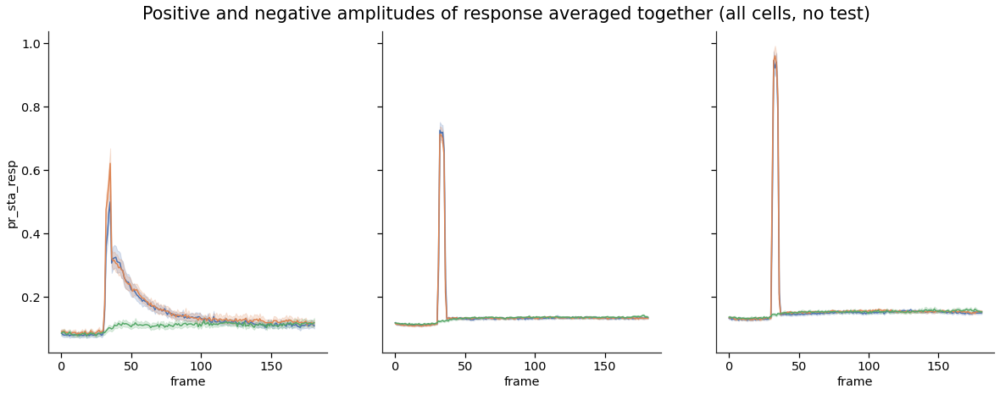

In [5]:
# ABSOLUTE ACTIVITY AVERAGE (i.e. positive + negative amplitudes averaged together)

cell_df = pd.read_pickle(cell_df_path)
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)

trial_type = ['random', 'sensory', 'sham']
target_type = ['pr_target', 'ps_target', 'pr_target']
responses = ['pr_sta_resp', 'ps_sta_resp', 'spont_sta_resp']

fig, axes = plt.subplots(nrows=1, ncols=3, sharey=True, sharex=True, figsize=(20,7))

for trial, target, response in zip(trial_type, target_type, responses):

    # filter dataframes using variables above
    s1_targets = cell_df[cell_df[target] & cell_df['s1_cell']].index
    s1_nontargets = cell_df[~cell_df[target] & cell_df['s1_cell']].index
    s2_nontargets = cell_df[~cell_df[target] & cell_df['s2_cell']].index
    
    # populate the plots with filtered data
    for col, cell_id_list in enumerate([s1_targets, s1_nontargets, s2_nontargets]):
        df_filter = cell_mean_timepoint_df['cell_id'].isin(cell_id_list)
        filtered_df = cell_mean_timepoint_df[df_filter]

        ax = axes[col]
        sns.lineplot(x=filtered_df['frame'], y=np.absolute(filtered_df[response]), estimator='mean', ci=95, data=filtered_df, ax=ax, 
                     label=trial, legend=False)

        display(fig)
        clear_output(wait = True)

# define plot titles, axes etc.
plt.suptitle('Positive and negative amplitudes of response averaged together (all cells, no test)', 
             y=0.94, fontsize='xx-large');

sign = ['positive-responder', 'negative-responder']
photostim_id = ['s1 target', 's1 non-target', 's2 non-target']

# for row_i, row in enumerate(axes):
#     for col_i, col in enumerate(row):
#         if row_i == 1: 
#             col.set_xlabel('timepoint (frames)')
#             col.legend()
#         if col_i == 0: col.set_ylabel('response (dFF)')
#         col.set_title(sign[row_i] + '\n' + photostim_id[col_i])
#         col.hlines(0, -50, 190, linestyles='dotted', zorder=4, alpha=0.5);
# #         col.set_ylim([-0.5, 0.5])
#         col.set_xlim([0, 182])

# save_path = os.path.join(qnap_path, session_type + '_DffTrace_TrialMean_lineplot_row_ResponseType_col_TargetID')
# ia.savePlot(save_path)

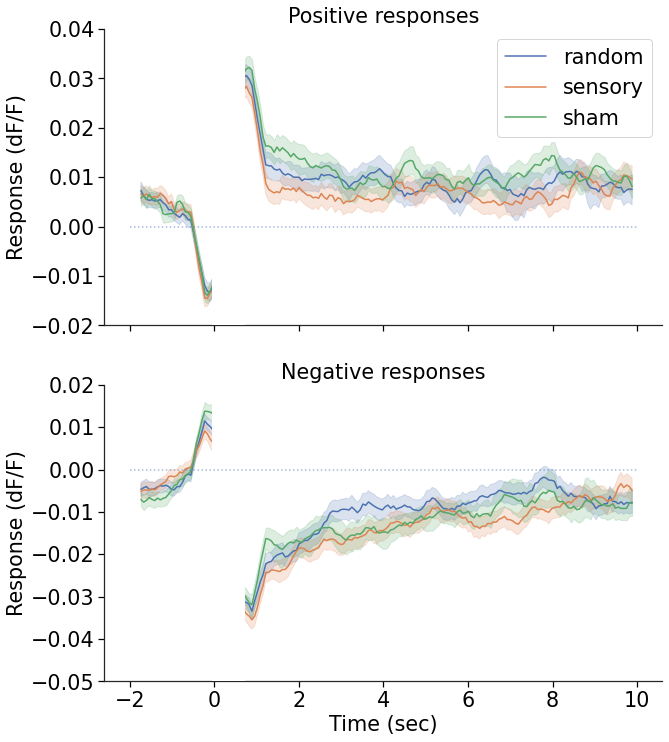

In [244]:
# GRAND AVERAGE OF ALL CELLS (POSITIVE AND NEGATIVE)

cell_df = pd.read_pickle(cell_df_path)
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)

remove_id = '2020-09-15_RL102'
cell_df = cell_df.query('session_id != @remove_id')
cell_mean_timepoint_df = cell_mean_timepoint_df.query('session_id != @remove_id')

trial_type = ['random', 'sensory', 'sham']
target_type = ['pr_target', 'ps_target', 'pr_target']
responses = ['pr_sta_resp', 'ps_sta_resp', 'spont_sta_resp']
resp_sign = ['pr_resp_sign', 'ps_resp_sign', 'spont_resp_sign']

fig, axes = plt.subplots(nrows=2, ncols=1, sharex=True, figsize=(10,12))

for trial, target, response, sign in zip(trial_type, target_type, responses, resp_sign):

    # filter dataframes using variables above
    s2_nontargets_pos = cell_df[~cell_df[target] & cell_df['s2_cell'] & cell_df[sign]].index
    s2_nontargets_neg = cell_df[~cell_df[target] & cell_df['s2_cell'] & ~cell_df[sign]].index
    
    # populate the plots with filtered data
    for col, cell_id_list in enumerate([s2_nontargets_pos,
                                        s2_nontargets_neg]):
        df_filter = cell_mean_timepoint_df['cell_id'].isin(cell_id_list)
        filtered_df = cell_mean_timepoint_df[df_filter]
        rolling_mean = filtered_df.groupby('cell_id').rolling(5).mean()[response]
        
        ax = axes[col]
        sns.lineplot(x=(filtered_df['frame'].to_numpy()*0.06565)-2, y=rolling_mean.to_numpy(), estimator='mean', ci=95, ax=ax, 
                     label=trial, legend=False)

        display(fig)
        clear_output(wait = True)

# construct patch to cover stim artifact period
for ax in axes:
    stim_patch = patches.Rectangle((-0.05,-100), 0.75, 999, zorder=3, color='white')
    ax.add_patch(stim_patch)

# define plot titles, axes etc.
# plt.suptitle('S1 target and S2 non-target responses on photostim and sham trials (grand average)', 
#              y=0.98, fontsize='xx-large');

axes[0].set_title('Positive responses')
axes[1].set_title('Negative responses')

for ax in axes:
    ax.set_xlabel('Time (sec)')
    ax.set_ylabel('Response (dF/F)')

axes[0].legend(['random', 'sensory', 'sham'], loc='upper right');

axes[0].hlines(0, -2, 10, linestyles='dotted', zorder=4, alpha=0.5);
axes[1].hlines(0, -2, 10, linestyles='dotted', zorder=4, alpha=0.5);

axes[0].set_ylim([-0.02, 0.04])
axes[1].set_ylim([-0.05, 0.02])

save_path = os.path.join(qnap_path, session_type + '_DffTrace_GrandAverage_lineplot_split_TrialType_ResponseSign')
ia.savePlot(save_path)

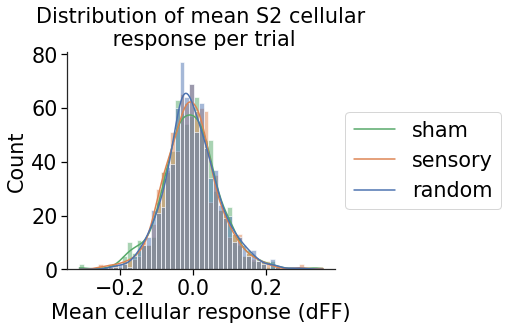

In [43]:
# PLOT DISTRIBUTION OF SUMMED S2 TRIAL RESPONSES

cell_df = pd.read_pickle(cell_df_path)
cell_trial_df = pd.read_pickle(cell_trial_df_path)

s2_cell_ids = cell_df.query('s2_cell').index
s2_df = cell_trial_df[cell_trial_df['cell_id'].isin(s2_cell_ids)]
long_df = s2_df.reset_index(drop=False).melt(id_vars=['trial_num', 'session_id'], value_vars=['pr_amp_resp', 'ps_amp_resp', 'spont_amp_resp'])
summed_df = long_df.groupby(['trial_num', 'session_id', 'variable']).mean()

summed_df[summed_df['value']==0] = np.nan

sns.histplot(kde=True, data=summed_df.reset_index(), hue='variable', x='value');

axes = plt.gca()
box = axes.get_position()
axes.set_position([box.x0, box.y0, box.width * 0.8, box.height])
axes.legend(['sham', 'sensory', 'random'], loc='center left', bbox_to_anchor=(1, 0.5))
plt.xlabel('Mean cellular response (dFF)')
plt.title('Distribution of mean S2 cellular\n response per trial');

pr, spont WilcoxonResult(statistic=3627350.0, pvalue=0.49661087376677304)
ps, spont WilcoxonResult(statistic=3365864.0, pvalue=6.919119924148003e-06)
pr, ps WilcoxonResult(statistic=3400875.0, pvalue=6.742791825597881e-05)


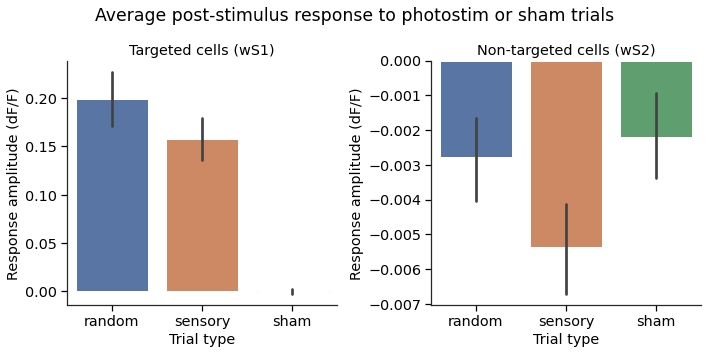

In [6]:
# GRAND AVERAGE OF ALL CELLS (POSITIVE AND NEGATIVE)

cell_df = pd.read_pickle(cell_df_path)

trial_type = ['pr', 'ps', 'spont']
trial_cats = ['random', 'sensory', 'sham']
target_type = ['pr_target', 'ps_target', 'pr_target']

df = pd.DataFrame()

for trial, target, trial_cat in zip(trial_type, target_type, trial_cats):

    # filter dataframes using variables above
    s1_targets = cell_df[cell_df[target] & cell_df['s1_cell']].index
#     s1_nontargets = cell_df[~cell_df[target] & cell_df['s1_cell']].index
    s2_nontargets = cell_df[~cell_df[target] & cell_df['s2_cell']].index
    
    # populate the plots with filtered data
    for i, cell_id_list in enumerate([s1_targets, 
#                                         s1_nontargets,
                                      s2_nontargets]):
        
        filtered_df = cell_df.loc[cell_id_list,:]
        
        if i == 0: target_type = np.repeat(True, len(filtered_df))
        else: target_type = np.repeat(False, len(filtered_df))
            
        temp_df = pd.DataFrame({
            'trial' : np.repeat(trial_cat, len(filtered_df)),
            'target' : target_type,
            'response_amplitude' : filtered_df[trial + '_sta_amp_resp']
        })
        
        df = pd.concat([df, temp_df])

pr = df[(df['trial']=='random') & (df['target']==False)]['response_amplitude'].to_numpy()
ps = df[(df['trial']=='sensory') & (df['target']==False)]['response_amplitude'].to_numpy()
spont = df[(df['trial']=='sham') & (df['target']==False)]['response_amplitude'].to_numpy()

print('pr, spont', stats.wilcoxon(pr, spont))
print('ps, spont', stats.wilcoxon(ps, spont))
print('pr, ps', stats.wilcoxon(pr, ps))
        
g = sns.catplot(kind='bar', col='target', col_order=[True, False], x='trial', data=df, y='response_amplitude', sharey=False)

axes = g.axes[0]

axes[0].set_title('Targeted cells (wS1)')
axes[1].set_title('Non-targeted cells (wS2)')

for ax in axes:
    ax.set_ylabel('Response amplitude (dF/F)')
    ax.set_xlabel('Trial type');
    
plt.suptitle('Average post-stimulus response to photostim or sham trials', y=0.98, fontsize='x-large')
plt.tight_layout()

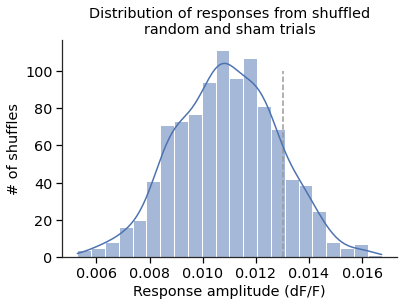

In [9]:
trial_filter = ((df.trial == 'random') | (df.trial == 'sham')) & (df.target == False)

mean_response = []

for i in range(0,1000):
    rand_sample = df[trial_filter].sample(n=3463, replace=False)
    
    mean_response.append(rand_sample.mean()['response_amplitude'])
    
sns.histplot(mean_response, kde=True)

trial_filter = (df.trial == 'sensory') & (df.target == False)

plt.vlines(df[trial_filter].mean()['response_amplitude'], 0, 100, color='0.6', linestyle='--')

plt.title('Distribution of responses from shuffled\nrandom and sham trials')
plt.xlabel('Response amplitude (dF/F)')
plt.ylabel('# of shuffles');

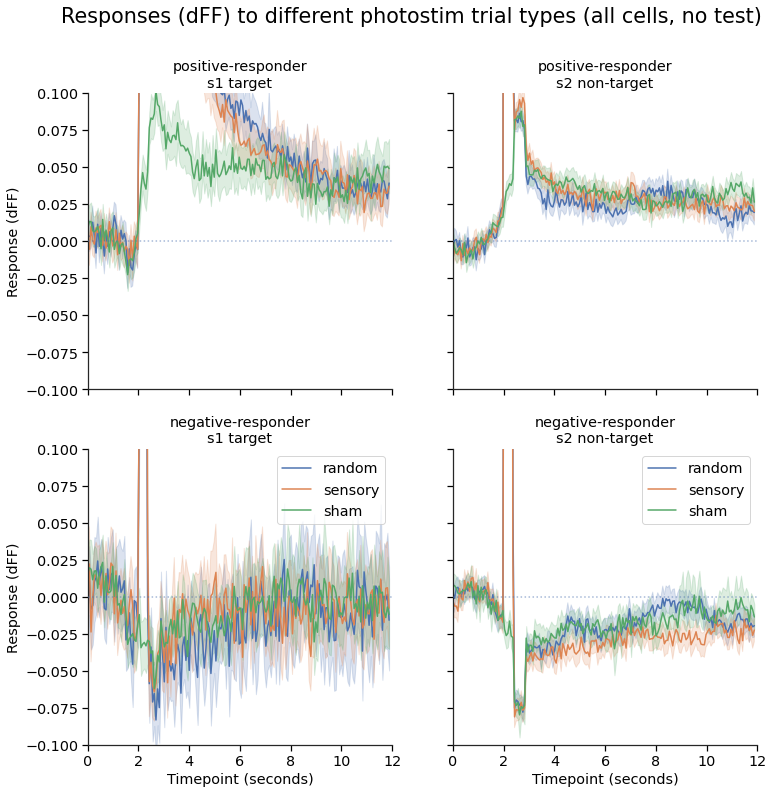

In [10]:
# AVERAGE SPLIT POSITIVE AND NEGATIVE (based on 500 ms pre and post stim, so end up with blips)

cell_df = pd.read_pickle(cell_df_path)
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)

trial_type = ['random', 'sensory', 'sham']
target_type = ['pr_target', 'ps_target', 'pr_target']
resp_sign = ['pr_resp_sign', 'ps_resp_sign', 'spont_resp_sign']
responses = ['pr_sta_resp', 'ps_sta_resp', 'spont_sta_resp']

fig, axes = plt.subplots(nrows=2, ncols=2, sharey=True, sharex=True, figsize=(12,12))

for trial, target, sign, response in zip(trial_type, target_type, resp_sign, responses):

    # filter dataframes using variables above
    s1_targets_pos = cell_df[cell_df[target] & cell_df['s1_cell'] & cell_df[sign]].index
    s1_nontargets_pos = cell_df[~cell_df[target] & cell_df['s1_cell'] & cell_df[sign]].index
    s2_nontargets_pos = cell_df[~cell_df[target] & cell_df['s2_cell'] & cell_df[sign]].index

    s1_targets_neg = cell_df[cell_df[target] & cell_df['s1_cell'] & ~cell_df[sign]].index
    s1_nontargets_neg = cell_df[~cell_df[target] & cell_df['s1_cell'] & ~cell_df[sign]].index
    s2_nontargets_neg = cell_df[~cell_df[target] & cell_df['s2_cell'] & ~cell_df[sign]].index
    
    # populate the plots with filtered data
    for row, cell_id_lists in enumerate([[s1_targets_pos, s2_nontargets_pos],
                                         [s1_targets_neg, s2_nontargets_neg]                              
                                        ]):
        for col, cell_id_list in enumerate(cell_id_lists):
            
            df_filter = cell_mean_timepoint_df['cell_id'].isin(cell_id_list)
            filtered_df = cell_mean_timepoint_df[df_filter]
            
            ax = axes[row,col]
            sns.lineplot(x=filtered_df['frame']*0.06565, y=response, estimator='mean', ci=95, data=filtered_df, ax=ax, 
                         label=trial, legend=False)
            
            display(fig)
            clear_output(wait = True)

# define plot titles, axes etc.
plt.suptitle('Responses (dFF) to different photostim trial types (all cells, no test)', 
             y=0.98, fontsize='xx-large');

sign = ['positive-responder', 'negative-responder']
photostim_id = ['s1 target', 's2 non-target']

for row_i, row in enumerate(axes):
    for col_i, col in enumerate(row):
        if row_i == 1: 
            col.set_xlabel('Timepoint (seconds)')
            col.legend()
        if col_i == 0: col.set_ylabel('Response (dFF)')
        col.set_title(sign[row_i] + '\n' + photostim_id[col_i])
        col.hlines(0, -50, 190, linestyles='dotted', zorder=4, alpha=0.5);
        if col_i == 1: col.set_ylim([-0.1, 0.1])
        col.set_xlim([0, 12])

save_path = os.path.join(qnap_path, session_type + '_DffTrace_TrialMean_lineplot_row_ResponseType_col_TargetID')
# ia.savePlot(save_path)

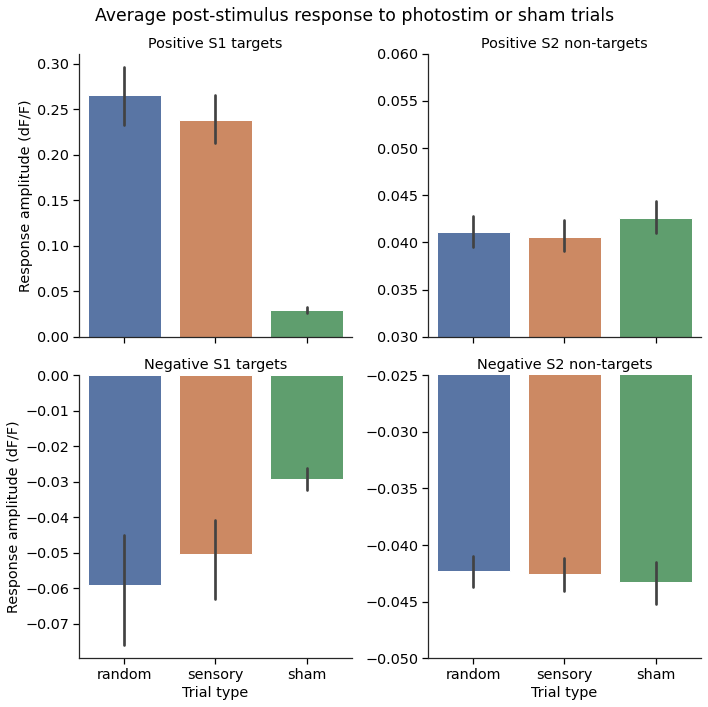

In [12]:
# GRAND AVERAGE OF ALL CELLS (POSITIVE AND NEGATIVE)

cell_df = pd.read_pickle(cell_df_path)
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)

trial_type = ['pr', 'ps', 'spont']
trial_cats = ['random', 'sensory', 'sham']
resp_sign = ['pr_resp_sign', 'ps_resp_sign', 'spont_resp_sign']
target_type = ['pr_target', 'ps_target', 'pr_target']

df = pd.DataFrame()

for trial, target, trial_cat, sign in zip(trial_type, target_type, trial_cats, resp_sign):

    # filter dataframes using variables above
    s1_targets_pos = cell_df[cell_df[target] & cell_df['s1_cell'] & cell_df[sign]].index
    s2_nontargets_pos = cell_df[~cell_df[target] & cell_df['s2_cell'] & cell_df[sign]].index

    s1_targets_neg = cell_df[cell_df[target] & cell_df['s1_cell'] & ~cell_df[sign]].index
    s2_nontargets_neg = cell_df[~cell_df[target] & cell_df['s2_cell'] & ~cell_df[sign]].index
    
    # populate the plots with filtered data
    for cell_id_lists in [[s1_targets_pos, s2_nontargets_pos],
                          [s1_targets_neg, s2_nontargets_neg]
                         ]:
        for i, cell_id_list in enumerate(cell_id_lists):
            
            filtered_df = cell_df.loc[cell_id_list,:]

            if i == 0: target_type = np.repeat(True, len(filtered_df))
            else: target_type = np.repeat(False, len(filtered_df))

            temp_df = pd.DataFrame({
                'trial' : np.repeat(trial_cat, len(filtered_df)),
                'target' : target_type,
                'response_amplitude' : filtered_df[trial + '_sta_amp_resp'],
                'sign' : filtered_df[sign]
            })

            df = pd.concat([df, temp_df])

g = sns.catplot(kind='bar', col='target', col_order=[True, False], row='sign', row_order=[True, False], x='trial', data=df, y='response_amplitude', sharey=False)

axes = g.axes

axes[0,0].set_title('Positive S1 targets')
axes[0,1].set_title('Positive S2 non-targets')
axes[1,0].set_title('Negative S1 targets')
axes[1,1].set_title('Negative S2 non-targets')

axes[0,0].set_ylabel('Response amplitude (dF/F)')
axes[1,0].set_ylabel('Response amplitude (dF/F)')
axes[1,1].set_xlabel('Trial type');
axes[1,0].set_xlabel('Trial type');

axes[0,1].set_ylim([0.03, 0.06])
axes[1,1].set_ylim([-0.05, -0.025])

plt.suptitle('Average post-stimulus response to photostim or sham trials', y=0.98, fontsize='x-large')
plt.tight_layout()

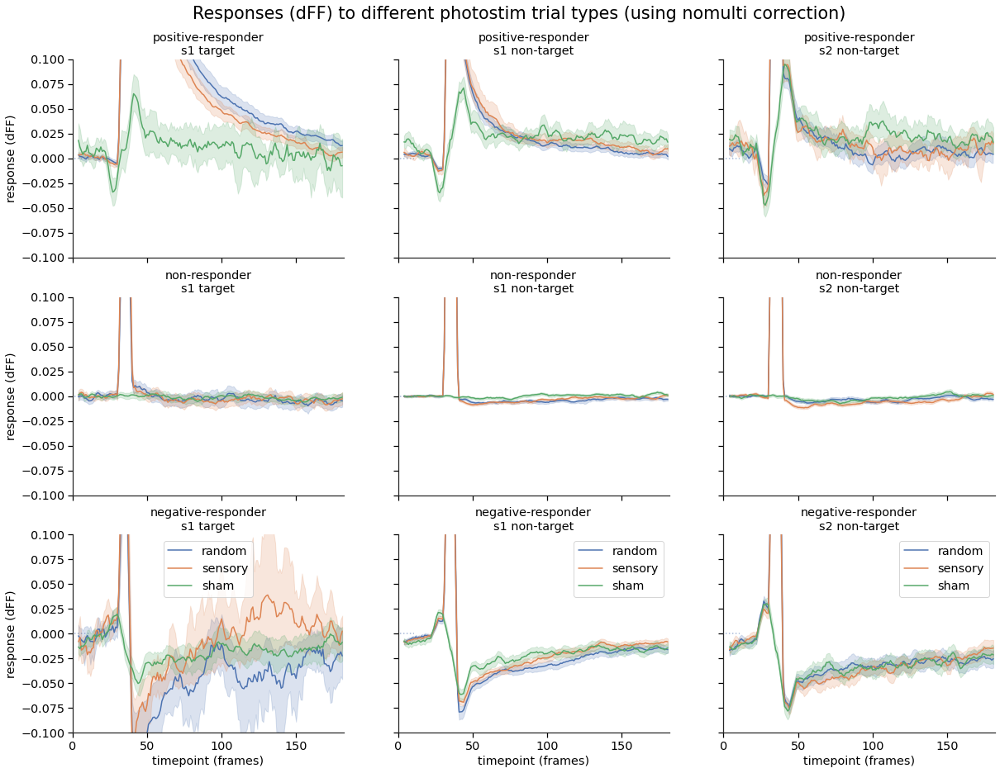

In [23]:
# TRACE GRAND AVERAGE FOR CELLS PASSING STATISTICAL TEST, SPLIT BY POS/NEG/NON

cell_df = pd.read_pickle(cell_df_path)
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)

# list of column names to be used to filter the dataframe
test_type = 'nomulti'
if test_type == 'fdr':
    stat_test = ['sta_sig_pr', 'sta_sig_ps', 'sta_sig_spont']
if test_type == 'nomulti':
    stat_test = ['sta_sig_nomulti_pr', 'sta_sig_nomulti_ps', 'sta_sig_nomulti_spont']
trial_type = ['random', 'sensory', 'sham']
target_type = ['pr_target', 'ps_target', 'pr_target']
resp_sign = ['pr_resp_sign', 'ps_resp_sign', 'spont_resp_sign']
responses = ['pr_sta_resp', 'ps_sta_resp', 'spont_sta_resp']

fig, axes = plt.subplots(nrows=3, ncols=3, sharey=True, sharex=True, figsize=(20,15))

for test, trial, target, sign, response in zip(stat_test, trial_type, target_type, resp_sign, responses):

    # filter dataframes using variables above
    s1_targets_pos = cell_df[cell_df[test] & cell_df[target] & cell_df['s1_cell'] & cell_df[sign]].index
    s1_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & cell_df[sign]].index
    s2_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & cell_df[sign]].index

    s1_targets_neg = cell_df[cell_df[test] & cell_df[target] & cell_df['s1_cell'] & ~cell_df[sign]].index
    s1_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & ~cell_df[sign]].index
    s2_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & ~cell_df[sign]].index

    s1_targets_non = cell_df[~cell_df[test] & cell_df[target] & cell_df['s1_cell']].index
    s1_nontargets_non = cell_df[~cell_df[test] & ~cell_df[target] & cell_df['s1_cell']].index
    s2_nontargets_non = cell_df[~cell_df[test] & ~cell_df[target] & cell_df['s2_cell']].index
    
    # populate the plots with filtered data
    for row, cell_id_lists in enumerate([[s1_targets_pos, s1_nontargets_pos, s2_nontargets_pos],
                                         [s1_targets_non, s1_nontargets_non, s2_nontargets_non],
                                         [s1_targets_neg, s1_nontargets_neg, s2_nontargets_neg]                              
                                        ]):
        for col, cell_id_list in enumerate(cell_id_lists):
            
            df_filter = cell_mean_timepoint_df['cell_id'].isin(cell_id_list)
            filtered_df = cell_mean_timepoint_df[df_filter]
            rolling_mean = filtered_df.groupby('cell_id').rolling(5).mean()[response]
            
            ax = axes[row,col]
            sns.lineplot(x='frame', y=rolling_mean.to_numpy(), estimator='mean', ci=95, data=filtered_df, ax=ax, 
                         label=trial, legend=False)

# define plot titles, axes etc.
plt.suptitle('Responses (dFF) to different photostim trial types (using ' + test_type + ' correction)', 
             y=0.94, fontsize='xx-large');

sign = ['positive-responder', 'non-responder', 'negative-responder']
photostim_id = ['s1 target', 's1 non-target', 's2 non-target']

for row_i, row in enumerate(axes):
    for col_i, col in enumerate(row):
        if row_i == 2: 
            col.set_xlabel('timepoint (frames)')
            col.legend()
        
        col.set_title(sign[row_i] + '\n' + photostim_id[col_i])
        col.hlines(0, -3, 11, linestyles='dotted', zorder=4, alpha=0.5);
        col.set_ylim([-0.1, 0.1])
        
        if col_i == 0: 
            col.set_ylabel('response (dFF)')
            col.set_ylim([-0.5, 0.5])
            
#         col.set_xlim([-2, 10])
        col.set_xlim([0, 182])

save_path = os.path.join(qnap_path, session_type + '_DffTrace_TrialMean_' + test_type + 
                         '_lineplot_row_ResponseType_col_TargetID')
# ia.savePlot(save_path)

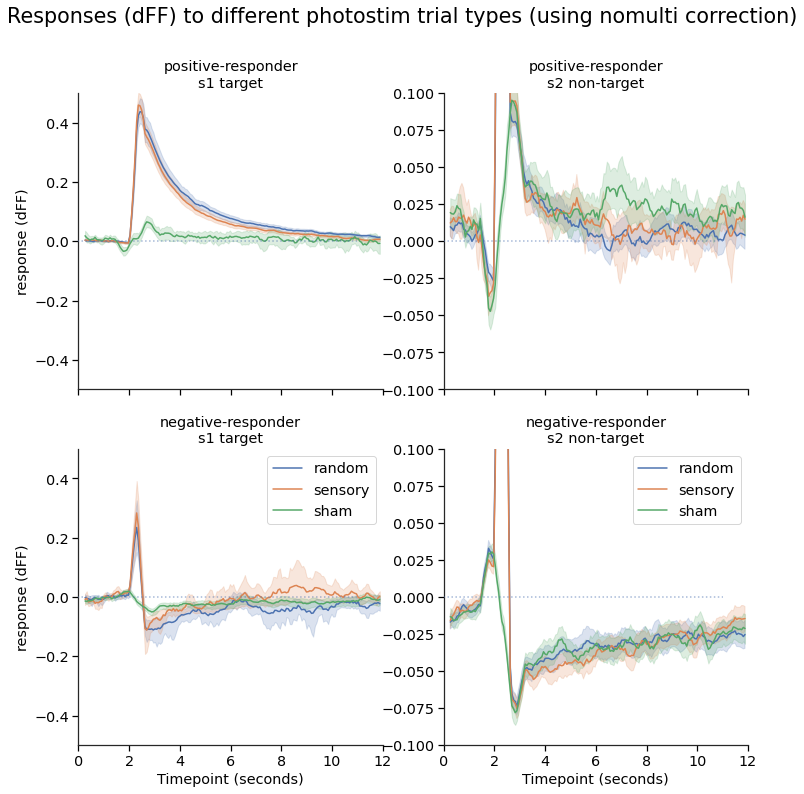

In [25]:
# TRACE GRAND AVERAGE WITHOUT NON-TARGET S1 AND NON-RESPONDERS FOR CELLS PASSING STATISTICAL TEST, SPLIT POS/NEG 

cell_df = pd.read_pickle(cell_df_path)
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)

# list of column names to be used to filter the dataframe
test_type = 'nomulti'
if test_type == 'fdr':
    stat_test = ['sta_sig_pr', 'sta_sig_ps', 'sta_sig_spont']
if test_type == 'nomulti':
    stat_test = ['sta_sig_nomulti_pr', 'sta_sig_nomulti_ps', 'sta_sig_nomulti_spont']
trial_type = ['random', 'sensory', 'sham']
target_type = ['pr_target', 'ps_target', 'pr_target']
resp_sign = ['pr_resp_sign', 'ps_resp_sign', 'spont_resp_sign']
responses = ['pr_sta_resp', 'ps_sta_resp', 'spont_sta_resp']

fig, axes = plt.subplots(nrows=2, ncols=2, sharex=True, figsize=(12,12))

for test, trial, target, sign, response in zip(stat_test, trial_type, target_type, resp_sign, responses):

    # filter dataframes using variables above
    s1_targets_pos = cell_df[cell_df[test] & cell_df[target] & cell_df['s1_cell'] & cell_df[sign]].index
    s1_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & cell_df[sign]].index
    s2_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & cell_df[sign]].index

    s1_targets_neg = cell_df[cell_df[test] & cell_df[target] & cell_df['s1_cell'] & ~cell_df[sign]].index
    s1_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & ~cell_df[sign]].index
    s2_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & ~cell_df[sign]].index

    s1_targets_non = cell_df[~cell_df[test] & cell_df[target] & cell_df['s1_cell']].index
    s1_nontargets_non = cell_df[~cell_df[test] & ~cell_df[target] & cell_df['s1_cell']].index
    s2_nontargets_non = cell_df[~cell_df[test] & ~cell_df[target] & cell_df['s2_cell']].index
    
    # populate the plots with filtered data
    for row, cell_id_lists in enumerate([[s1_targets_pos, s2_nontargets_pos],
                                         [s1_targets_neg, s2_nontargets_neg]                              
                                        ]):
        for col, cell_id_list in enumerate(cell_id_lists):
            
            df_filter = cell_mean_timepoint_df['cell_id'].isin(cell_id_list)
            filtered_df = cell_mean_timepoint_df[df_filter]
            rolling_mean = filtered_df.groupby('cell_id').rolling(5).mean()[response]
            
            ax = axes[row,col]
            sns.lineplot(x=filtered_df['frame']*0.06565, y=rolling_mean.to_numpy(), estimator='mean', ci=95, data=filtered_df, ax=ax, 
                         label=trial, legend=False)

# define plot titles, axes etc.
plt.suptitle('Responses (dFF) to different photostim trial types (using ' + test_type + ' correction)', 
             y=0.98, fontsize='xx-large');

sign = ['positive-responder', 
#         'non-responder', 
        'negative-responder']
photostim_id = ['s1 target', 
#                 's1 non-target', 
                's2 non-target']

for row_i, row in enumerate(axes):
    for col_i, col in enumerate(row):
        if row_i == 1: 
            col.set_xlabel('Timepoint (seconds)')
            col.legend()
        
        col.set_title(sign[row_i] + '\n' + photostim_id[col_i])
        col.hlines(0, -3, 11, linestyles='dotted', zorder=4, alpha=0.5);
        col.set_ylim([-0.1, 0.1])
        
        if col_i == 0: 
            col.set_ylabel('response (dFF)')
            col.set_ylim([-0.5, 0.5])
            
#         col.set_xlim([-2, 10])
        col.set_xlim([0, 12])

save_path = os.path.join(qnap_path, session_type + '_DffTrace_TrialMean_' + test_type + 
                         '_lineplot_row_ResponseType_col_TargetID')
# ia.savePlot(save_path)

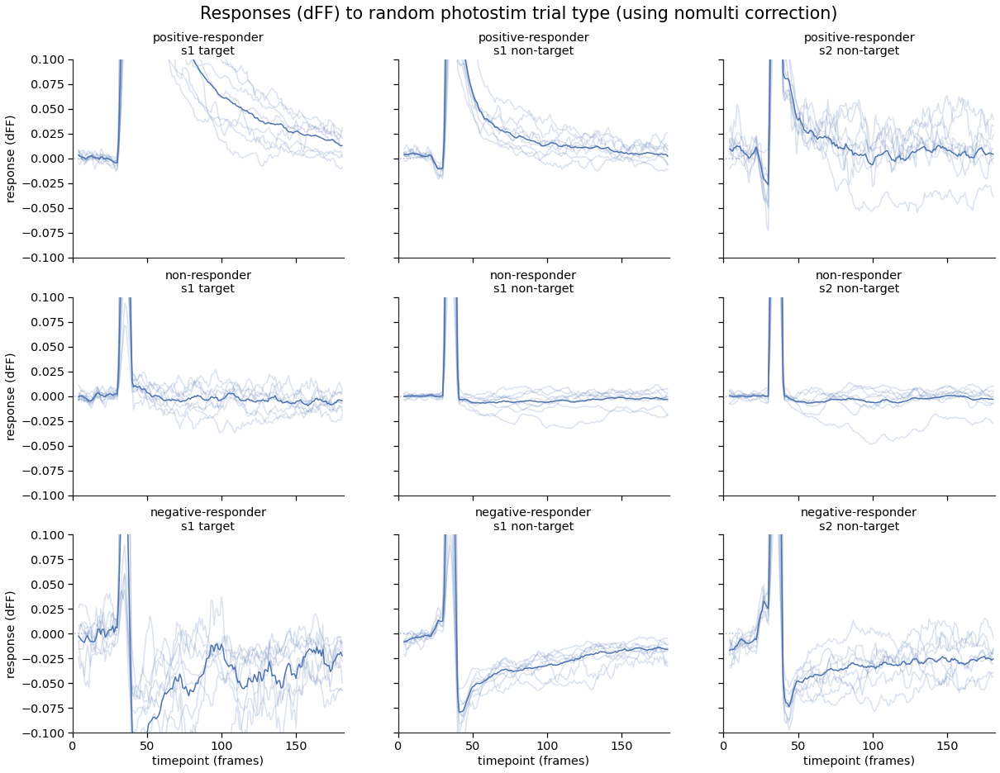

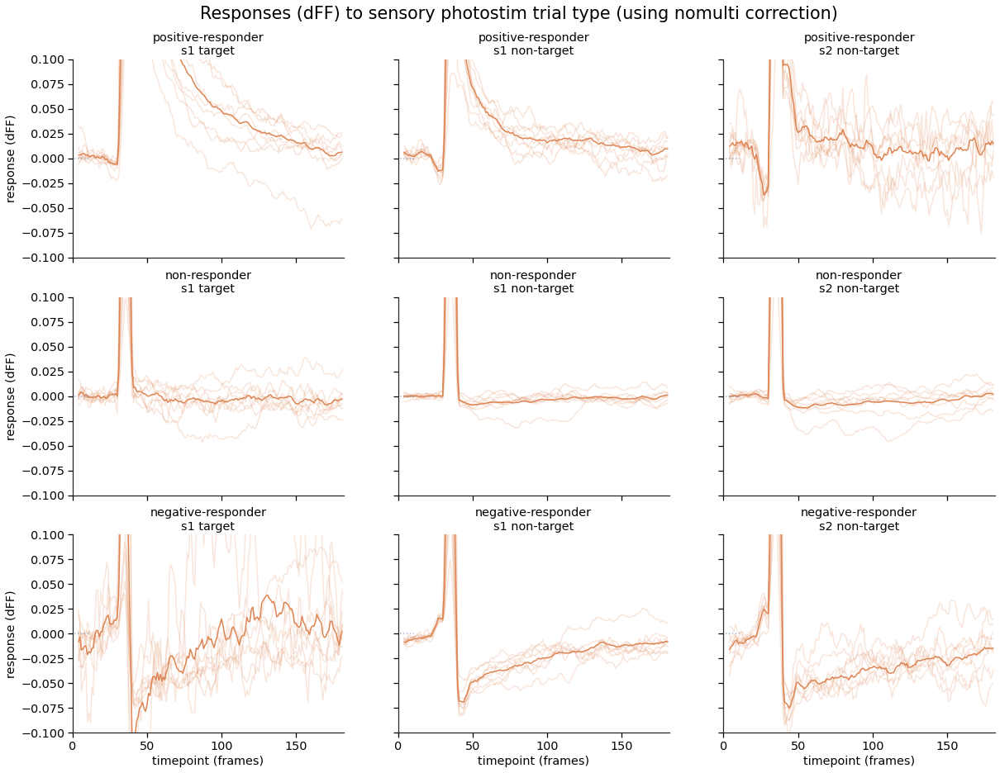

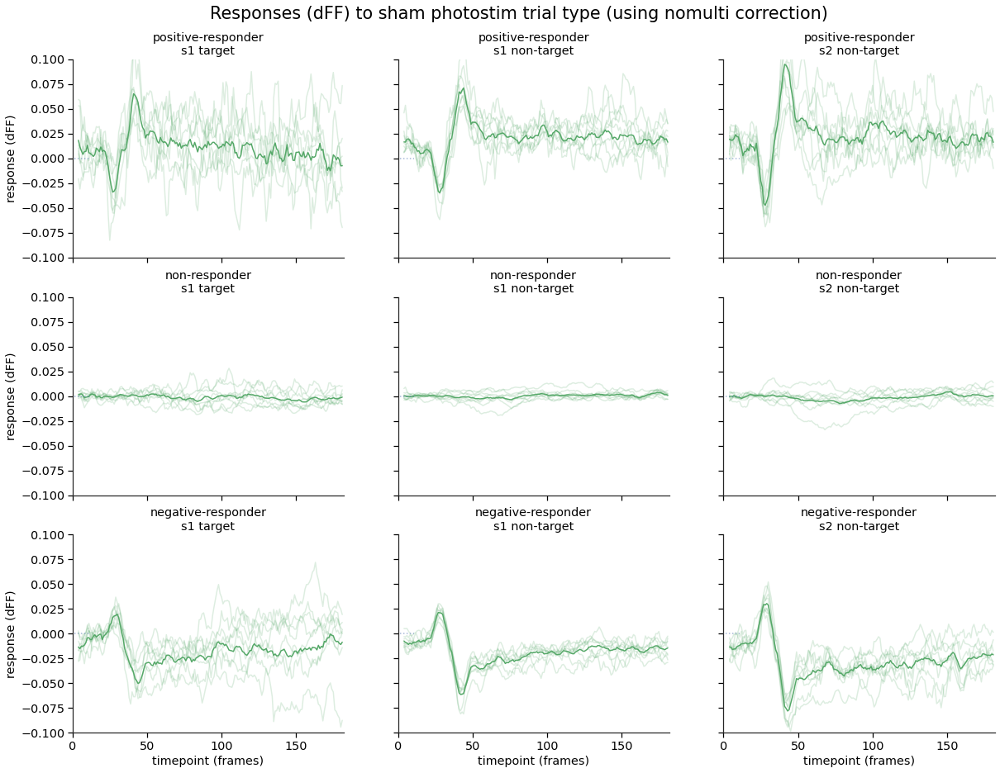

In [29]:
# TRACE AVERAGE PER ANIMAL (+ GRAND MEAN), FOR CELLS PASSING STATISTICAL TEST, SPLIT POS/NON/NEG

cell_df = pd.read_pickle(cell_df_path)
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)

# list of column names to be used to filter the dataframe
test_type = 'nomulti'
if test_type == 'fdr':
    stat_test = ['sta_sig_pr', 'sta_sig_ps', 'sta_sig_spont']
if test_type == 'nomulti':
    stat_test = ['sta_sig_nomulti_pr', 'sta_sig_nomulti_ps', 'sta_sig_nomulti_spont']
trial_type = ['random', 'sensory', 'sham']
target_type = ['pr_target', 'ps_target', 'pr_target']
resp_sign = ['pr_resp_sign', 'ps_resp_sign', 'spont_resp_sign']
responses = ['pr_sta_resp', 'ps_sta_resp', 'spont_sta_resp']
colors=['C0','C1','C2']

for test, trial, target, sign, response, color in zip(stat_test, trial_type, target_type, resp_sign, 
                                                      responses, colors):

    fig, axes = plt.subplots(nrows=3, ncols=3, sharey=True, sharex=True, figsize=(20,15))
    
    # filter dataframes using variables above
    s1_targets_pos = cell_df[cell_df[test] & cell_df[target] & cell_df['s1_cell'] & cell_df[sign]].index
    s1_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & cell_df[sign]].index
    s2_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & cell_df[sign]].index

    s1_targets_neg = cell_df[cell_df[test] & cell_df[target] & cell_df['s1_cell'] & ~cell_df[sign]].index
    s1_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & ~cell_df[sign]].index
    s2_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & ~cell_df[sign]].index

    s1_targets_non = cell_df[~cell_df[test] & cell_df[target] & cell_df['s1_cell']].index
    s1_nontargets_non = cell_df[~cell_df[test] & ~cell_df[target] & cell_df['s1_cell']].index
    s2_nontargets_non = cell_df[~cell_df[test] & ~cell_df[target] & cell_df['s2_cell']].index
    
    # populate the plots with filtered data
    for row, cell_id_lists in enumerate([[s1_targets_pos, s1_nontargets_pos, s2_nontargets_pos],
                                         [s1_targets_non, s1_nontargets_non, s2_nontargets_non],
                                         [s1_targets_neg, s1_nontargets_neg, s2_nontargets_neg]                              
                                        ]):
        for col, cell_id_list in enumerate(cell_id_lists):
            df_filter = cell_mean_timepoint_df['cell_id'].isin(cell_id_list)
            filtered_df = cell_mean_timepoint_df[df_filter]
            groups = filtered_df.groupby('session_id')
            
            ax = axes[row,col]
            for group in groups:
                rolling_mean = group[1].groupby('cell_id').rolling(5).mean()[response]
                sns.lineplot(x='frame', y=rolling_mean.to_numpy(), estimator='mean', ci=None, data=group[1], 
                             color=color, alpha=0.2, ax=ax)
            rolling_mean = filtered_df.groupby('cell_id').rolling(5).mean()[response]
            sns.lineplot(x='frame', y=rolling_mean.to_numpy(), estimator='mean', ci=None, data=filtered_df, 
                         color=color, ax=ax)

    # define plot titles, axes etc.
    plt.suptitle('Responses (dFF) to ' + trial + ' photostim trial type (using ' + test_type + ' correction)', 
                 y=0.94, fontsize='xx-large');

    sign = ['positive-responder', 'non-responder', 'negative-responder']
    photostim_id = ['s1 target', 's1 non-target', 's2 non-target']

    for row_i, row in enumerate(axes):
        for col_i, col in enumerate(row):
            if row_i == 2: 
                col.set_xlabel('timepoint (frames)')
            if col_i == 0: col.set_ylabel('response (dFF)')
            col.set_title(sign[row_i] + '\n' + photostim_id[col_i])
            col.hlines(0, -3, 11, linestyles='dotted', zorder=4, alpha=0.5);

            col.set_ylim([-0.1, 0.1])
        
            if col_i == 0: 
                col.set_ylabel('response (dFF)')
                col.set_ylim([-0.5, 0.5])

            col.set_xlim([0, 182])

    save_path = os.path.join(qnap_path, session_type + '_DffTrace_'+trial+'_TrialMean_' + 
                             test_type + '_lineplot_row_ResponseType_col_TargetID')
#     ia.savePlot(save_path)

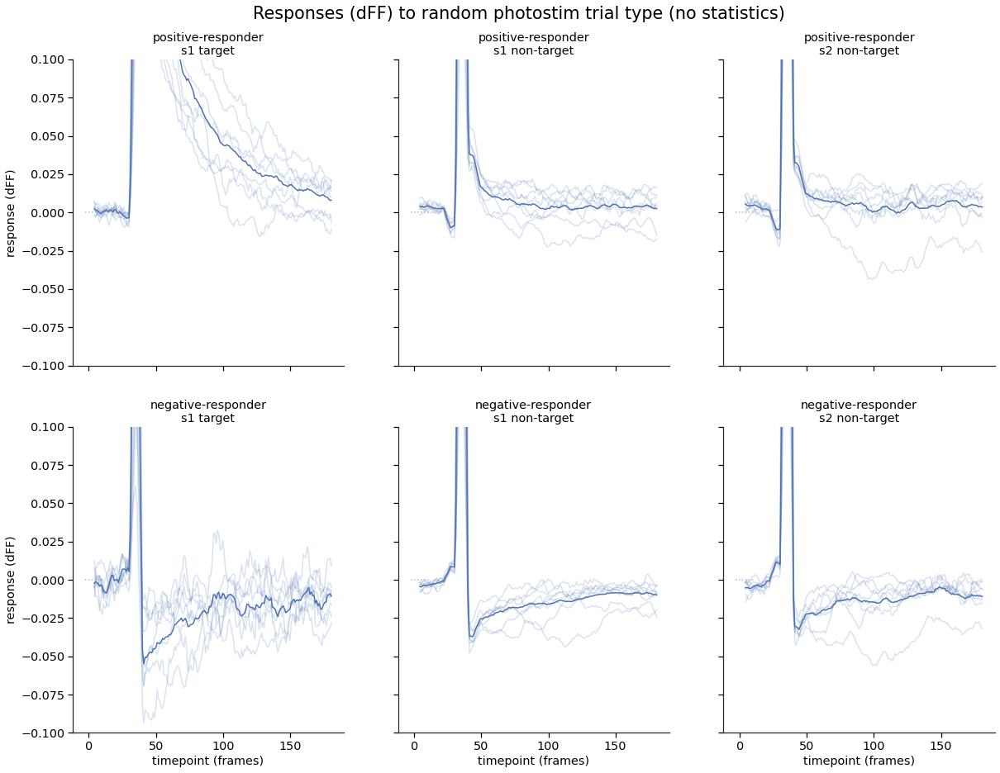

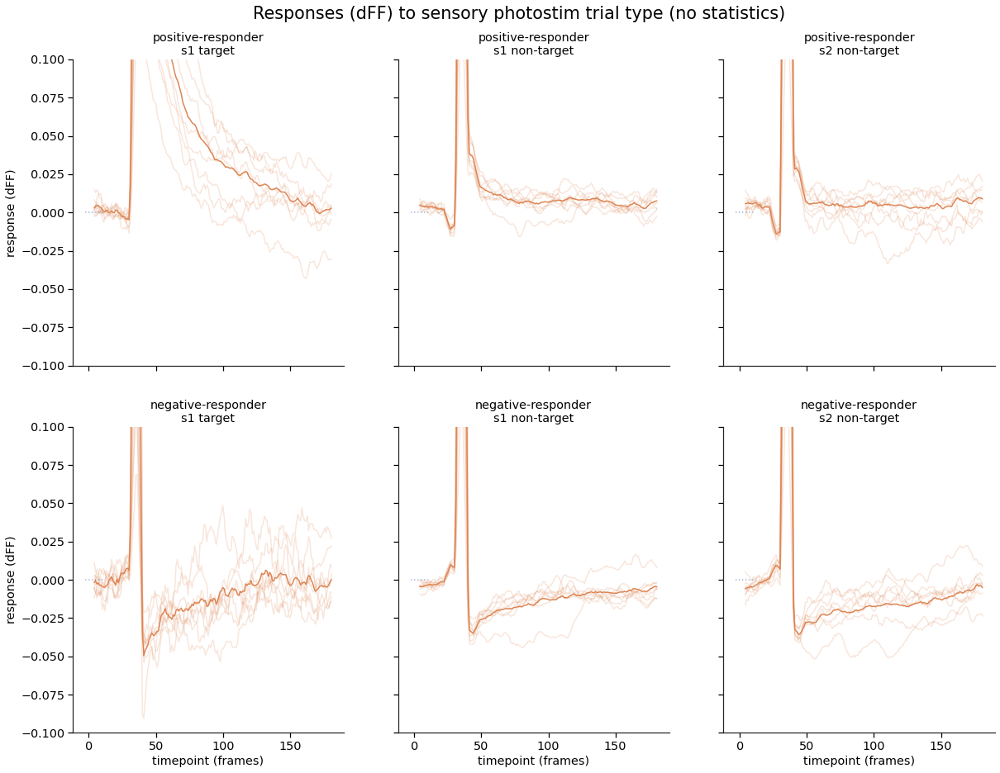

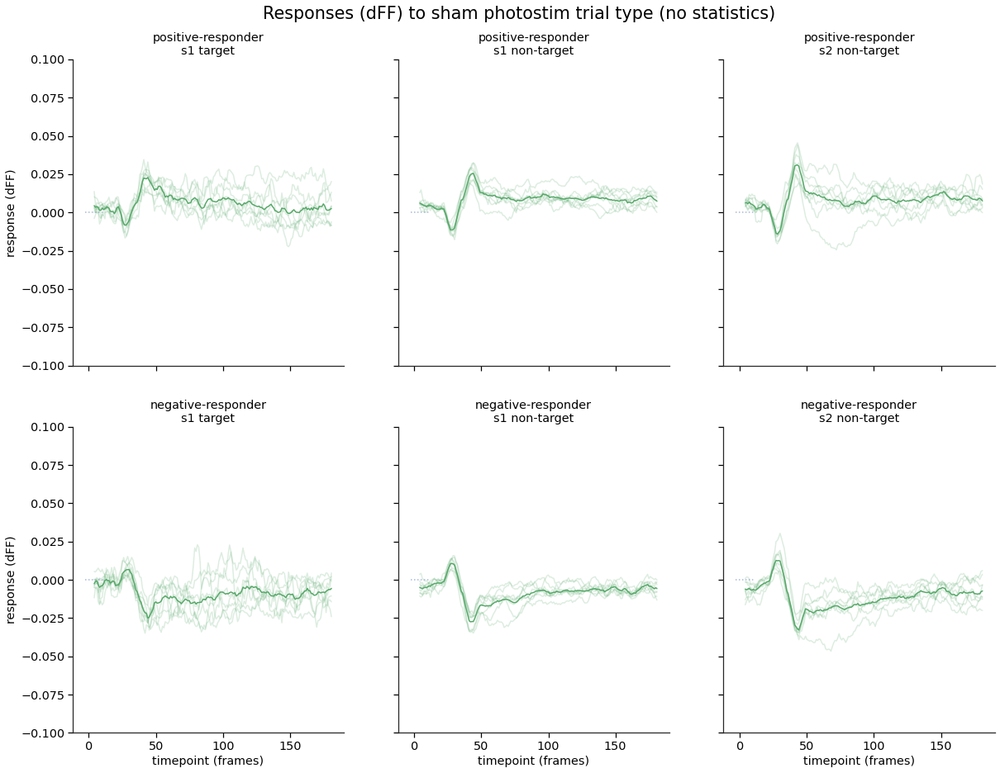

In [33]:
# TRACE AVERAGE PER ANIMAL WITHOUT NON-RESPONDER, REGARDLESS OF STATISTICAL TEST, SPLIT POS/NEG

cell_df = pd.read_pickle(cell_df_path)
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)

# list of column names to be used to filter the dataframe
trial_type = ['random', 'sensory', 'sham']
target_type = ['pr_target', 'ps_target', 'pr_target']
resp_sign = ['pr_resp_sign', 'ps_resp_sign', 'spont_resp_sign']
responses = ['pr_sta_resp', 'ps_sta_resp', 'spont_sta_resp']
colors=['C0','C1','C2']

for trial, target, sign, response, color in zip(trial_type, target_type, resp_sign, 
                                                      responses, colors):

    fig, axes = plt.subplots(nrows=2, ncols=3, sharey=True, sharex=True, figsize=(20,15))
    
    # filter dataframes using variables above
    s1_targets_pos = cell_df[cell_df[target] & cell_df['s1_cell'] & cell_df[sign]].index
    s1_nontargets_pos = cell_df[~cell_df[target] & cell_df['s1_cell'] & cell_df[sign]].index
    s2_nontargets_pos = cell_df[~cell_df[target] & cell_df['s2_cell'] & cell_df[sign]].index

    s1_targets_neg = cell_df[cell_df[target] & cell_df['s1_cell'] & ~cell_df[sign]].index
    s1_nontargets_neg = cell_df[~cell_df[target] & cell_df['s1_cell'] & ~cell_df[sign]].index
    s2_nontargets_neg = cell_df[~cell_df[target] & cell_df['s2_cell'] & ~cell_df[sign]].index
    
    # populate the plots with filtered data
    for row, cell_id_lists in enumerate([[s1_targets_pos, s1_nontargets_pos, s2_nontargets_pos],
                                         [s1_targets_neg, s1_nontargets_neg, s2_nontargets_neg]                              
                                        ]):
        for col, cell_id_list in enumerate(cell_id_lists):
            
            df_filter = cell_mean_timepoint_df['cell_id'].isin(cell_id_list)
            filtered_df = cell_mean_timepoint_df[df_filter]
            groups = filtered_df.groupby('session_id')
            
            ax = axes[row,col]
            for group in groups:
                rolling_mean = group[1].groupby('cell_id').rolling(5).mean()[response]
                sns.lineplot(x='frame', y=rolling_mean.to_numpy(), estimator='mean', ci=None, data=group[1], 
                             color=color, alpha=0.2, ax=ax)
            rolling_mean = filtered_df.groupby('cell_id').rolling(5).mean()[response]
            sns.lineplot(x='frame', y=rolling_mean.to_numpy(), estimator='mean', ci=None, data=filtered_df, 
                         color=color, ax=ax)

    # define plot titles, axes etc.
    plt.suptitle('Responses (dFF) to ' + trial + ' photostim trial type (no statistics)', 
                 y=0.94, fontsize='xx-large');

    sign = ['positive-responder', 
#             'non-responder', 
            'negative-responder']
    photostim_id = ['s1 target', 
                    's1 non-target', 
                    's2 non-target']

    for row_i, row in enumerate(axes):
        for col_i, col in enumerate(row):
            if row_i == 1: 
                col.set_xlabel('timepoint (frames)')
            if col_i == 0: col.set_ylabel('response (dFF)')
            col.set_title(sign[row_i] + '\n' + photostim_id[col_i])
            col.hlines(0, -3, 11, linestyles='dotted', zorder=4, alpha=0.5);
            col.set_ylim([-0.1, 0.1])
        
            if col_i == 0: 
                col.set_ylabel('response (dFF)')
                col.set_ylim([-0.5, 0.5])

    save_path = os.path.join(qnap_path, session_type + '_DffTrace_'+trial+'_TrialMean_' + 
                             test_type + '_lineplot_row_ResponseType_col_TargetID')
#     ia.savePlot(save_path)

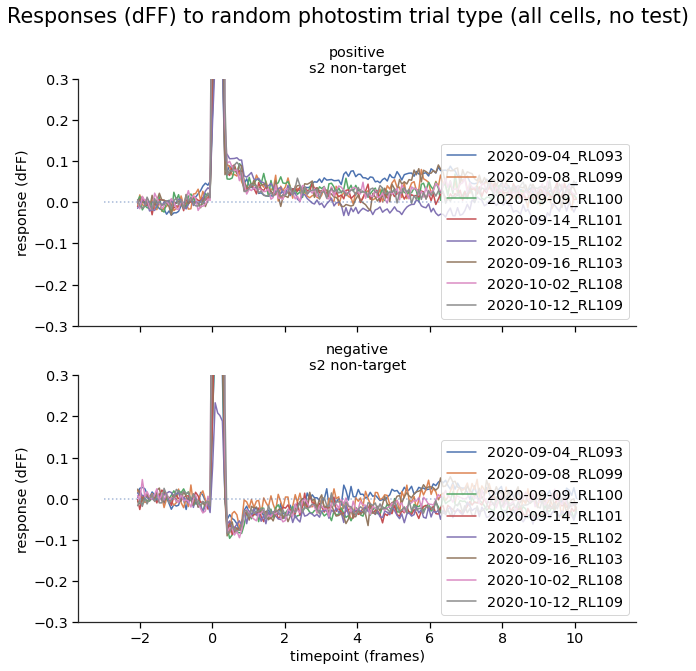

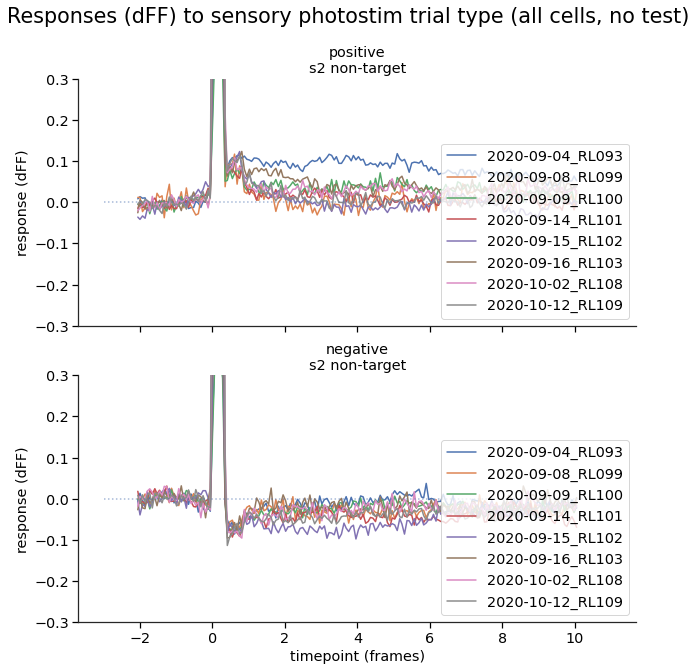

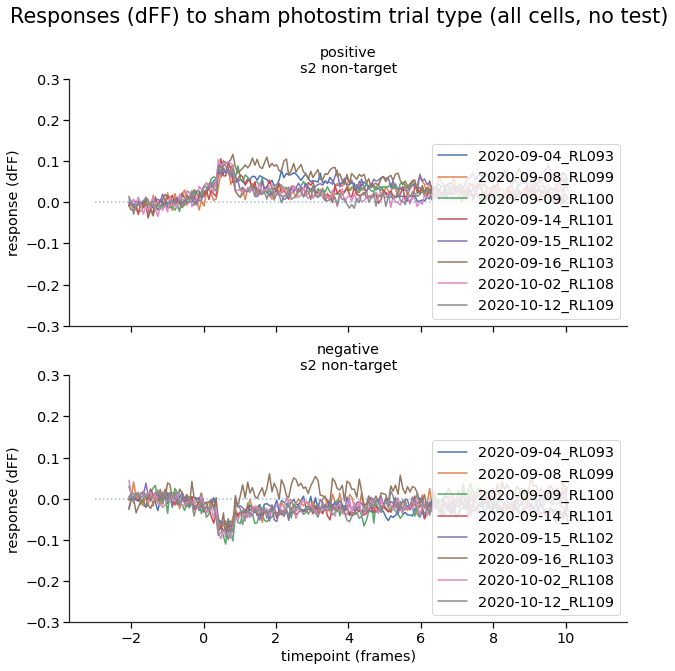

In [30]:
# TRACE AVERAGE PER ANIMAL OF ONLY S2 NON-TARGET, SPLIT POS/NEG

cell_df = pd.read_pickle(cell_df_path)
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)

# list of column names to be used to filter the dataframe
trial_type = ['random', 'sensory', 'sham']
target_type = ['pr_target', 'ps_target', 'pr_target']
resp_sign = ['pr_resp_sign', 'ps_resp_sign', 'spont_resp_sign']
responses = ['pr_sta_resp', 'ps_sta_resp', 'spont_sta_resp']
colors=['C0','C1','C2']

for trial, target, sign, response, color in zip(trial_type, target_type, resp_sign, 
                                                      responses, colors):

    fig, axes = plt.subplots(nrows=2, ncols=1, sharey=True, sharex=True, figsize=(10,10))
    
    # filter dataframes using variables above
    s2_nontargets_pos = cell_df[~cell_df[target] & cell_df['s2_cell'] & cell_df[sign]].index
    s2_nontargets_neg = cell_df[~cell_df[target] & cell_df['s2_cell'] & ~cell_df[sign]].index
    
    # populate the plots with filtered data
    for row, cell_id_lists in enumerate([[s2_nontargets_pos],
                                         [s2_nontargets_neg]                              
                                        ]):
        for col, cell_id_list in enumerate(cell_id_lists):
            
            df_filter = cell_mean_timepoint_df['cell_id'].isin(cell_id_list)
            filtered_df = cell_mean_timepoint_df[df_filter]
            groups = filtered_df.groupby('session_id')
            
            ax = axes[row]
            sns.lineplot(x='timepoint', y=response, estimator='mean', ci=None, data=filtered_df, 
                         hue='session_id', ax=ax)

    # define plot titles, axes etc.
    plt.suptitle('Responses (dFF) to ' + trial + ' photostim trial type (all cells, no test)', 
                 y=0.98, fontsize='xx-large');

    sign = ['positive', 'negative']
    photostim_id = 's2 non-target'

    for row_i, ax in enumerate(axes):
        if row_i == 1: 
            ax.set_xlabel('timepoint (frames)')
        ax.set_ylabel('response (dFF)')
        ax.set_title(sign[row_i] + '\n' + photostim_id)
        ax.hlines(0, -3, 11, linestyles='dotted', zorder=4, alpha=0.5);
        ax.set_ylim([-0.3, 0.3])
        ax.legend(loc='lower right')
#             col.set_xlim([-2, 10])
#             col.set_xlim([0, 182])

    save_path = os.path.join(qnap_path, session_type + '_DffTrace_'+trial+'_TrialMean_' + 
                             test_type + '_lineplot_row_ResponseType_col_TargetID')
#     ia.savePlot(save_path)

# Number of responding cells (swarmplot)

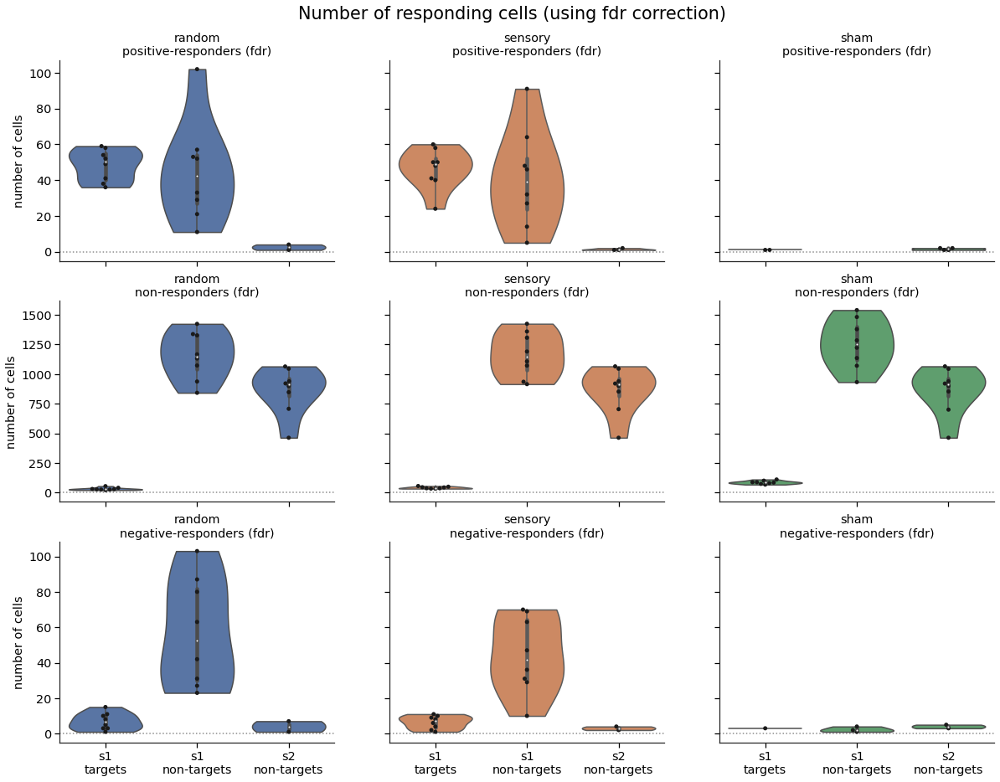

In [4]:
cell_df = pd.read_pickle(cell_df_path)
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)

# list of column names to be used to filter the dataframe
test_type = 'fdr'
if test_type == 'fdr':
    stat_test = ['sta_sig_pr', 'sta_sig_ps', 'sta_sig_spont']
if test_type == 'nomulti':
    stat_test = ['sta_sig_nomulti_pr', 'sta_sig_nomulti_ps', 'sta_sig_nomulti_spont']
target_type = ['pr_target', 'ps_target', 'pr_target']
sign_bool = ['pr_resp_sign', 'ps_resp_sign', 'spont_resp_sign']
trial_type = ['random', 'sensory', 'sham']

# create and populate the plots using filtered data
fig, axes = plt.subplots(nrows=3, ncols=3, sharey='row', sharex=True, figsize=(20,15))
    
for stim_id, trial in enumerate(trial_type):
    
    # define column names
    test = stat_test[stim_id]
    target = target_type[stim_id]
    sign = sign_bool[stim_id]

    # filter dataframes using variables above
    s1_targets_pos = cell_df[cell_df[test] & cell_df[target] & cell_df['s1_cell'] & 
                             cell_df[sign]].groupby('session_id').count()
    s1_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & 
                                cell_df[sign]].groupby('session_id').count()
    s2_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & 
                                cell_df[sign]].groupby('session_id').count()

    s1_targets_neg = cell_df[cell_df[test] & cell_df[target] & cell_df['s1_cell'] & 
                             ~cell_df[sign]].groupby('session_id').count()
    s1_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & 
                                ~cell_df[sign]].groupby('session_id').count()
    s2_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & 
                                ~cell_df[sign]].groupby('session_id').count()

    s1_targets_non = cell_df[~cell_df[test] & cell_df[target] & cell_df['s1_cell']].groupby('session_id').count()
    s1_nontargets_non = cell_df[~cell_df[test] & ~cell_df[target] & cell_df['s1_cell']].groupby('session_id').count()
    s2_nontargets_non = cell_df[~cell_df[test] & ~cell_df[target] & cell_df['s2_cell']].groupby('session_id').count()
    
    for row, df_count in enumerate([[s1_targets_pos, s1_nontargets_pos, s2_nontargets_pos],
                                    [s1_targets_non, s1_nontargets_non, s2_nontargets_non],
                                    [s1_targets_neg, s1_nontargets_neg, s2_nontargets_neg]                              
                                   ]):
        df = pd.DataFrame({'s1\ntargets'     : df_count[0]['cell_num'],
                           's1\nnon-targets' : df_count[1]['cell_num'],
                           's2\nnon-targets' : df_count[2]['cell_num']
                          })
        sns.swarmplot(data=df, ax=axes[row, stim_id], color='k', edgecolor='k')
        color = 'C' + str(stim_id)
        sns.violinplot(data=df, ax=axes[row, stim_id], color=color, cut=0, scale='width')

row_titles = ['positive-responders (' + test_type + ')', 
              'non-responders (' + test_type + ')',
              'negative-responders (' + test_type + ')'
             ]

for row_i, row in enumerate(axes):
    for col_i, col in enumerate(row):
        col.set_title(trial_type[col_i] + '\n' + row_titles[row_i])
        if col_i == 0: col.set_ylabel('number of cells')
        col.hlines(0, -0.5, 2.5, linestyles='dotted', zorder=4, alpha=0.5, color='k');

plt.suptitle('Number of responding cells (using ' + test_type + ' correction)', y=0.94, fontsize='xx-large');
    
# save the figure
save_path = os.path.join(qnap_path, session_type + '_NumRespondingCells_' + test_type + 
                         '_boxswarmplot_row_ResponseType_col_TrialType_splitby_TargetID')
# ia.savePlot(save_path)

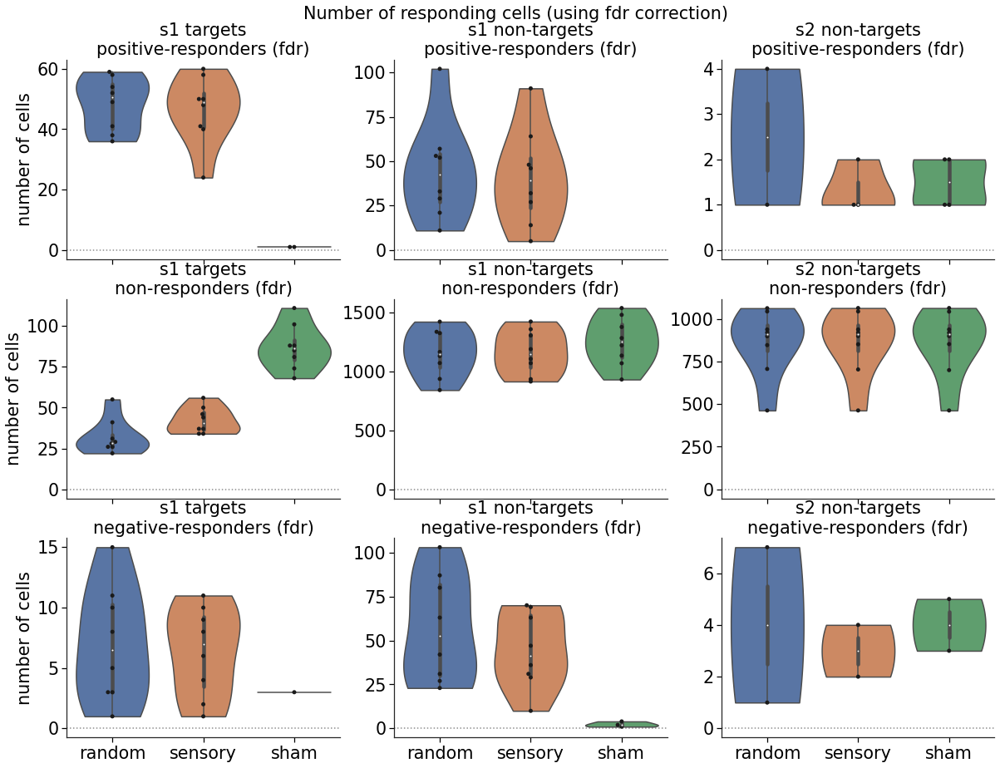

In [133]:
cell_df = pd.read_pickle(cell_df_path)
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)

# list of column names to be used to filter the dataframe
test_type = 'fdr'
if test_type == 'fdr':
    stat_test = ['sta_sig_pr', 'sta_sig_ps', 'sta_sig_spont']
if test_type == 'nomulti':
    stat_test = ['sta_sig_nomulti_pr', 'sta_sig_nomulti_ps', 'sta_sig_nomulti_spont']
target_type = ['pr_target', 'ps_target', 'pr_target']
sign_bool = ['pr_resp_sign', 'ps_resp_sign', 'spont_resp_sign']
trial_type = ['random', 'sensory', 'sham']

s1_targets_pos_df = pd.DataFrame()
s1_nontargets_pos_df = pd.DataFrame()
s2_nontargets_pos_df = pd.DataFrame()

s1_targets_non_df = pd.DataFrame()
s1_nontargets_non_df = pd.DataFrame()
s2_nontargets_non_df = pd.DataFrame()

s1_targets_neg_df = pd.DataFrame()
s1_nontargets_neg_df = pd.DataFrame()
s2_nontargets_neg_df = pd.DataFrame()

for stim_id, trial in enumerate(trial_type):
        
    # define column names
    test = stat_test[stim_id]
    target = target_type[stim_id]
    sign = sign_bool[stim_id]
    
    # filter dataframes using variables above
    s1_targets_pos = cell_df[cell_df[test] & cell_df[target] & cell_df['s1_cell'] & 
                             cell_df[sign]].groupby('session_id').count()
    s1_targets_pos_df = pd.concat([s1_targets_pos_df, pd.DataFrame({trial : s1_targets_pos['cell_num']})])
    
    s1_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & 
                                cell_df[sign]].groupby('session_id').count()
    s1_nontargets_pos_df = pd.concat([s1_nontargets_pos_df, pd.DataFrame({trial : s1_nontargets_pos['cell_num']})])
    
    s2_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & 
                                cell_df[sign]].groupby('session_id').count()
    s2_nontargets_pos_df = pd.concat([s2_nontargets_pos_df, pd.DataFrame({trial : s2_nontargets_pos['cell_num']})])

    s1_targets_non = cell_df[~cell_df[test] & cell_df[target] & cell_df['s1_cell']].groupby('session_id').count()
    s1_targets_non_df = pd.concat([s1_targets_non_df, pd.DataFrame({trial : s1_targets_non['cell_num']})])
    
    s1_nontargets_non = cell_df[~cell_df[test] & ~cell_df[target] & cell_df['s1_cell']].groupby('session_id').count()
    s1_nontargets_non_df = pd.concat([s1_nontargets_non_df, pd.DataFrame({trial : s1_nontargets_non['cell_num']})])
    
    s2_nontargets_non = cell_df[~cell_df[test] & ~cell_df[target] & cell_df['s2_cell']].groupby('session_id').count()
    s2_nontargets_non_df = pd.concat([s2_nontargets_non_df, pd.DataFrame({trial : s2_nontargets_non['cell_num']})])

    s1_targets_neg = cell_df[cell_df[test] & cell_df[target] & cell_df['s1_cell'] & 
                             ~cell_df[sign]].groupby('session_id').count()
    s1_targets_neg_df = pd.concat([s1_targets_neg_df, pd.DataFrame({trial : s1_targets_neg['cell_num']})])
    
    s1_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & 
                                ~cell_df[sign]].groupby('session_id').count()
    s1_nontargets_neg_df = pd.concat([s1_nontargets_neg_df, pd.DataFrame({trial : s1_nontargets_neg['cell_num']})])
    
    s2_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & 
                                ~cell_df[sign]].groupby('session_id').count()
    s2_nontargets_neg_df = pd.concat([s2_nontargets_neg_df, pd.DataFrame({trial : s2_nontargets_neg['cell_num']})])

# create and populate the plots using filtered data
fig, axes = plt.subplots(nrows=3, ncols=3, sharex=True, figsize=(20,15))

data_array = [[s1_targets_pos_df, s1_nontargets_pos_df, s2_nontargets_pos_df],
              [s1_targets_non_df, s1_nontargets_non_df, s2_nontargets_non_df],
              [s1_targets_neg_df, s1_nontargets_neg_df, s2_nontargets_neg_df]
             ]

row_titles = ['positive-responders (' + test_type + ')', 
              'non-responders (' + test_type + ')',
              'negative-responders (' + test_type + ')'
             ]
col_titles = ['s1 targets', 's1 non-targets', 's2 non-targets']

for row_i, row in enumerate(axes):
    for col_i, col in enumerate(row):
        ax=axes[row_i,col_i]
        sns.swarmplot(data=data_array[row_i][col_i], color='k', ax=ax, edgecolor='k')
        sns.violinplot(data=data_array[row_i][col_i], ax=ax, cut=0, scale='width')
        
        col.set_title(col_titles[col_i] + '\n' + row_titles[row_i])
        if col_i == 0: col.set_ylabel('number of cells')
        col.hlines(0, -0.5, 2.5, linestyles='dotted', zorder=4, alpha=0.5, color='k');

plt.suptitle('Number of responding cells (using ' + test_type + ' correction)', y=0.94, fontsize='xx-large');

# save the figure
save_path = os.path.join(qnap_path, session_type + '_NumRespondingCells_' + test_type + 
                         '_boxswarmplot_row_ResponseType_col_TargetID_splitby_TrialType')
# ia.savePlot(save_path)

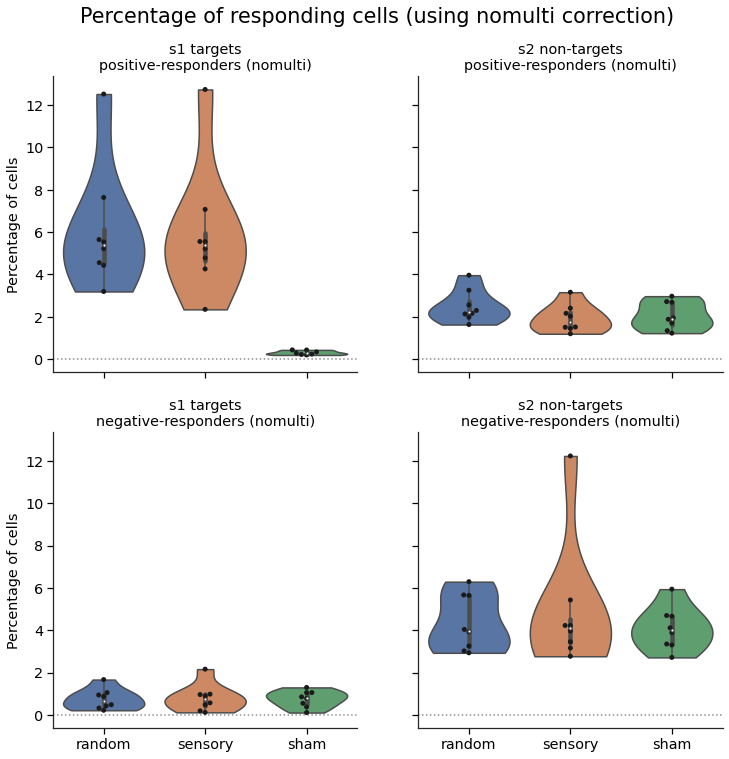

In [31]:
cell_df = pd.read_pickle(cell_df_path)
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)

# list of column names to be used to filter the dataframe
test_type = 'fdr'
if test_type == 'fdr':
    stat_test = ['sta_sig_pr', 'sta_sig_ps', 'sta_sig_spont']
if test_type == 'nomulti':
    stat_test = ['sta_sig_nomulti_pr', 'sta_sig_nomulti_ps', 'sta_sig_nomulti_spont']
target_type = ['pr_target', 'ps_target', 'pr_target']
sign_bool = ['pr_resp_sign', 'ps_resp_sign', 'spont_resp_sign']
trial_type = ['random', 'sensory', 'sham']

s1_targets_pos_df = pd.DataFrame()
s1_nontargets_pos_df = pd.DataFrame()
s2_nontargets_pos_df = pd.DataFrame()

s1_targets_non_df = pd.DataFrame()
s1_nontargets_non_df = pd.DataFrame()
s2_nontargets_non_df = pd.DataFrame()

s1_targets_neg_df = pd.DataFrame()
s1_nontargets_neg_df = pd.DataFrame()
s2_nontargets_neg_df = pd.DataFrame()

for stim_id, trial in enumerate(trial_type):
        
    # define column names
    test = stat_test[stim_id]
    target = target_type[stim_id]
    sign = sign_bool[stim_id]
    
    # filter dataframes using variables above
    s1_targets_pos = cell_df[cell_df[test] & cell_df[target] & cell_df['s1_cell'] & 
                             cell_df[sign]].groupby('session_id').count()/cell_df[cell_df['s2_cell']].groupby('session_id').count()*100
    s1_targets_pos_df = pd.concat([s1_targets_pos_df, pd.DataFrame({trial : s1_targets_pos['cell_num']})])
    
    s1_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & 
                                cell_df[sign]].groupby('session_id').count()/cell_df[cell_df['s2_cell']].groupby('session_id').count()*100
    s1_nontargets_pos_df = pd.concat([s1_nontargets_pos_df, pd.DataFrame({trial : s1_nontargets_pos['cell_num']})])
    
    s2_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & 
                                cell_df[sign]].groupby('session_id').count()/cell_df[cell_df['s2_cell']].groupby('session_id').count()*100
    s2_nontargets_pos_df = pd.concat([s2_nontargets_pos_df, pd.DataFrame({trial : s2_nontargets_pos['cell_num']})])

    s1_targets_non = cell_df[~cell_df[test] & cell_df[target] & cell_df['s1_cell']].groupby('session_id').count()/cell_df[cell_df['s2_cell']].groupby('session_id').count()*100
    s1_targets_non_df = pd.concat([s1_targets_non_df, pd.DataFrame({trial : s1_targets_non['cell_num']})])
    
    s1_nontargets_non = cell_df[~cell_df[test] & ~cell_df[target] & cell_df['s1_cell']].groupby('session_id').count()/cell_df[cell_df['s2_cell']].groupby('session_id').count()*100
    s1_nontargets_non_df = pd.concat([s1_nontargets_non_df, pd.DataFrame({trial : s1_nontargets_non['cell_num']})])
    
    s2_nontargets_non = cell_df[~cell_df[test] & ~cell_df[target] & cell_df['s2_cell']].groupby('session_id').count()/cell_df[cell_df['s2_cell']].groupby('session_id').count()*100
    s2_nontargets_non_df = pd.concat([s2_nontargets_non_df, pd.DataFrame({trial : s2_nontargets_non['cell_num']})])

    s1_targets_neg = cell_df[cell_df[test] & cell_df[target] & cell_df['s1_cell'] & 
                             ~cell_df[sign]].groupby('session_id').count()/cell_df[cell_df['s2_cell']].groupby('session_id').count()*100
    s1_targets_neg_df = pd.concat([s1_targets_neg_df, pd.DataFrame({trial : s1_targets_neg['cell_num']})])
    
    s1_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & 
                                ~cell_df[sign]].groupby('session_id').count()/cell_df[cell_df['s2_cell']].groupby('session_id').count()*100
    s1_nontargets_neg_df = pd.concat([s1_nontargets_neg_df, pd.DataFrame({trial : s1_nontargets_neg['cell_num']})])
    
    s2_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & 
                                ~cell_df[sign]].groupby('session_id').count()/cell_df[cell_df['s2_cell']].groupby('session_id').count()*100
    s2_nontargets_neg_df = pd.concat([s2_nontargets_neg_df, pd.DataFrame({trial : s2_nontargets_neg['cell_num']})])

# create and populate the plots using filtered data
fig, axes = plt.subplots(nrows=2, ncols=2, sharex=True, sharey=True, figsize=(12,12))

data_array = [[s1_targets_pos_df, s2_nontargets_pos_df],
#               [s1_targets_non_df, s1_nontargets_non_df, s2_nontargets_non_df],
              [s1_targets_neg_df, s2_nontargets_neg_df]
             ]

row_titles = ['positive-responders (' + test_type + ')', 
#               'non-responders (' + test_type + ')',
              'negative-responders (' + test_type + ')'
             ]
col_titles = ['s1 targets', 
#               's1 non-targets',
              's2 non-targets']

for row_i, row in enumerate(axes):
    for col_i, col in enumerate(row):
        ax=axes[row_i,col_i]
        sns.swarmplot(data=data_array[row_i][col_i], color='k', ax=ax, edgecolor='k')
        sns.violinplot(data=data_array[row_i][col_i], ax=ax, cut=0, scale='width')
        
        col.set_title(col_titles[col_i] + '\n' + row_titles[row_i])
        if col_i == 0: col.set_ylabel('Percentage of cells')
        col.hlines(0, -0.5, 2.5, linestyles='dotted', zorder=4, alpha=0.5, color='k');

plt.suptitle('Percentage of responding cells (using ' + test_type + ' correction)', y=0.96, fontsize='xx-large');

# save the figure
save_path = os.path.join(qnap_path, session_type + '_NumRespondingCells_' + test_type + 
                         '_boxswarmplot_row_ResponseType_col_TargetID_splitby_TrialType')
# ia.savePlot(save_path)

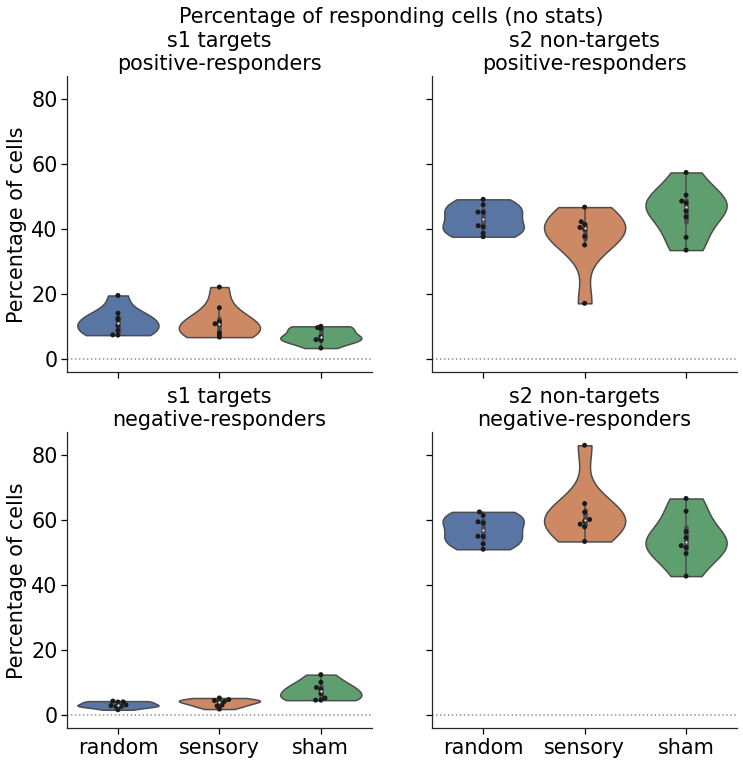

In [44]:
cell_df = pd.read_pickle(cell_df_path)
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)

# list of column names to be used to filter the dataframe
target_type = ['pr_target', 'ps_target', 'pr_target']
sign_bool = ['pr_resp_sign', 'ps_resp_sign', 'spont_resp_sign']
trial_type = ['random', 'sensory', 'sham']

s1_targets_pos_df = pd.DataFrame()
s1_nontargets_pos_df = pd.DataFrame()
s2_nontargets_pos_df = pd.DataFrame()

s1_targets_non_df = pd.DataFrame()
s1_nontargets_non_df = pd.DataFrame()
s2_nontargets_non_df = pd.DataFrame()

s1_targets_neg_df = pd.DataFrame()
s1_nontargets_neg_df = pd.DataFrame()
s2_nontargets_neg_df = pd.DataFrame()

for stim_id, trial in enumerate(trial_type):
        
    # define column names
    target = target_type[stim_id]
    sign = sign_bool[stim_id]
    
    # filter dataframes using variables above
    s1_targets_pos = cell_df[cell_df[target] & cell_df['s1_cell'] & 
                             cell_df[sign]].groupby('session_id').count()/cell_df[cell_df['s2_cell']].groupby('session_id').count()*100
    s1_targets_pos_df = pd.concat([s1_targets_pos_df, pd.DataFrame({trial : s1_targets_pos['cell_num']})])
    
    s1_nontargets_pos = cell_df[~cell_df[target] & cell_df['s1_cell'] & 
                                cell_df[sign]].groupby('session_id').count()/cell_df[cell_df['s2_cell']].groupby('session_id').count()*100
    s1_nontargets_pos_df = pd.concat([s1_nontargets_pos_df, pd.DataFrame({trial : s1_nontargets_pos['cell_num']})])
    
    s2_nontargets_pos = cell_df[~cell_df[target] & cell_df['s2_cell'] & 
                                cell_df[sign]].groupby('session_id').count()/cell_df[cell_df['s2_cell']].groupby('session_id').count()*100
    s2_nontargets_pos_df = pd.concat([s2_nontargets_pos_df, pd.DataFrame({trial : s2_nontargets_pos['cell_num']})])

    s1_targets_non = cell_df[cell_df[target] & cell_df['s1_cell']].groupby('session_id').count()/cell_df[cell_df['s2_cell']].groupby('session_id').count()*100
    s1_targets_non_df = pd.concat([s1_targets_non_df, pd.DataFrame({trial : s1_targets_non['cell_num']})])
    
    s1_nontargets_non = cell_df[~cell_df[target] & cell_df['s1_cell']].groupby('session_id').count()/cell_df[cell_df['s2_cell']].groupby('session_id').count()*100
    s1_nontargets_non_df = pd.concat([s1_nontargets_non_df, pd.DataFrame({trial : s1_nontargets_non['cell_num']})])
    
    s2_nontargets_non = cell_df[~cell_df[target] & cell_df['s2_cell']].groupby('session_id').count()/cell_df[cell_df['s2_cell']].groupby('session_id').count()*100
    s2_nontargets_non_df = pd.concat([s2_nontargets_non_df, pd.DataFrame({trial : s2_nontargets_non['cell_num']})])

    s1_targets_neg = cell_df[cell_df[target] & cell_df['s1_cell'] & 
                             ~cell_df[sign]].groupby('session_id').count()/cell_df[cell_df['s2_cell']].groupby('session_id').count()*100
    s1_targets_neg_df = pd.concat([s1_targets_neg_df, pd.DataFrame({trial : s1_targets_neg['cell_num']})])
    
    s1_nontargets_neg = cell_df[~cell_df[target] & cell_df['s1_cell'] & 
                                ~cell_df[sign]].groupby('session_id').count()/cell_df[cell_df['s2_cell']].groupby('session_id').count()*100
    s1_nontargets_neg_df = pd.concat([s1_nontargets_neg_df, pd.DataFrame({trial : s1_nontargets_neg['cell_num']})])
    
    s2_nontargets_neg = cell_df[~cell_df[target] & cell_df['s2_cell'] & 
                                ~cell_df[sign]].groupby('session_id').count()/cell_df[cell_df['s2_cell']].groupby('session_id').count()*100
    s2_nontargets_neg_df = pd.concat([s2_nontargets_neg_df, pd.DataFrame({trial : s2_nontargets_neg['cell_num']})])

# create and populate the plots using filtered data
fig, axes = plt.subplots(nrows=2, ncols=2, sharex=True, sharey=True, figsize=(12,12))

data_array = [[s1_targets_pos_df, s2_nontargets_pos_df],
#               [s1_targets_non_df, s1_nontargets_non_df, s2_nontargets_non_df],
              [s1_targets_neg_df, s2_nontargets_neg_df]
             ]

row_titles = ['positive-responders', 
#               'non-responders (' + test_type + ')',
              'negative-responders'
             ]
col_titles = ['s1 targets', 
#               's1 non-targets',
              's2 non-targets']

for row_i, row in enumerate(axes):
    for col_i, col in enumerate(row):
        ax=axes[row_i,col_i]
        sns.swarmplot(data=data_array[row_i][col_i], color='k', ax=ax, edgecolor='k')
        sns.violinplot(data=data_array[row_i][col_i], ax=ax, cut=0, scale='width')
        
        col.set_title(col_titles[col_i] + '\n' + row_titles[row_i])
        if col_i == 0: col.set_ylabel('Percentage of cells')
        col.hlines(0, -0.5, 2.5, linestyles='dotted', zorder=4, alpha=0.5, color='k');

plt.suptitle('Percentage of responding cells (no stats)', y=0.96, fontsize='xx-large');

# save the figure
save_path = os.path.join(qnap_path, session_type + '_NumRespondingCells_boxswarmplot_row_ResponseType_col_TargetID_splitby_TrialType')
# ia.savePlot(save_path)

# Total activity in responding cells (swarmplot)

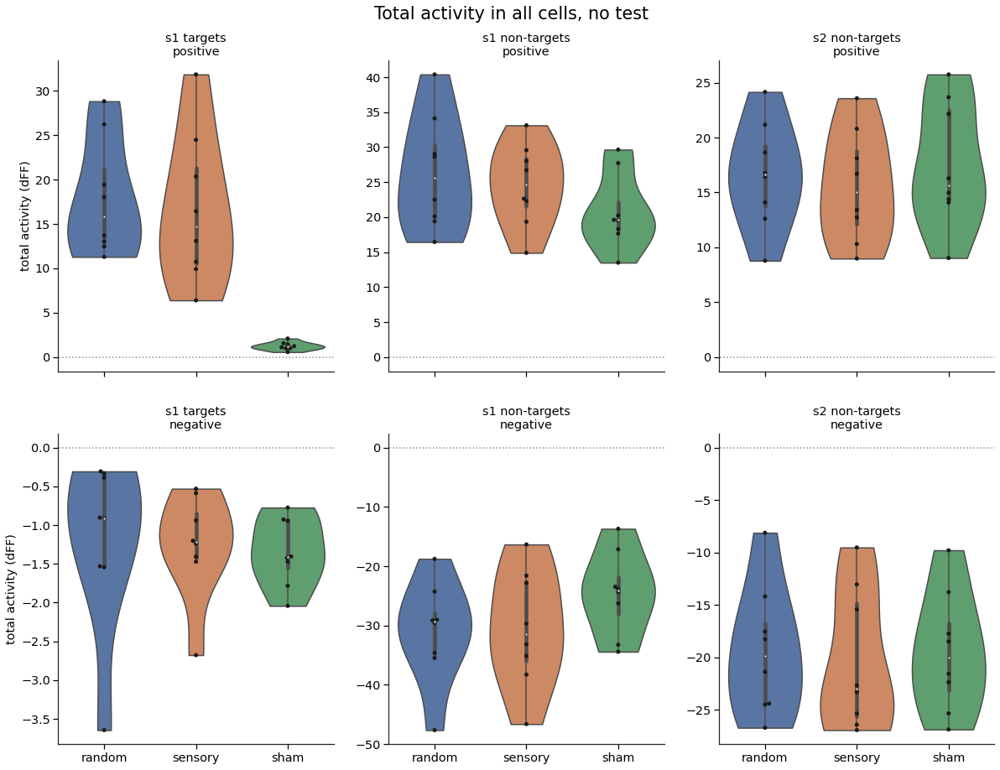

In [13]:
cell_df = pd.read_pickle(cell_df_path)
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)

# list of column names to be used to filter the dataframe
target_type = ['pr_target', 'ps_target', 'pr_target']
sign_bool = ['pr_resp_sign', 'ps_resp_sign', 'spont_resp_sign']
responses = ['pr_sta_amp_resp', 'ps_sta_amp_resp', 'spont_sta_amp_resp']
trial_type = ['random', 'sensory', 'sham']

s1_targets_pos_df = pd.DataFrame()
s1_nontargets_pos_df = pd.DataFrame()
s2_nontargets_pos_df = pd.DataFrame()

s1_targets_non_df = pd.DataFrame()
s1_nontargets_non_df = pd.DataFrame()
s2_nontargets_non_df = pd.DataFrame()

s1_targets_neg_df = pd.DataFrame()
s1_nontargets_neg_df = pd.DataFrame()
s2_nontargets_neg_df = pd.DataFrame()
    
for stim_id, trial in enumerate(trial_type):
    
    # define column names
    response = responses[stim_id]
    target = target_type[stim_id]
    sign = sign_bool[stim_id]

    # filter dataframes using variables above
    s1_targets_pos = cell_df[cell_df[target] & cell_df['s1_cell'] & cell_df[sign]].groupby('session_id').sum()
    s1_targets_pos_df = pd.concat([s1_targets_pos_df, pd.DataFrame({trial : s1_targets_pos[response]})])
    
    s1_nontargets_pos = cell_df[~cell_df[target] & cell_df['s1_cell'] & cell_df[sign]].groupby('session_id').sum()
    s1_nontargets_pos_df = pd.concat([s1_nontargets_pos_df, pd.DataFrame({trial : s1_nontargets_pos[response]})])
    
    s2_nontargets_pos = cell_df[~cell_df[target] & cell_df['s2_cell'] & cell_df[sign]].groupby('session_id').sum()
    s2_nontargets_pos_df = pd.concat([s2_nontargets_pos_df, pd.DataFrame({trial : s2_nontargets_pos[response]})])

    s1_targets_neg = cell_df[cell_df[target] & cell_df['s1_cell'] & ~cell_df[sign]].groupby('session_id').sum()
    s1_targets_neg_df = pd.concat([s1_targets_neg_df, pd.DataFrame({trial : s1_targets_neg[response]})])
    
    s1_nontargets_neg = cell_df[~cell_df[target] & cell_df['s1_cell'] & ~cell_df[sign]].groupby('session_id').sum()
    s1_nontargets_neg_df = pd.concat([s1_nontargets_neg_df, pd.DataFrame({trial : s1_nontargets_neg[response]})])
    
    s2_nontargets_neg = cell_df[~cell_df[target] & cell_df['s2_cell'] & ~cell_df[sign]].groupby('session_id').sum()
    s2_nontargets_neg_df = pd.concat([s2_nontargets_neg_df, pd.DataFrame({trial : s2_nontargets_neg[response]})])
    
# create and populate the plots using filtered data
fig, axes = plt.subplots(nrows=2, ncols=3, sharex=True, figsize=(20,15))

data_array = [[s1_targets_pos_df, s1_nontargets_pos_df, s2_nontargets_pos_df],
              [s1_targets_neg_df, s1_nontargets_neg_df, s2_nontargets_neg_df]
             ]

row_titles = ['positive', 
              'negative'
             ]
col_titles = ['s1 targets', 's1 non-targets', 's2 non-targets']

for row_i, row in enumerate(axes):
    for col_i, col in enumerate(row):
        ax=axes[row_i,col_i]
        sns.swarmplot(data=data_array[row_i][col_i], color='k', ax=ax, edgecolor='k')
        sns.violinplot(data=data_array[row_i][col_i], ax=ax, cut=0, scale='width')
        
        col.set_title(col_titles[col_i] + '\n' + row_titles[row_i])
        if col_i == 0: col.set_ylabel('total activity (dFF)')
        col.hlines(0, -3, 11, linestyles='dotted', zorder=4, alpha=0.5, color='k');

plt.suptitle('Total activity in all cells, no test', y=0.94, fontsize='xx-large');
    
# save the figure
save_path = os.path.join(qnap_path, session_type + 
                         '_TotalActivity_boxswarmplot_row_ResponseType_col_TargetID_splitby_TrialType')
# ia.savePlot(save_path)

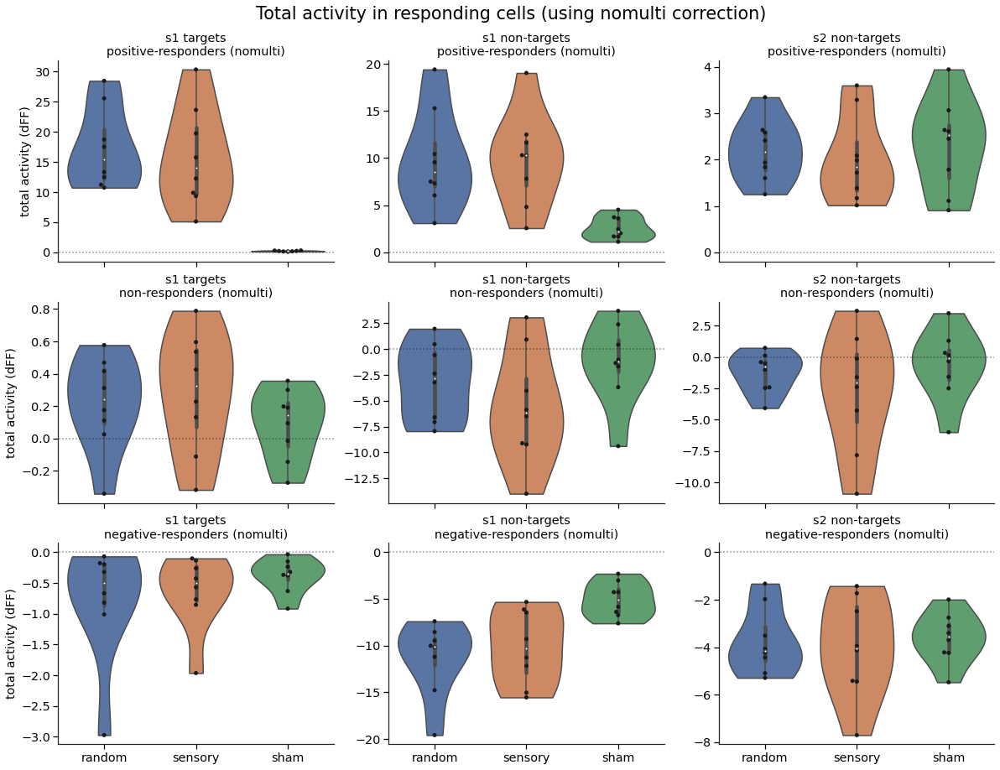

In [37]:
cell_df = pd.read_pickle(cell_df_path)
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)

# list of column names to be used to filter the dataframe
test_type = 'nomulti'
if test_type == 'fdr':
    stat_test = ['sta_sig_pr', 'sta_sig_ps', 'sta_sig_spont']
if test_type == 'nomulti':
    stat_test = ['sta_sig_nomulti_pr', 'sta_sig_nomulti_ps', 'sta_sig_nomulti_spont']
target_type = ['pr_target', 'ps_target', 'pr_target']
sign_bool = ['pr_resp_sign', 'ps_resp_sign', 'spont_resp_sign']
responses = ['pr_sta_amp_resp', 'ps_sta_amp_resp', 'spont_sta_amp_resp']
trial_type = ['random', 'sensory', 'sham']

s1_targets_pos_df = pd.DataFrame()
s1_nontargets_pos_df = pd.DataFrame()
s2_nontargets_pos_df = pd.DataFrame()

s1_targets_non_df = pd.DataFrame()
s1_nontargets_non_df = pd.DataFrame()
s2_nontargets_non_df = pd.DataFrame()

s1_targets_neg_df = pd.DataFrame()
s1_nontargets_neg_df = pd.DataFrame()
s2_nontargets_neg_df = pd.DataFrame()
    
for stim_id, trial in enumerate(trial_type):
    
    # define column names
    response = responses[stim_id]
    test = stat_test[stim_id]
    target = target_type[stim_id]
    sign = sign_bool[stim_id]

    # filter dataframes using variables above
    s1_targets_pos = cell_df[cell_df[test] & cell_df[target] & cell_df['s1_cell'] & 
                             cell_df[sign]].groupby('session_id').sum()
    s1_targets_pos_df = pd.concat([s1_targets_pos_df, pd.DataFrame({trial : s1_targets_pos[response]})])
    
    s1_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & 
                                cell_df[sign]].groupby('session_id').sum()
    s1_nontargets_pos_df = pd.concat([s1_nontargets_pos_df, pd.DataFrame({trial : s1_nontargets_pos[response]})])
    
    s2_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & 
                                cell_df[sign]].groupby('session_id').sum()
    s2_nontargets_pos_df = pd.concat([s2_nontargets_pos_df, pd.DataFrame({trial : s2_nontargets_pos[response]})])

    s1_targets_non = cell_df[~cell_df[test] & cell_df[target] & cell_df['s1_cell']].groupby('session_id').sum()
    s1_targets_non_df = pd.concat([s1_targets_non_df, pd.DataFrame({trial : s1_targets_non[response]})])
    
    s1_nontargets_non = cell_df[~cell_df[test] & ~cell_df[target] & cell_df['s1_cell']].groupby('session_id').sum()
    s1_nontargets_non_df = pd.concat([s1_nontargets_non_df, pd.DataFrame({trial : s1_nontargets_non[response]})])
    
    s2_nontargets_non = cell_df[~cell_df[test] & ~cell_df[target] & cell_df['s2_cell']].groupby('session_id').sum()
    s2_nontargets_non_df = pd.concat([s2_nontargets_non_df, pd.DataFrame({trial : s2_nontargets_non[response]})])

    s1_targets_neg = cell_df[cell_df[test] & cell_df[target] & cell_df['s1_cell'] & 
                             ~cell_df[sign]].groupby('session_id').sum()
    s1_targets_neg_df = pd.concat([s1_targets_neg_df, pd.DataFrame({trial : s1_targets_neg[response]})])
    
    s1_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & 
                                ~cell_df[sign]].groupby('session_id').sum()
    s1_nontargets_neg_df = pd.concat([s1_nontargets_neg_df, pd.DataFrame({trial : s1_nontargets_neg[response]})])
    
    s2_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & 
                                ~cell_df[sign]].groupby('session_id').sum()
    s2_nontargets_neg_df = pd.concat([s2_nontargets_neg_df, pd.DataFrame({trial : s2_nontargets_neg[response]})])
    
# create and populate the plots using filtered data
fig, axes = plt.subplots(nrows=3, ncols=3, sharex=True, figsize=(20,15))

data_array = [[s1_targets_pos_df, s1_nontargets_pos_df, s2_nontargets_pos_df],
              [s1_targets_non_df, s1_nontargets_non_df, s2_nontargets_non_df],
              [s1_targets_neg_df, s1_nontargets_neg_df, s2_nontargets_neg_df]
             ]

row_titles = ['positive-responders (' + test_type + ')', 
              'non-responders (' + test_type + ')',
              'negative-responders (' + test_type + ')'
             ]
col_titles = ['s1 targets', 's1 non-targets', 's2 non-targets']

for row_i, row in enumerate(axes):
    for col_i, col in enumerate(row):
        ax=axes[row_i,col_i]
        sns.swarmplot(data=data_array[row_i][col_i], color='k', ax=ax, edgecolor='k')
        sns.violinplot(data=data_array[row_i][col_i], ax=ax, cut=0, scale='width')
        
        col.set_title(col_titles[col_i] + '\n' + row_titles[row_i])
        if col_i == 0: col.set_ylabel('total activity (dFF)')
        col.hlines(0, -3, 11, linestyles='dotted', zorder=4, alpha=0.5, color='k');

plt.suptitle('Total activity in responding cells (using ' + test_type + ' correction)', y=0.94, fontsize='xx-large');
    
# save the figure
save_path = os.path.join(qnap_path, session_type + '_TotalActivity_' + test_type + 
                         '_boxswarmplot_row_ResponseType_col_TargetID_splitby_TrialType')
# ia.savePlot(save_path)

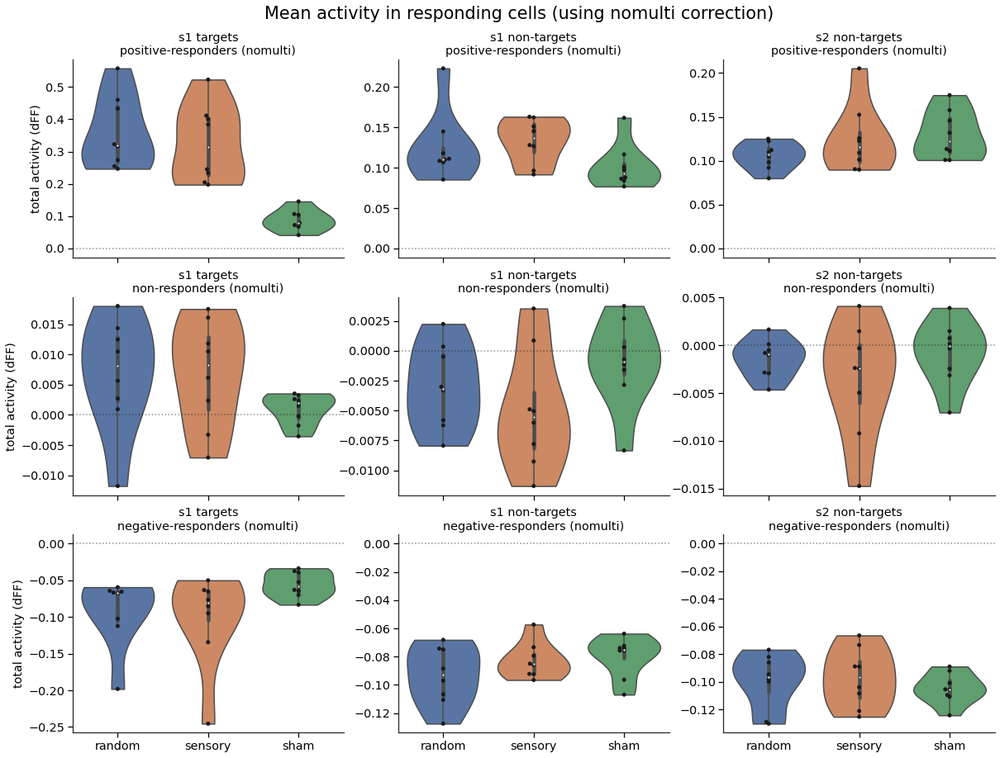

In [38]:
cell_df = pd.read_pickle(cell_df_path)
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)

# list of column names to be used to filter the dataframe
test_type = 'nomulti'
if test_type == 'fdr':
    stat_test = ['sta_sig_pr', 'sta_sig_ps', 'sta_sig_spont']
if test_type == 'nomulti':
    stat_test = ['sta_sig_nomulti_pr', 'sta_sig_nomulti_ps', 'sta_sig_nomulti_spont']
target_type = ['pr_target', 'ps_target', 'pr_target']
sign_bool = ['pr_resp_sign', 'ps_resp_sign', 'spont_resp_sign']
responses = ['pr_sta_amp_resp', 'ps_sta_amp_resp', 'spont_sta_amp_resp']
trial_type = ['random', 'sensory', 'sham']

s1_targets_pos_df = pd.DataFrame()
s1_nontargets_pos_df = pd.DataFrame()
s2_nontargets_pos_df = pd.DataFrame()

s1_targets_non_df = pd.DataFrame()
s1_nontargets_non_df = pd.DataFrame()
s2_nontargets_non_df = pd.DataFrame()

s1_targets_neg_df = pd.DataFrame()
s1_nontargets_neg_df = pd.DataFrame()
s2_nontargets_neg_df = pd.DataFrame()
    
for stim_id, trial in enumerate(trial_type):
    
    # define column names
    response = responses[stim_id]
    test = stat_test[stim_id]
    target = target_type[stim_id]
    sign = sign_bool[stim_id]

    # filter dataframes using variables above
    s1_targets_pos = cell_df[cell_df[test] & cell_df[target] & cell_df['s1_cell'] & 
                             cell_df[sign]].groupby('session_id').mean()
    s1_targets_pos_df = pd.concat([s1_targets_pos_df, pd.DataFrame({trial : s1_targets_pos[response]})])
    
    s1_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & 
                                cell_df[sign]].groupby('session_id').mean()
    s1_nontargets_pos_df = pd.concat([s1_nontargets_pos_df, pd.DataFrame({trial : s1_nontargets_pos[response]})])
    
    s2_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & 
                                cell_df[sign]].groupby('session_id').mean()
    s2_nontargets_pos_df = pd.concat([s2_nontargets_pos_df, pd.DataFrame({trial : s2_nontargets_pos[response]})])

    s1_targets_non = cell_df[~cell_df[test] & cell_df[target] & cell_df['s1_cell']].groupby('session_id').mean()
    s1_targets_non_df = pd.concat([s1_targets_non_df, pd.DataFrame({trial : s1_targets_non[response]})])
    
    s1_nontargets_non = cell_df[~cell_df[test] & ~cell_df[target] & cell_df['s1_cell']].groupby('session_id').mean()
    s1_nontargets_non_df = pd.concat([s1_nontargets_non_df, pd.DataFrame({trial : s1_nontargets_non[response]})])
    
    s2_nontargets_non = cell_df[~cell_df[test] & ~cell_df[target] & cell_df['s2_cell']].groupby('session_id').mean()
    s2_nontargets_non_df = pd.concat([s2_nontargets_non_df, pd.DataFrame({trial : s2_nontargets_non[response]})])

    s1_targets_neg = cell_df[cell_df[test] & cell_df[target] & cell_df['s1_cell'] & 
                             ~cell_df[sign]].groupby('session_id').mean()
    s1_targets_neg_df = pd.concat([s1_targets_neg_df, pd.DataFrame({trial : s1_targets_neg[response]})])
    
    s1_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & 
                                ~cell_df[sign]].groupby('session_id').mean()
    s1_nontargets_neg_df = pd.concat([s1_nontargets_neg_df, pd.DataFrame({trial : s1_nontargets_neg[response]})])
    
    s2_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & 
                                ~cell_df[sign]].groupby('session_id').mean()
    s2_nontargets_neg_df = pd.concat([s2_nontargets_neg_df, pd.DataFrame({trial : s2_nontargets_neg[response]})])
    
# create and populate the plots using filtered data
fig, axes = plt.subplots(nrows=3, ncols=3, sharex=True, figsize=(20,15))

data_array = [[s1_targets_pos_df, s1_nontargets_pos_df, s2_nontargets_pos_df],
              [s1_targets_non_df, s1_nontargets_non_df, s2_nontargets_non_df],
              [s1_targets_neg_df, s1_nontargets_neg_df, s2_nontargets_neg_df]
             ]

row_titles = ['positive-responders (' + test_type + ')', 
              'non-responders (' + test_type + ')',
              'negative-responders (' + test_type + ')'
             ]
col_titles = ['s1 targets', 's1 non-targets', 's2 non-targets']

for row_i, row in enumerate(axes):
    for col_i, col in enumerate(row):
        ax=axes[row_i,col_i]
        sns.swarmplot(data=data_array[row_i][col_i], color='k', ax=ax, edgecolor='k')
        sns.violinplot(data=data_array[row_i][col_i], ax=ax, cut=0, scale='width')
        
        col.set_title(col_titles[col_i] + '\n' + row_titles[row_i])
        if col_i == 0: col.set_ylabel('total activity (dFF)')
        col.hlines(0, -3, 11, linestyles='dotted', zorder=4, alpha=0.5, color='k');

plt.suptitle('Mean activity in responding cells (using ' + test_type + ' correction)', y=0.94, fontsize='xx-large');
    
# save the figure
save_path = os.path.join(qnap_path, session_type + '_MeanActivity_' + test_type + 
                         '_boxswarmplot_row_ResponseType_col_TargetID_splitby_TrialType')
# ia.savePlot(save_path)

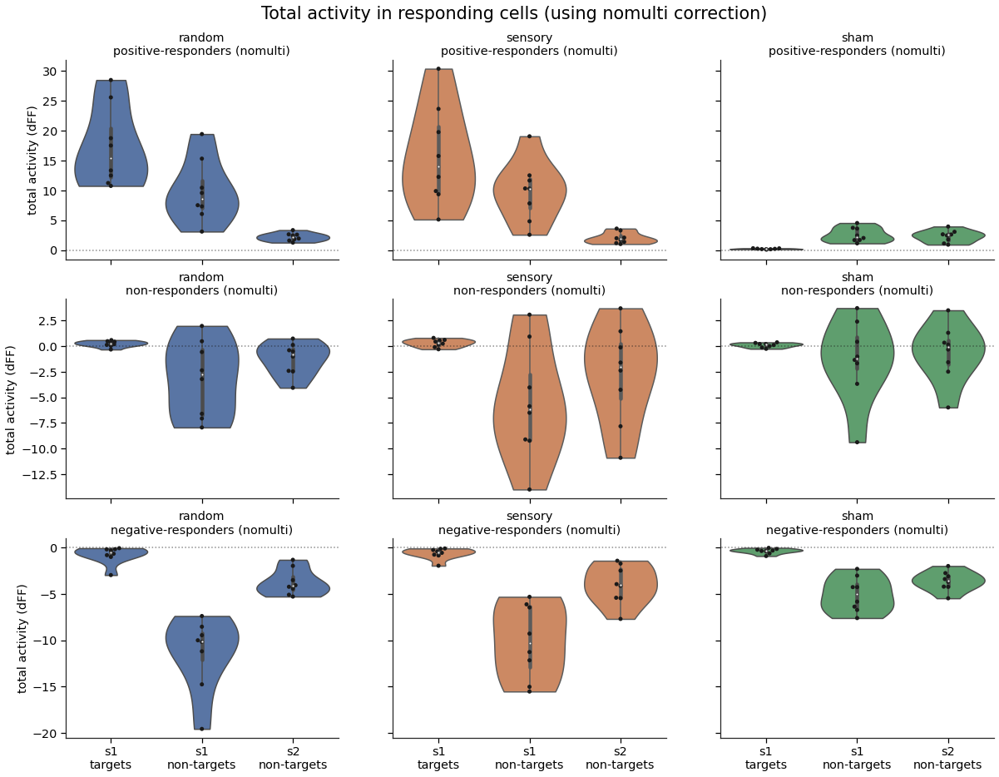

In [39]:
cell_df = pd.read_pickle(cell_df_path)
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)

# list of column names to be used to filter the dataframe
test_type = 'nomulti'
if test_type == 'fdr':
    stat_test = ['sta_sig_pr', 'sta_sig_ps', 'sta_sig_spont']
if test_type == 'nomulti':
    stat_test = ['sta_sig_nomulti_pr', 'sta_sig_nomulti_ps', 'sta_sig_nomulti_spont']
target_type = ['pr_target', 'ps_target', 'pr_target']
sign_bool = ['pr_resp_sign', 'ps_resp_sign', 'spont_resp_sign']
responses = ['pr_sta_amp_resp', 'ps_sta_amp_resp', 'spont_sta_amp_resp']
trial_type = ['random', 'sensory', 'sham']

# create and populate the plots using filtered data
fig, axes = plt.subplots(nrows=3, ncols=3, sharey='row', sharex=True, figsize=(20,15))
    
for stim_id, trial in enumerate(trial_type):
    
    # define column names
    response = responses[stim_id]
    test = stat_test[stim_id]
    target = target_type[stim_id]
    sign = sign_bool[stim_id]

    # filter dataframes using variables above
    s1_targets_pos = cell_df[cell_df[test] & cell_df[target] & cell_df['s1_cell'] & 
                             cell_df[sign]].groupby('session_id').sum()
    s1_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & 
                                cell_df[sign]].groupby('session_id').sum()
    s2_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & 
                                cell_df[sign]].groupby('session_id').sum()

    s1_targets_neg = cell_df[cell_df[test] & cell_df[target] & cell_df['s1_cell'] & 
                             ~cell_df[sign]].groupby('session_id').sum()
    s1_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & 
                                ~cell_df[sign]].groupby('session_id').sum()
    s2_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & 
                                ~cell_df[sign]].groupby('session_id').sum()

    s1_targets_non = cell_df[~cell_df[test] & cell_df[target] & cell_df['s1_cell']].groupby('session_id').sum()
    s1_nontargets_non = cell_df[~cell_df[test] & ~cell_df[target] & cell_df['s1_cell']].groupby('session_id').sum()
    s2_nontargets_non = cell_df[~cell_df[test] & ~cell_df[target] & cell_df['s2_cell']].groupby('session_id').sum()
    
    for row, summed_df in enumerate([[s1_targets_pos, s1_nontargets_pos, s2_nontargets_pos],
                                    [s1_targets_non, s1_nontargets_non, s2_nontargets_non],
                                    [s1_targets_neg, s1_nontargets_neg, s2_nontargets_neg]                              
                                   ]):
        df = pd.DataFrame({'s1\ntargets'     : summed_df[0][response],
                           's1\nnon-targets' : summed_df[1][response],
                           's2\nnon-targets' : summed_df[2][response]
                          })
        sns.swarmplot(data=df, ax=axes[row, stim_id], color='k', edgecolor='k')
        color = 'C' + str(stim_id)
        sns.violinplot(data=df, ax=axes[row, stim_id], color=color, cut=0, scale='width')

row_titles = ['positive-responders (' + test_type + ')', 
              'non-responders (' + test_type + ')',
              'negative-responders (' + test_type + ')'
             ]

for row_i, row in enumerate(axes):
    for col_i, col in enumerate(row):
        col.set_title(trial_type[col_i] + '\n' + row_titles[row_i])
        if col_i == 0: col.set_ylabel('total activity (dFF)')
        col.hlines(0, -3, 11, linestyles='dotted', zorder=4, alpha=0.5, color='k');

plt.suptitle('Total activity in responding cells (using ' + test_type + ' correction)', y=0.94, fontsize='xx-large');
    
# save the figure
save_path = os.path.join(qnap_path, session_type + '_TotalActivity_' + test_type + 
                         '_boxswarmplot_row_ResponseType_col_TrialType_splitby_TargetID')
# ia.savePlot(save_path)

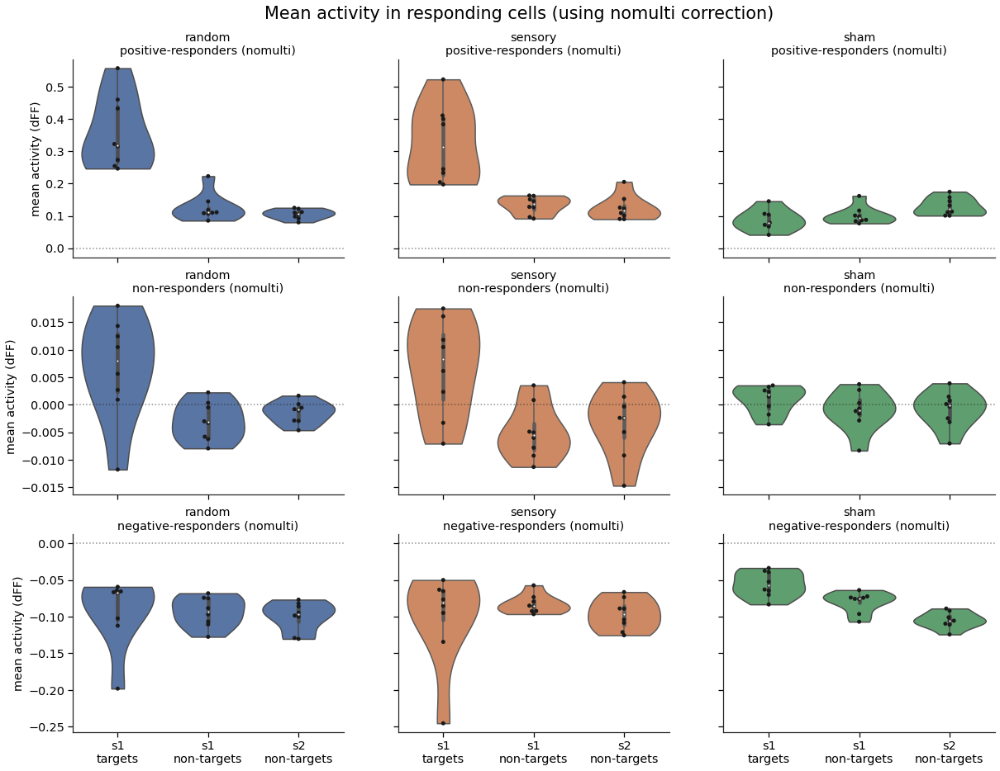

In [40]:
cell_df = pd.read_pickle(cell_df_path)
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)

# list of column names to be used to filter the dataframe
test_type = 'nomulti'
if test_type == 'fdr':
    stat_test = ['sta_sig_pr', 'sta_sig_ps', 'sta_sig_spont']
if test_type == 'nomulti':
    stat_test = ['sta_sig_nomulti_pr', 'sta_sig_nomulti_ps', 'sta_sig_nomulti_spont']
target_type = ['pr_target', 'ps_target', 'pr_target']
sign_bool = ['pr_resp_sign', 'ps_resp_sign', 'spont_resp_sign']
responses = ['pr_sta_amp_resp', 'ps_sta_amp_resp', 'spont_sta_amp_resp']
trial_type = ['random', 'sensory', 'sham']

# create and populate the plots using filtered data
fig, axes = plt.subplots(nrows=3, ncols=3, sharey='row', sharex=True, figsize=(20,15))
    
for stim_id, trial in enumerate(trial_type):
    
    # define column names
    response = responses[stim_id]
    test = stat_test[stim_id]
    target = target_type[stim_id]
    sign = sign_bool[stim_id]

    # filter dataframes using variables above
    s1_targets_pos = cell_df[cell_df[test] & cell_df[target] & cell_df['s1_cell'] & 
                             cell_df[sign]].groupby('session_id').mean()
    s1_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & 
                                cell_df[sign]].groupby('session_id').mean()
    s2_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & 
                                cell_df[sign]].groupby('session_id').mean()

    s1_targets_neg = cell_df[cell_df[test] & cell_df[target] & cell_df['s1_cell'] & 
                             ~cell_df[sign]].groupby('session_id').mean()
    s1_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & 
                                ~cell_df[sign]].groupby('session_id').mean()
    s2_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & 
                                ~cell_df[sign]].groupby('session_id').mean()

    s1_targets_non = cell_df[~cell_df[test] & cell_df[target] & cell_df['s1_cell']].groupby('session_id').mean()
    s1_nontargets_non = cell_df[~cell_df[test] & ~cell_df[target] & cell_df['s1_cell']].groupby('session_id').mean()
    s2_nontargets_non = cell_df[~cell_df[test] & ~cell_df[target] & cell_df['s2_cell']].groupby('session_id').mean()
    
    for row, summed_df in enumerate([[s1_targets_pos, s1_nontargets_pos, s2_nontargets_pos],
                                    [s1_targets_non, s1_nontargets_non, s2_nontargets_non],
                                    [s1_targets_neg, s1_nontargets_neg, s2_nontargets_neg]                              
                                   ]):
        df = pd.DataFrame({'s1\ntargets'     : summed_df[0][response],
                           's1\nnon-targets' : summed_df[1][response],
                           's2\nnon-targets' : summed_df[2][response]
                          })
        sns.swarmplot(data=df, ax=axes[row, stim_id], color='k', edgecolor='k')
        color = 'C' + str(stim_id)
        sns.violinplot(data=df, ax=axes[row, stim_id], color=color, cut=0, scale='width')

row_titles = ['positive-responders (' + test_type + ')', 
              'non-responders (' + test_type + ')',
              'negative-responders (' + test_type + ')'
             ]

for row_i, row in enumerate(axes):
    for col_i, col in enumerate(row):
        col.set_title(trial_type[col_i] + '\n' + row_titles[row_i])
        if col_i == 0: col.set_ylabel('mean activity (dFF)')
        col.hlines(0, -3, 11, linestyles='dotted', zorder=4, alpha=0.5, color='k');

plt.suptitle('Mean activity in responding cells (using ' + test_type + ' correction)', y=0.94, fontsize='xx-large');
    
# save the figure
save_path = os.path.join(qnap_path, session_type + '_MeanActivity_' + test_type + 
                         '_boxswarmplot_row_ResponseType_col_TrialType_splitby_TargetID')
# ia.savePlot(save_path)

# Percentage of targets/non-targets responding on each trial

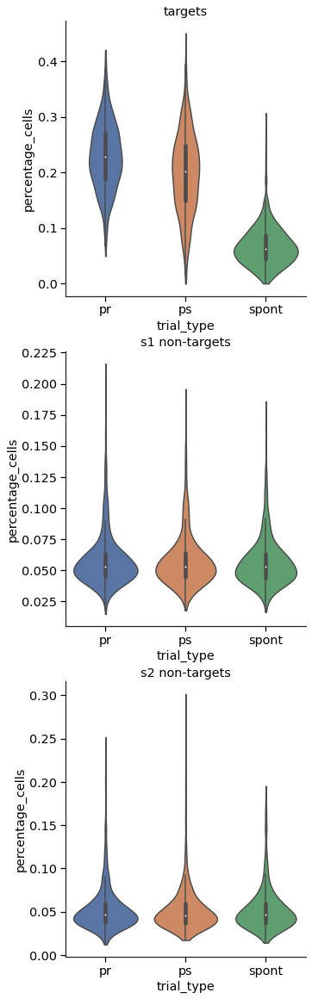

In [41]:
# for each trial type I need to append results to a dataframe for targets, s1 non-targets and s2 non-targets
# because different rows are going to be different dataframes
# also need to filter positive responses for first plot, but negative for later (make this easy)

cell_df = pd.read_pickle(cell_df_path)
cell_trial_df = pd.read_pickle(cell_trial_df_path)

target_types = ['pr', 'ps', 'pr']
trial_types = ['pr', 'ps', 'spont']

target_df = pd.DataFrame()
s1_nontarget_df = pd.DataFrame()
s2_nontarget_df = pd.DataFrame()

dfs = [target_df, s1_nontarget_df, s2_nontarget_df]

for target, trial in zip(target_types, trial_types):
    
    target_cell_ids = cell_df.query(target + '_target & s1_cell').index
    s1_nontarget_cell_ids = cell_df.query('~' + target + '_target & s1_cell').index
    s2_nontarget_cell_ids = cell_df.query('~' + target + '_target & s2_cell').index
    
    cell_id_list = [target_cell_ids, s1_nontarget_cell_ids, s2_nontarget_cell_ids]
    
    n_targets = cell_df.query(target + '_target & s1_cell').groupby('session_id').count()['cell_num']
    n_s1_nontargets = cell_df.query('~' + target + '_target & s1_cell').groupby('session_id').count()['cell_num']
    n_s2_nontargets = cell_df.query('~' + target + '_target & s2_cell').groupby('session_id').count()['cell_num']
    
    n_cells_list = [n_targets, n_s1_nontargets, n_s2_nontargets]
    
    for i, (cell_ids, n_cells) in enumerate(zip(cell_id_list, n_cells_list)):
        
        cell_filter = cell_trial_df['cell_id'].isin(cell_ids)
        filtered_df = cell_trial_df[cell_filter]

        sign_filter = filtered_df[trial + '_amp_resp'] > 0 # SWAP THIS FOR POSITIVE/NEGATIVE < >
        filtered_df = filtered_df[sign_filter]
        
        summed_df = filtered_df.groupby(['session_id', 'trial_num'])['trial_sig_dff_' + 
                                                                     trial].sum().reset_index(drop=False)
        temp_df = pd.DataFrame({'session_id' : summed_df['session_id'],
                                'trial_num' : summed_df['trial_num'],
                                'trial_type' : np.repeat(trial, len(summed_df)),
                                'num_cells' : summed_df['trial_sig_dff_' + trial],
                                'total_cells' : np.repeat(n_cells, 100).reset_index(drop=True)
                               })
        temp_df['percentage_cells'] = temp_df['num_cells']/temp_df['total_cells']
        
        dfs[i] = pd.concat([dfs[i], temp_df])
        
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(5,20))

session_ids = cell_df['session_id'].unique()
animal_ids = [session_id.split('_')[-1] for session_id in session_ids]
row_titles = ['targets', 's1 non-targets', 's2 non-targets']

for row_i, row in enumerate(axes):
    sns.violinplot(x='trial_type', y='percentage_cells', dodge=True, data=dfs[row_i], ax=row, cut=0)
    row.set_title(row_titles[row_i])

# save the figure
save_path = os.path.join(qnap_path, session_type + 
                         '_NumPosRespondingCells_perTrial_violinplot_row_TargetID_splitby_SessionID_TrialType')
# ia.savePlot(save_path)

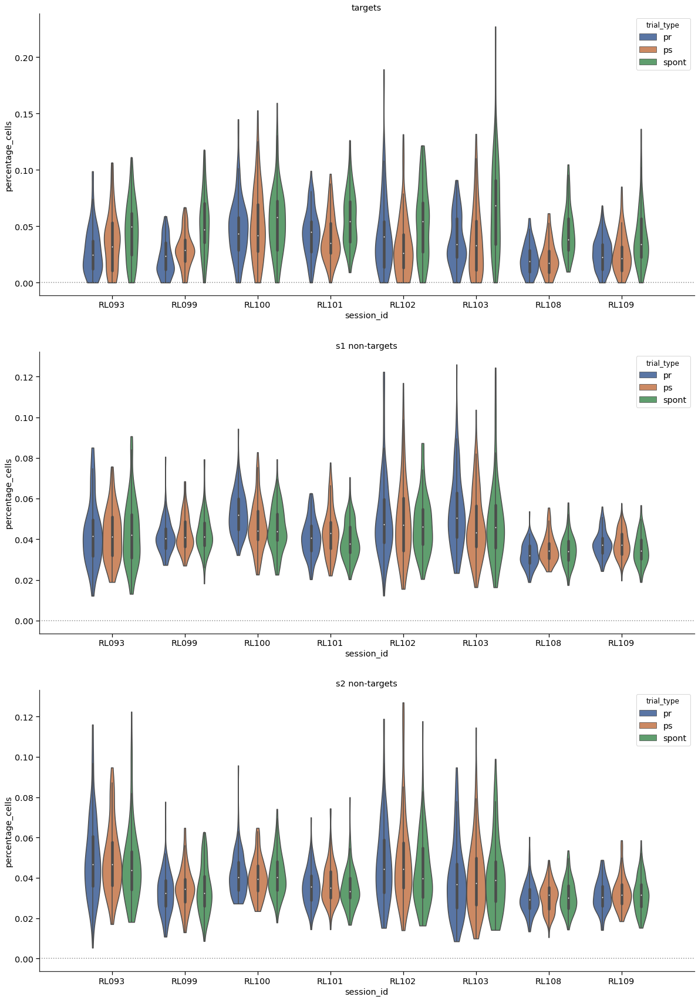

In [42]:
# for each trial type I need to append results to a dataframe for targets, s1 non-targets and s2 non-targets
# because different rows are going to be different dataframes
# also need to filter positive responses for first plot, but negative for later (make this easy)

cell_df = pd.read_pickle(cell_df_path)
cell_trial_df = pd.read_pickle(cell_trial_df_path)

target_types = ['pr', 'ps', 'pr']
trial_types = ['pr', 'ps', 'spont']

target_df = pd.DataFrame()
s1_nontarget_df = pd.DataFrame()
s2_nontarget_df = pd.DataFrame()

dfs = [target_df, s1_nontarget_df, s2_nontarget_df]

for target, trial in zip(target_types, trial_types):
    
    target_cell_ids = cell_df.query(target + '_target & s1_cell').index
    s1_nontarget_cell_ids = cell_df.query('~' + target + '_target & s1_cell').index
    s2_nontarget_cell_ids = cell_df.query('~' + target + '_target & s2_cell').index
    
    cell_id_list = [target_cell_ids, s1_nontarget_cell_ids, s2_nontarget_cell_ids]
    
    n_targets = cell_df.query(target + '_target & s1_cell').groupby('session_id').count()['cell_num']
    n_s1_nontargets = cell_df.query('~' + target + '_target & s1_cell').groupby('session_id').count()['cell_num']
    n_s2_nontargets = cell_df.query('~' + target + '_target & s2_cell').groupby('session_id').count()['cell_num']
    
    n_cells_list = [n_targets, n_s1_nontargets, n_s2_nontargets]
    
    for i, (cell_ids, n_cells) in enumerate(zip(cell_id_list, n_cells_list)):
        
        cell_filter = cell_trial_df['cell_id'].isin(cell_ids)
        filtered_df = cell_trial_df[cell_filter]

        sign_filter = filtered_df[trial + '_amp_resp'] < 0 # SWAP THIS FOR POSITIVE/NEGATIVE < >
        filtered_df = filtered_df[sign_filter]
        
        summed_df = filtered_df.groupby(['session_id', 'trial_num'])['trial_sig_dff_' + 
                                                                     trial].sum().reset_index(drop=False)
        temp_df = pd.DataFrame({'session_id' : summed_df['session_id'],
                                'trial_num' : summed_df['trial_num'],
                                'trial_type' : np.repeat(trial, len(summed_df)),
                                'num_cells' : summed_df['trial_sig_dff_' + trial],
                                'n_units' : np.repeat(n_cells, 100).reset_index(drop=True)
                               })
        temp_df['percentage_cells'] = temp_df['num_cells']/temp_df['n_units']
        
        dfs[i] = pd.concat([dfs[i], temp_df])
        
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(20,30))

session_ids = cell_df['session_id'].unique()
animal_ids = [session_id.split('_')[-1] for session_id in session_ids]
row_titles = ['targets', 's1 non-targets', 's2 non-targets']

for row_i, row in enumerate(axes):
    sns.violinplot(x='session_id', y='percentage_cells', hue='trial_type', data=dfs[row_i],
                   dodge=True, ax=row, cut=0)
    row.set_xticklabels(animal_ids)
    row.set_title(row_titles[row_i])
    
    row.hlines(0, -1, 17, linestyles='dotted', zorder=4, alpha=0.5, color='k');
    row.set_xlim([-1,8])

# save the figure
save_path = os.path.join(qnap_path, session_type + 
                         '_PctPosRespondingCells_perTrial_violinplot_row_TargetID_splitby_SessionID_TrialType')
# ia.savePlot(save_path)

# Number of targets/non-targets responding on each trial

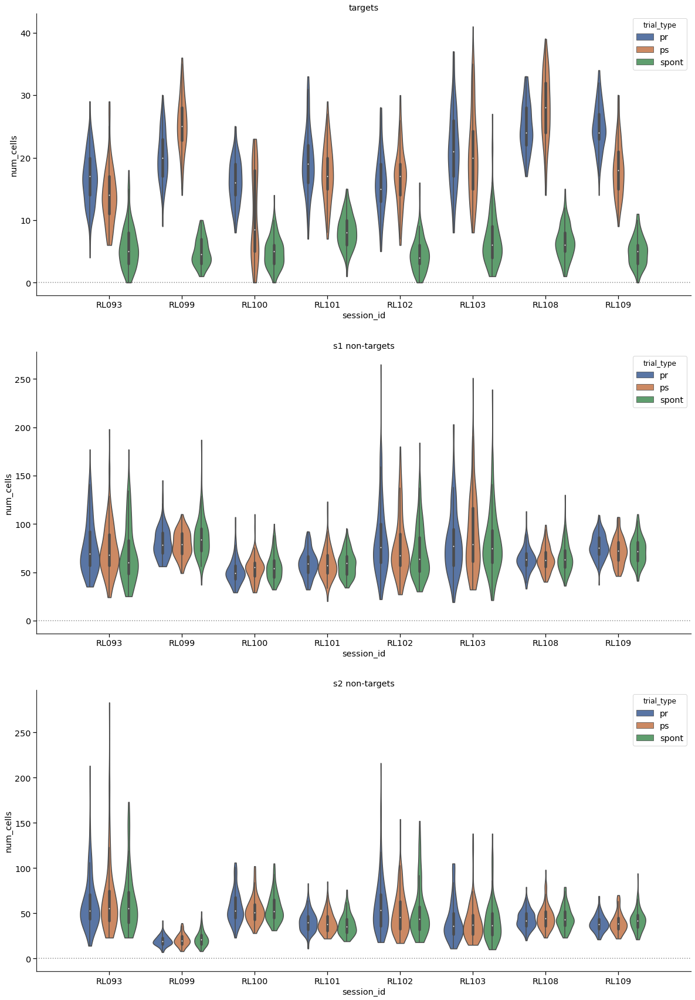

In [43]:
# for each trial type I need to append results to a dataframe for targets, s1 non-targets and s2 non-targets
# because different rows are going to be different dataframes
# also need to filter positive responses for first plot, but negative for later (make this easy)

cell_df = pd.read_pickle(cell_df_path)
cell_trial_df = pd.read_pickle(cell_trial_df_path)

target_types = ['pr', 'ps', 'pr']
trial_types = ['pr', 'ps', 'spont']

target_df = pd.DataFrame()
s1_nontarget_df = pd.DataFrame()
s2_nontarget_df = pd.DataFrame()

dfs = [target_df, s1_nontarget_df, s2_nontarget_df]

for target, trial in zip(target_types, trial_types):
    
    target_cell_ids = cell_df.query(target + '_target & s1_cell').index
    s1_nontarget_cell_ids = cell_df.query('~' + target + '_target & s1_cell').index
    s2_nontarget_cell_ids = cell_df.query('~' + target + '_target & s2_cell').index
    
    cell_id_list = [target_cell_ids, s1_nontarget_cell_ids, s2_nontarget_cell_ids]
    
    for i, cell_ids in enumerate(cell_id_list):
        
        cell_filter = cell_trial_df['cell_id'].isin(cell_ids)
        filtered_df = cell_trial_df[cell_filter]

        sign_filter = filtered_df[trial + '_amp_resp'] > 0 # SWAP THIS FOR POSITIVE/NEGATIVE < >
        filtered_df = filtered_df[sign_filter]
        
        summed_df = filtered_df.groupby(['session_id', 'trial_num'])['trial_sig_dff_' + 
                                                                     trial].sum().reset_index(drop=False)
        temp_df = pd.DataFrame({'session_id' : summed_df['session_id'],
                                'trial_num' : summed_df['trial_num'],
                                'trial_type' : np.repeat(trial, len(summed_df)),
                                'num_cells' : summed_df['trial_sig_dff_' + trial]
                               })
        dfs[i] = pd.concat([dfs[i], temp_df])
        
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(20,30))

session_ids = cell_df['session_id'].unique()
animal_ids = [session_id.split('_')[-1] for session_id in session_ids]
row_titles = ['targets', 's1 non-targets', 's2 non-targets']

for row_i, row in enumerate(axes):
    sns.violinplot(x='session_id', y='num_cells', hue='trial_type', dodge=True, data=dfs[row_i], ax=row, cut=0)
    row.set_xticklabels(animal_ids)
    row.set_title(row_titles[row_i])
    
    row.hlines(0, -1, 17, linestyles='dotted', zorder=4, alpha=0.5, color='k');
    row.set_xlim([-1,8])

# save the figure
save_path = os.path.join(qnap_path, session_type + 
                         '_NumNegRespondingCells_perTrial_violinplot_row_TargetID_splitby_SessionID_TrialType')
# ia.savePlot(save_path)

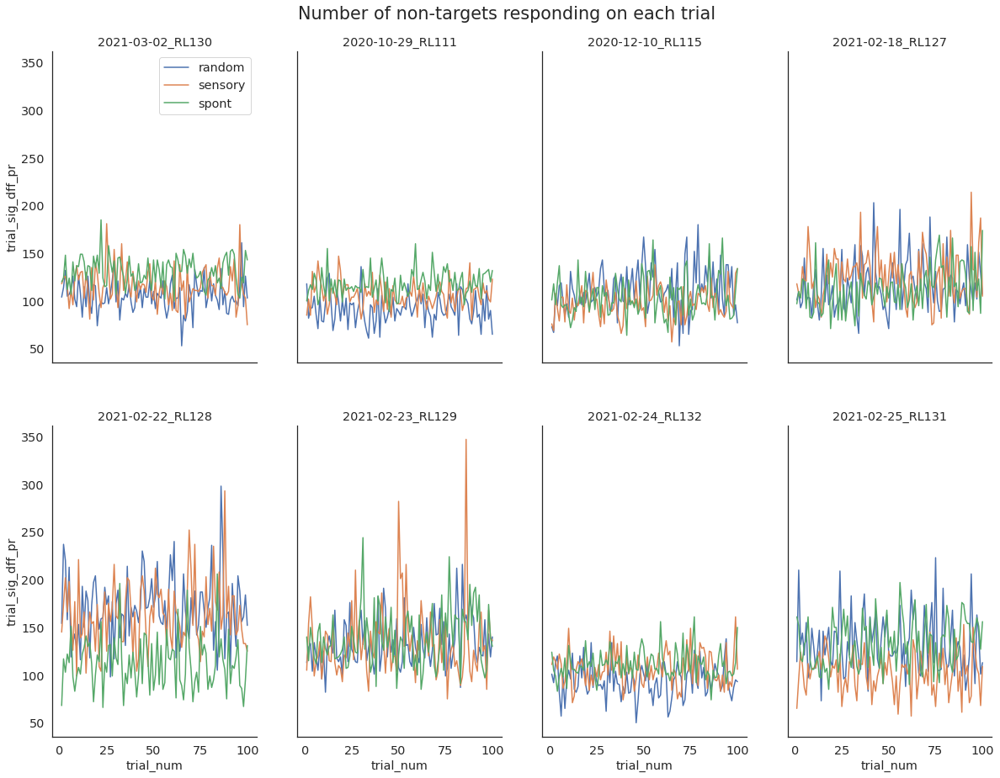

In [5]:
# Plot positive target responses over trials for all animals, on same graph
# plots = number, summed activity
# row/col = animal
# splitby = trial type (random/sensory/sham)
# SHARE Y AXIS

cell_df = pd.read_pickle(qnap_path + '/pkl_files/dataframes/' + session_type + '_cell_df.pkl')
cell_trial_df = pd.read_pickle(qnap_path + '/pkl_files/dataframes/' + session_type + '_cell_trial_df.pkl')

trials = ['pr', 'ps', 'spont']
targets = ['pr', 'ps', 'pr']
colors = ['C0', 'C1', 'C2']

session_ids = cell_trial_df['session_id'].unique()   

nrows = 2
ncols = 4

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, sharey=True, sharex=True, figsize=(20,15))

for color, trial, target in zip(colors, trials, targets):
    
    target_cell_ids = cell_df.query('~' + target + '_target & ' + trial + '_resp_sign').index

    target_filter = cell_trial_df['cell_id'].isin(target_cell_ids)
    
    filtered_df = cell_trial_df[target_filter] \
                   .groupby(['session_id', 'trial_num'])['trial_sig_dff_' + trial] \
                   .sum() \
                   .reset_index(drop=False) \
        
    for row_i, row in enumerate(axes):
        for col_i, col in enumerate(row):

            session_df = filtered_df[filtered_df['session_id']==session_ids[(ncols*row_i)+col_i]]

            sns.lineplot(x='trial_num', y='trial_sig_dff_'+trial, data=session_df, ci=None, ax=col, label=trial, legend=False)
            col.set_title(session_ids[(ncols*row_i)+col_i])
            if col_i==0 and row_i==0: col.legend(['random', 'sensory', 'spont'])
#             col.set_ylim([50, 200])
                
plt.suptitle('Number of non-targets responding on each trial', y=0.93, fontsize='xx-large');

# Summed activity of targets/non-targets responding positively on each trial

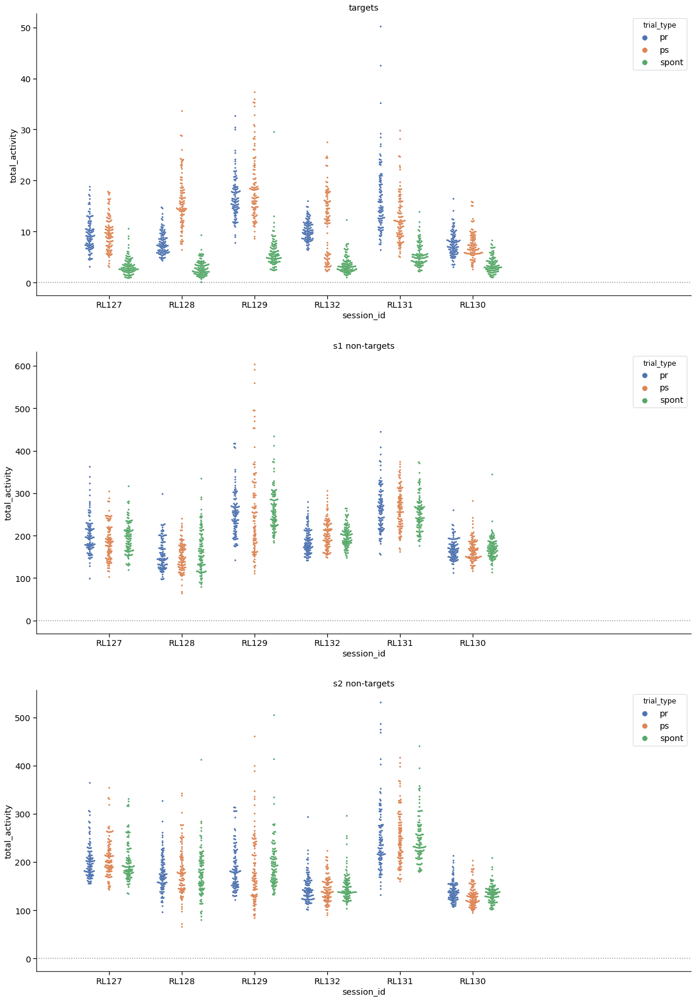

In [35]:
cell_df = pd.read_pickle(cell_df_path)
cell_trial_df = pd.read_pickle(cell_trial_df_path)

target_types = ['pr', 'ps', 'pr']
trial_types = ['pr', 'ps', 'spont']

target_df = pd.DataFrame()
s1_nontarget_df = pd.DataFrame()
s2_nontarget_df = pd.DataFrame()

dfs = [target_df, s1_nontarget_df, s2_nontarget_df]

for target, trial in zip(target_types, trial_types):
    
    target_cell_ids = cell_df.query(target + '_target & s1_cell').index
    s1_nontarget_cell_ids = cell_df.query('~' + target + '_target & s1_cell').index
    s2_nontarget_cell_ids = cell_df.query('~' + target + '_target & s2_cell').index
    
    cell_id_list = [target_cell_ids, s1_nontarget_cell_ids, s2_nontarget_cell_ids]
    
    for i, cell_ids in enumerate(cell_id_list):
        
        cell_filter = cell_trial_df['cell_id'].isin(cell_ids)
        filtered_df = cell_trial_df[cell_filter]

        sign_filter = filtered_df[trial + '_amp_resp'] > 0
        filtered_df = filtered_df[sign_filter]
        
        summed_df = filtered_df.groupby(['session_id', 'trial_num']).sum().reset_index(drop=False)
        temp_df = pd.DataFrame({'session_id' : summed_df['session_id'],
                                'trial_num' : summed_df['trial_num'],
                                'trial_type' : np.repeat(trial, len(summed_df)),
                                'total_activity' : summed_df[trial + '_amp_resp']
                               })
        dfs[i] = pd.concat([dfs[i], temp_df])
        
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(20,30))

session_ids = cell_df['session_id'].unique()
animal_ids = [session_id.split('_')[-1] for session_id in session_ids]
row_titles = ['targets', 's1 non-targets', 's2 non-targets']

for row_i, row in enumerate(axes):
#     sns.violinplot(x='session_id', y='total_activity', hue='trial_type', dodge=True, data=dfs[row_i], ax=row)
    sns.swarmplot(x='session_id', y='total_activity', hue='trial_type', size=3, dodge=True, data=dfs[row_i], ax=row)
    row.set_xticklabels(animal_ids)
    row.set_title(row_titles[row_i])

    row.hlines(0, -1, 17, linestyles='dotted', zorder=4, alpha=0.5, color='k');
    row.set_xlim([-1,8])

# save the figure
# save_path = os.path.join(qnap_path, session_type + 
#                          '_TotalNegActivity_perTrial_violinplot_row_TargetID_splitby_SessionID_TrialType')
# ia.savePlot(save_path)

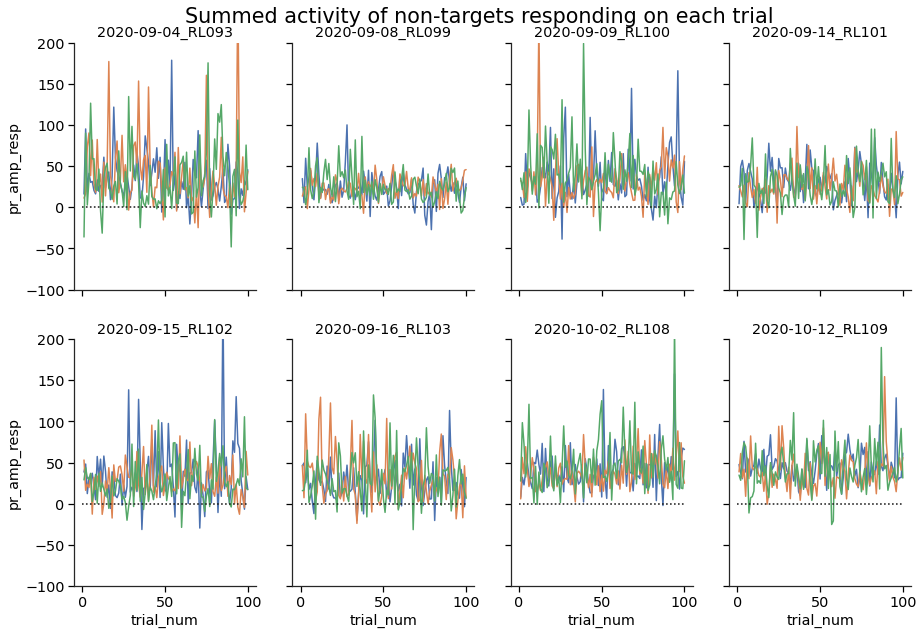

In [51]:
cell_df = pd.read_pickle(cell_df_path)
cell_trial_df = pd.read_pickle(cell_trial_df_path)

trials = ['pr', 'ps', 'spont']
targets = ['pr', 'ps', 'pr']
colors = ['C0', 'C1', 'C2']

session_ids = cell_trial_df['session_id'].unique()   

fig, axes = plt.subplots(nrows=2, ncols=4, sharey=True, sharex=True, figsize=(15,10))

for color, target, trial in zip(colors, targets, trials):
    
    target_cell_ids = cell_df.query('~' + target + '_target & ' + trial + '_resp_sign').index

    target_filter = cell_trial_df['cell_id'].isin(target_cell_ids)
    
    filtered_df = cell_trial_df[target_filter] \
                   .groupby(['session_id', 'trial_num', 'trial_sig_dff_'+trial])[trial+'_amp_resp'] \
                   .sum() \
                   .reset_index(drop=False) \
        
    for ax_i, ax in enumerate(axes.flatten()):
        try:
            session_df = filtered_df[(filtered_df['session_id']==session_ids[ax_i]) & 
                                     filtered_df['trial_sig_dff_'+trial]]
        except:
            break
            
        sns.lineplot(x='trial_num', y=trial+'_amp_resp', data=session_df, ci=None, ax=ax, 
                     label=trial, legend=False)
        ax.set_title(session_ids[ax_i])
        if ax_i==0: col.legend(['random', 'sensory'])
        if not (ax_i % 4): col.set_ylabel('summed activity (dFF)')
        ax.set_ylim([-100, 200])
        ax.hlines(0, 0, 100, linestyles='dotted', zorder=4, alpha=0.5, color='k');
                
plt.suptitle('Summed activity of non-targets responding on each trial', y=0.93, fontsize='xx-large');

# Number of targets/non-targets responding on each trial

In [ ]:
# plot 2d heatmap of
# cells (y-axis)
# vs.
# activity using trial + _amp_resp from cell_trial_df (x-axis)

cell_df = pd.read_pickle(cell_df_path)
cell_trial_df = pd.read_pickle(cell_trial_df_path)

trials = ['pr', 'ps', 'spont']
targets = ['pr', 'ps', 'pr']

session_ids = cell_trial_df['session_id'].unique()   

for session_id in session_ids:
    
    fig, axes = plt.subplots(nrows=1, ncols=3, sharey=True, sharex=True, figsize=(15,5))
    
    session_df = cell_df[cell_df['session_id']==session_id]
    
    for trial, target, ax in zip(trials, targets, axes):
    
#         target_cell_ids = session_df.query('~' + target + '_target & s2_cell').index
        target_cell_ids = session_df.query(target + '_target').index
        target_filter = cell_trial_df['cell_id'].isin(target_cell_ids)
        filtered_df = cell_trial_df[target_filter]

        crop_df = filtered_df.loc[:,['cell_num', 'trial_num', trial + '_amp_resp']]
        pivot_df = crop_df.pivot('cell_num', 'trial_num', trial + '_amp_resp')
        sns.heatmap(pivot_df, vmin=0, vmax=1, ax=ax, xticklabels=False, yticklabels=False);

        ax.set_title(trial)

        plt.suptitle('Number of targets responding on each trial (' + session_id + ')', fontsize='xx-large');

# Filtering trials based on target responses

In [ ]:
cell_trial_df = pd.read_pickle(cell_trial_df_path)
cell_df = pd.read_pickle(cell_df_path)

responses = ['pr_amp_resp', 'ps_amp_resp', 'spont_amp_resp']
targets = ['pr_target', 'ps_target', 'pr_target']
trials = ['random', 'sensory', 'sham']

fig, axes = plt.subplots(nrows=3, ncols=1, sharex=True, figsize=(20,15))

for response, target, trial, ax in zip(responses, targets, trials, axes):
    
    target_cell_ids = cell_df.query(target).index

    target_filter = cell_trial_df['cell_id'].isin(target_cell_ids)
    target_df = cell_trial_df[target_filter].dropna()
    sum_target_df = target_df.groupby(['trial_num', 'session_id']).sum()

    sns.kdeplot(data=sum_target_df, x=response, hue='session_id', legend=True, ax=ax)
    
ax.set_xlabel('Summed target activity (dFF)')
plt.suptitle('Target activity split by animal (sum dFF)', y=0.92, fontsize='xx-large');

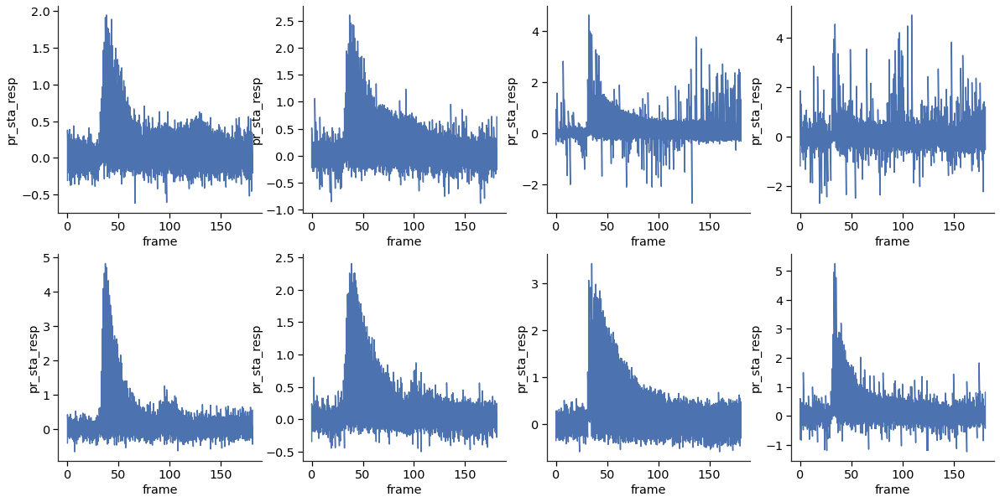

In [38]:
# Plotting all target STAs for each session

tcells = cell_df.query('pr_target').index
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)
tcell_filter = cell_mean_timepoint_df['cell_id'].isin(tcells)
tcell_sta = cell_mean_timepoint_df[tcell_filter].groupby('session_id')

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20,10))
axes_fl = axes.flatten()

for ax_i, (name, group) in enumerate(tcell_sta):
    ax = axes_fl[ax_i]
    sns.lineplot(x='frame', y='pr_sta_resp', data=group, estimator=None, ax=ax)

In [ ]:
# Plotting each STA for significantly responding targets

%matplotlib widget
from ipywidgets import *

cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)
cell_df = pd.read_pickle(cell_df_path)

tcell_ids = cell_df.query('pr_target & sta_sig_pr').index

tcell_filter = cell_mean_timepoint_df['cell_id'].isin(tcell_ids)
tcell_stas = cell_mean_timepoint_df[tcell_filter]

default_cell = tcell_ids.values[0]
default_filter = cell_mean_timepoint_df['cell_id'].isin([default_cell])
default_data = cell_mean_timepoint_df[default_filter]

default_x = default_data['timepoint']
default_y = default_data['pr_sta_resp']

fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
dff_line, = ax.plot(default_x, default_y, c='k')
baseline = ax.hlines(0, min(default_x), max(default_x), color='0.6', linestyle='--')
ax.set_ylim([-1, 1])

def update(cell_id):
    
    tcell_filter = cell_mean_timepoint_df['cell_id'].isin([cell_id])
    tcell_sta = cell_mean_timepoint_df[tcell_filter]

    x = tcell_sta['timepoint']
    y = tcell_sta['pr_sta_resp']
    
    dff_line.set_ydata(y)
    dff_line.set_xdata(x)

    fig.canvas.draw_idle()

interact(update, cell_id=list(tcells));

In [ ]:
# Plot S2 responses to photostim
# Final result is S2 responses for target sum dFF >15 and <15

cell_df = pd.read_pickle(cell_df_path)
cell_trial_df = pd.read_pickle(cell_trial_df_path)

responses = ['pr_amp_resp', 'ps_amp_resp', 'spont_amp_resp']
targets = ['pr_target', 'ps_target', 'pr_target']
trials = ['random', 'sensory', 'spont']

fig, axes = plt.subplots(nrows=3, ncols=1, sharex=True, sharey=True, figsize=(4,15))

for response, target, trial, ax in zip(responses, targets, trials, axes):
    
    target_cell_ids = cell_df.query(target).index
    target_filter = cell_trial_df['cell_id'].isin(target_cell_ids)
    target_df = cell_trial_df[target_filter] \
                   .groupby(['session_id', 'trial_num']) \
                   .sum()

    low_activity = target_df[response] < 15
    high_activity = target_df[response] >= 15
    print(trial, 
          'n targets low:', sum(low_activity), 
          'high:', sum(high_activity))

    s2_cell_ids = cell_df.query('s2_cell').index
    s2_filter = cell_trial_df['cell_id'].isin(s2_cell_ids)
    s2_df = cell_trial_df[s2_filter] \
               .groupby(['session_id', 'trial_num']) \
               .sum()

    split_df = pd.DataFrame({'low_activity' : s2_df[low_activity][response],
                             'high_activity' : s2_df[high_activity][response]
                            })
    
    sns.barplot(data=split_df, ax=ax)
    ax.set_title(trial)
    ax.set_ylabel(response)

plt.suptitle('Summed activity of S2 cells in response\nto low or high target activity', y=0.94, fontsize='x-large');

# Target input vs non-target output activity in responding cells (scatterplot)

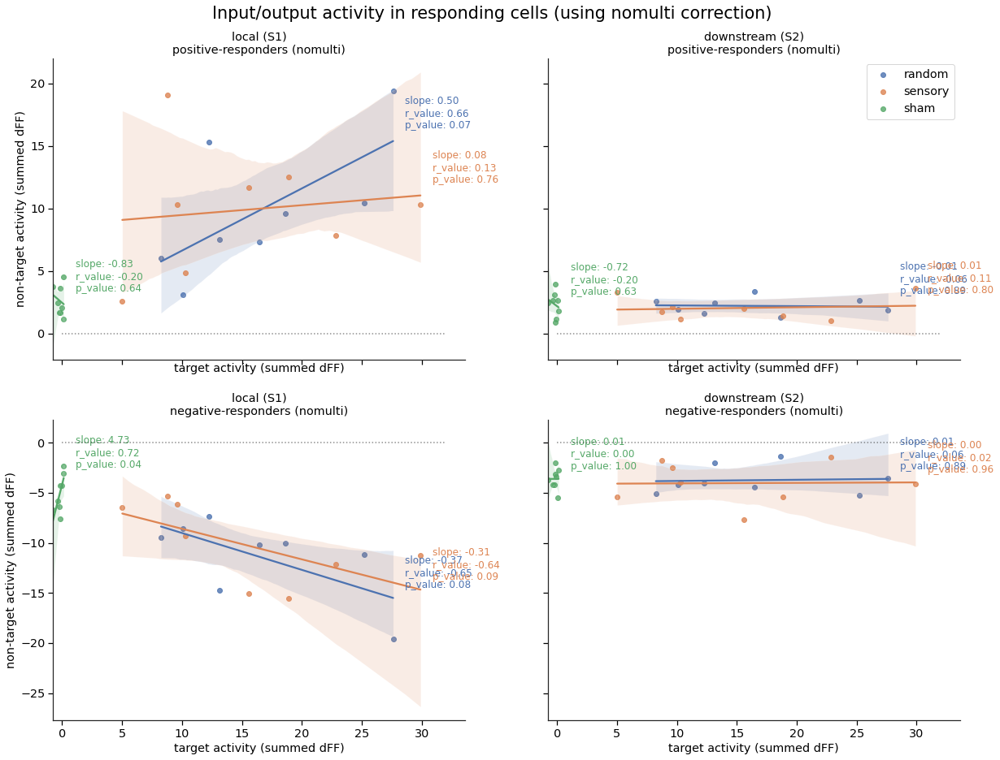

In [52]:
cell_df = pd.read_pickle(cell_df_path)
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)

# list of column names to be used to filter the dataframe
test_type = 'nomulti'
if test_type == 'fdr':
    stat_test = ['sta_sig_pr', 'sta_sig_ps', 'sta_sig_spont']
    trial_type = ['random', 'sensory']
if test_type == 'nomulti':
    stat_test = ['sta_sig_nomulti_pr', 'sta_sig_nomulti_ps', 'sta_sig_nomulti_spont']
    trial_type = ['random', 'sensory', 'sham']
target_type = ['pr_target', 'ps_target', 'pr_target']
sign_bool = ['pr_resp_sign', 'ps_resp_sign', 'spont_resp_sign']
responses = ['pr_sta_amp_resp', 'ps_sta_amp_resp', 'spont_sta_amp_resp']

# create and populate the plots using filtered data
fig, axes = plt.subplots(nrows=2, ncols=2, sharey='row', sharex=True, figsize=(20,15))
    
for stim_id, trial in enumerate(trial_type):
    
    # define column names
    response = responses[stim_id]
    test = stat_test[stim_id]
    target = target_type[stim_id]
    sign = sign_bool[stim_id]

    # filter dataframes using variables above
    s1_targets = cell_df[cell_df[test] & cell_df[target] & cell_df['s1_cell']].groupby('session_id').sum()
    s1_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & 
                                cell_df[sign]].groupby('session_id').sum()
    s2_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & 
                                cell_df[sign]].groupby('session_id').sum()

    s1_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & 
                                ~cell_df[sign]].groupby('session_id').sum()
    s2_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & 
                                ~cell_df[sign]].groupby('session_id').sum()
    
    for row, pos_neg_df in enumerate([[s1_nontargets_pos, s2_nontargets_pos],
                                      [s1_nontargets_neg, s2_nontargets_neg]                              
                                     ]):
        for col, target_nontarget_df in enumerate(pos_neg_df):
            df = pd.DataFrame({'target activity (summed dFF)'    : s1_targets[response],
                               'non-targets'                     : target_nontarget_df[response]
                              })
            p = sns.regplot(x='target activity (summed dFF)', y='non-targets', data=df, label=trial, 
                            ax=axes[row, col], ci=95, fit_reg=True)
            
            df = df.dropna() # remove axes containing NaN values (otherwise linregress doesn't function correctly)
            slope, _, r_value, p_value, _ = stats.linregress(x=df['target activity (summed dFF)'], 
                                                             y=df['non-targets'])
            
            max_y, max_x = p.get_lines()[-1].get_ydata()[-1], p.get_lines()[-1].get_xdata()[-1] # get max x/y coords of line
            axes[row,col].text(max_x+1, max_y+1, 
                               'slope: {:.2f} \nr_value: {:.2f} \np_value: {:.2f}'.format(slope, r_value, p_value),
                               color='C' + str(stim_id)) 
            
row_titles = ['positive-responders (' + test_type + ')', 
              'negative-responders (' + test_type + ')'
             ]
column_titles = ['local (S1)', 'downstream (S2)']

for row_i, row in enumerate(axes):
    for col_i, col in enumerate(row):
        col.set_title(column_titles[col_i] + '\n' + row_titles[row_i])
        if col_i == 0: col.set_ylabel('non-target activity (summed dFF)')
        else: col.set_ylabel('')
        if col_i==1 and row_i==0: col.legend()
        col.set_xlabel('target activity (summed dFF)')
        col.hlines(0, 0, 32, linestyles='dotted', zorder=4, alpha=0.5, color='k');

plt.suptitle('Input/output activity in responding cells (using ' + test_type + ' correction)', 
             y=0.94, fontsize='xx-large');
    
# save the figure
save_path = os.path.join(qnap_path, session_type + '_InputOutput_' + test_type + 
                         '_regplot_row_ResponseType_col_TargetID_splitby_TrialType')
# ia.savePlot(save_path)

# Target input vs non-target output activity in all cells, responding or not (scatterplot)

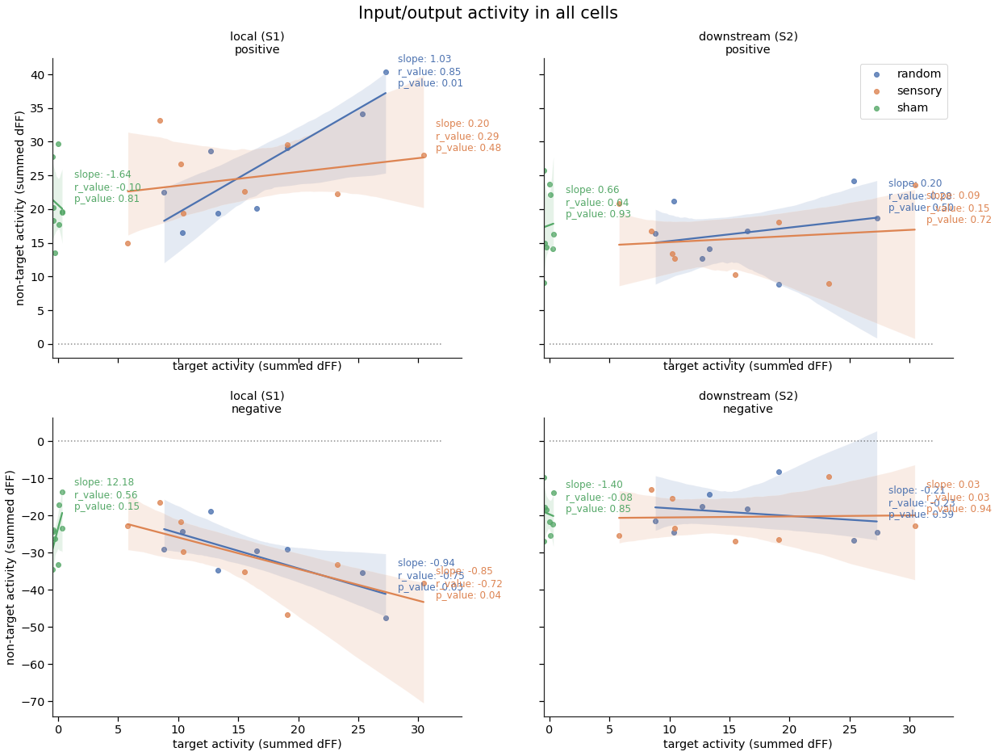

In [53]:
cell_df = pd.read_pickle(cell_df_path)
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)

# list of column names to be used to filter the dataframe
target_type = ['pr_target', 'ps_target', 'pr_target']
sign_bool = ['pr_resp_sign', 'ps_resp_sign', 'spont_resp_sign']
responses = ['pr_sta_amp_resp', 'ps_sta_amp_resp', 'spont_sta_amp_resp']
trial_type = ['random', 'sensory', 'sham']

# create and populate the plots using filtered data
fig, axes = plt.subplots(nrows=2, ncols=2, sharey='row', sharex=True, figsize=(20,15))
    
for stim_id, trial in enumerate(trial_type):
    
    # define column names
    response = responses[stim_id]
    target = target_type[stim_id]
    sign = sign_bool[stim_id]

    # filter dataframes using variables above
    s1_targets = cell_df[cell_df[target] & cell_df['s1_cell']].groupby('session_id').sum()
    s1_nontargets_pos = cell_df[~cell_df[target] & cell_df['s1_cell'] & cell_df[sign]].groupby('session_id').sum()
    s2_nontargets_pos = cell_df[~cell_df[target] & cell_df['s2_cell'] & cell_df[sign]].groupby('session_id').sum()

    s1_nontargets_neg = cell_df[~cell_df[target] & cell_df['s1_cell'] & ~cell_df[sign]].groupby('session_id').sum()
    s2_nontargets_neg = cell_df[~cell_df[target] & cell_df['s2_cell'] & ~cell_df[sign]].groupby('session_id').sum()
    
    for row, pos_neg_df in enumerate([[s1_nontargets_pos, s2_nontargets_pos],
                                      [s1_nontargets_neg, s2_nontargets_neg]                              
                                     ]):
        for col, target_nontarget_df in enumerate(pos_neg_df):
            df = pd.DataFrame({'target activity (summed dFF)'    : s1_targets[response],
                               'non-targets'                     : target_nontarget_df[response]
                              })
            p = sns.regplot(x='target activity (summed dFF)', y='non-targets', data=df, label=trial, 
                            ax=axes[row, col], ci=95, fit_reg=True)
            
            df = df.dropna() # remove axes containing NaN values (otherwise linregress doesn't function correctly)
            slope, _, r_value, p_value, _ = stats.linregress(x=df['target activity (summed dFF)'], 
                                                             y=df['non-targets'])
            
            max_y, max_x = p.get_lines()[-1].get_ydata()[-1], p.get_lines()[-1].get_xdata()[-1] # get max x/y coords of line
            axes[row,col].text(max_x+1, max_y+1, 
                               'slope: {:.2f} \nr_value: {:.2f} \np_value: {:.2f}'.format(slope, r_value, p_value),
                               color='C' + str(stim_id)) 
            
row_titles = ['positive', 
              'negative'
             ]
column_titles = ['local (S1)', 'downstream (S2)']

for row_i, row in enumerate(axes):
    for col_i, col in enumerate(row):
        col.set_title(column_titles[col_i] + '\n' + row_titles[row_i])
        if col_i == 0: col.set_ylabel('non-target activity (summed dFF)')
        else: col.set_ylabel('')
        if col_i==1 and row_i==0: col.legend()
        col.set_xlabel('target activity (summed dFF)')
        col.hlines(0, 0, 32, linestyles='dotted', zorder=4, alpha=0.5, color='k');

plt.suptitle('Input/output activity in all cells', y=0.94, fontsize='xx-large');
    
# save the figure
save_path = os.path.join(qnap_path, session_type + '_InputOutput_' + test_type + 
                         '_regplot_row_ResponseType_col_TargetID_splitby_TrialType')
# ia.savePlot(save_path)

# Input vs output activity in all trials, any cell, not just responding (scatterplot)

trial: random slope 0.5622391194192835 r_value 0.11086794807922182 p_value 0.0016860066828817662
trial: sensory slope 0.6152894897936257 r_value 0.1433991692437202 p_value 4.688119907072888e-05
trial: sham slope 2.206668274188393 r_value 0.23308435945401296 p_value 2.4815214159116215e-11


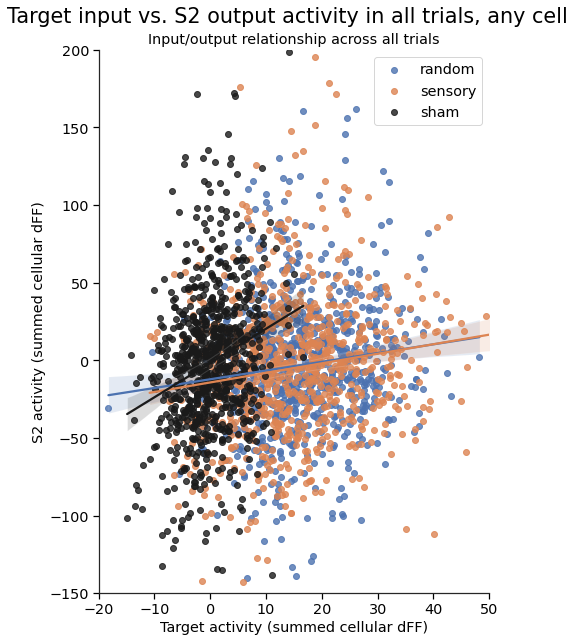

In [55]:
cell_trial_df = pd.read_pickle(cell_trial_df_path)
cell_df = pd.read_pickle(cell_df_path)

responses = ['pr_amp_resp', 'ps_amp_resp', 'spont_amp_resp']
targets = ['pr_target', 'ps_target', 'pr_target']
trials = ['random', 'sensory', 'sham']
colors = ['C0', 'C1', 'k']
# create and populate the plots using filtered data
fig, axes = plt.subplots(nrows=1, ncols=1, sharex=True, figsize=(7,10))

for response, target, trial, color in zip(responses, targets, trials, colors):
    
    s2_cell_ids = cell_df.query('s2_cell & ~' + target).index
    target_cell_ids = cell_df.query(target).index

    target_filter = cell_trial_df['cell_id'].isin(target_cell_ids)
    target_df = cell_trial_df[target_filter].dropna(axis=0, subset=[response])
    target_amp_resp = target_df.groupby(['trial_num','session_id']).sum()[response]

    s2_filter = cell_trial_df['cell_id'].isin(s2_cell_ids)
    s2_df = cell_trial_df[s2_filter].dropna(axis=0, subset=[response])
    s2_amp_resp = s2_df.groupby(['trial_num','session_id']).sum()[response]

    df = pd.DataFrame({'target_amp_resp' : target_amp_resp,
                       's2_amp_resp'     : s2_amp_resp})

    df = df.reset_index(drop=False)
    
    sns.regplot(x=df['target_amp_resp'], y=df['s2_amp_resp'], 
            data=df, ax=axes, label=trial, color=color)

    axes.set_title('Input/output relationship across all trials')
    axes.set_ylabel('S2 activity (summed cellular dFF)')
    axes.legend()
    axes.set_xlabel('Target activity (summed cellular dFF)')
    axes.set_xlim([-20, 50])
    axes.set_ylim([-150, 200])
    
    slope, _, r_value, p_value, _ = stats.linregress(x=df['target_amp_resp'], 
                                                     y=df['s2_amp_resp'])
    print('trial:', trial,
          'slope', slope,
          'r_value', r_value,
          'p_value', p_value
         )
            
plt.suptitle('Target input vs. S2 output activity in all trials, any cell', y=0.94, 
         fontsize='xx-large');

trial: random slope nan r_value nan p_value nan
trial: sensory slope nan r_value nan p_value nan
trial: sham slope nan r_value nan p_value nan
trial: random slope nan r_value nan p_value nan
trial: sensory slope nan r_value nan p_value nan
trial: sham slope nan r_value nan p_value nan


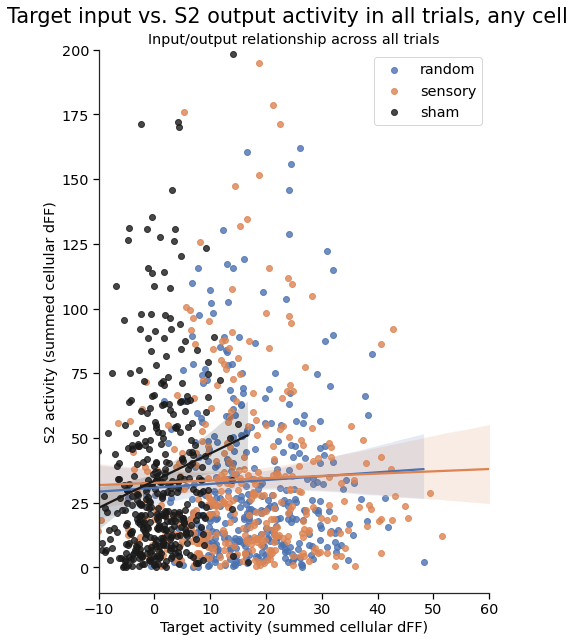

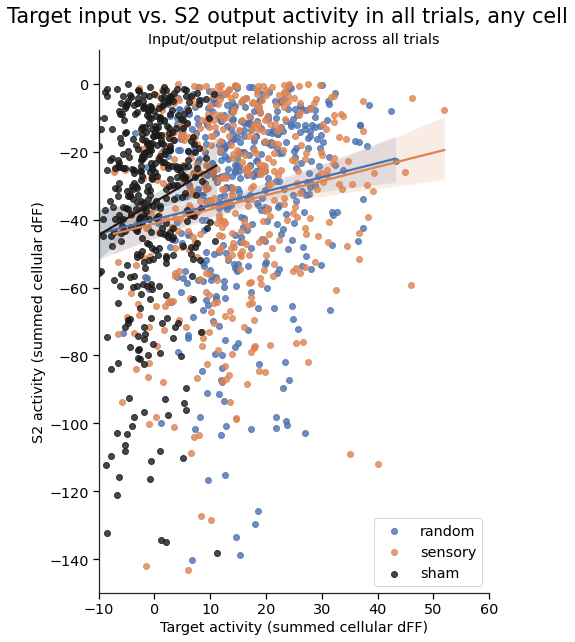

In [57]:
# split positive and negative

cell_trial_df = pd.read_pickle(cell_trial_df_path)
cell_df = pd.read_pickle(cell_df_path)

responses = ['pr_amp_resp', 'ps_amp_resp', 'spont_amp_resp']
targets = ['pr_target', 'ps_target', 'pr_target']
signs = ['pos', 'neg']
trials = ['random', 'sensory', 'sham']
colors = ['C0', 'C1', 'k']

for sign in signs:
    # create and populate the plots using filtered data
    fig, axes = plt.subplots(nrows=1, ncols=1, sharex=True, figsize=(7,10))
    
    for response, target, trial, color in zip(responses, targets, trials, colors):

        s2_cell_ids = cell_df.query('s2_cell & ~' + target).index
        target_cell_ids = cell_df.query(target).index

        target_filter = cell_trial_df['cell_id'].isin(target_cell_ids)
        target_df = cell_trial_df[target_filter].dropna(axis=0, subset=[response])
        target_amp_resp = target_df.groupby(['trial_num','session_id']).sum()[response]
        
        s2_filter = cell_trial_df['cell_id'].isin(s2_cell_ids)
        s2_df = cell_trial_df[s2_filter].dropna(axis=0, subset=[response])
        s2_amp_resp = s2_df.groupby(['trial_num','session_id']).sum()[response]
        if sign == 'pos':
            s2_amp_resp = s2_amp_resp[s2_amp_resp > 0]
        else:
            s2_amp_resp = s2_amp_resp[s2_amp_resp <= 0]
        
        df = pd.DataFrame({'target_amp_resp' : target_amp_resp,
                           's2_amp_resp'     : s2_amp_resp})

        df = df.reset_index(drop=False)

        sns.regplot(x=df['target_amp_resp'], y=df['s2_amp_resp'], 
                data=df, ax=axes, label=trial, color=color)

        axes.set_title('Input/output relationship across all trials')
        axes.set_ylabel('S2 activity (summed cellular dFF)')
        axes.legend()
        axes.set_xlabel('Target activity (summed cellular dFF)')
        if sign == 'pos':
            axes.set_xlim([-10, 60])
            axes.set_ylim([-10, 200])
        else:
            axes.set_xlim([-10, 60])
            axes.set_ylim([-150, 10])

        slope, _, r_value, p_value, _ = stats.linregress(x=df['target_amp_resp'], 
                                                         y=df['s2_amp_resp'])
        print('trial:', trial,
              'slope', slope,
              'r_value', r_value,
              'p_value', p_value
             )
            
    plt.suptitle('Target input vs. S2 output activity in all trials, any cell', y=0.94, 
             fontsize='xx-large');

In [43]:
# ANCOVA to compare slope/intercept of linear regression
from pingouin import ancova

cell_trial_df = pd.read_pickle(cell_trial_df_path)
cell_df = pd.read_pickle(cell_df_path)

responses = ['pr_amp_resp', 'ps_amp_resp', 'spont_amp_resp']
targets = ['pr_target', 'ps_target', 'pr_target']
trials = ['random', 'sensory', 'sham']

df = pd.DataFrame()

for response, target, trial in zip(responses, targets, trials):
    
    s2_cell_ids = cell_df.query('s2_cell & ~' + target).index
    s1_nt_cell_ids = cell_df.query('s1_cell & ~' + target).index
    target_cell_ids = cell_df.query(target).index

    target_filter = cell_trial_df['cell_id'].isin(target_cell_ids)
    target_df = cell_trial_df[target_filter]
    target_amp_resp = target_df.groupby(['trial_num','session_id']).sum()[response]

    s1_nt_filter = cell_trial_df['cell_id'].isin(s1_nt_cell_ids)
    s1_nt_df = cell_trial_df[s1_nt_filter]
    s1_nt_amp_resp = s1_nt_df.groupby(['trial_num','session_id']).sum()[response]

    s2_filter = cell_trial_df['cell_id'].isin(s2_cell_ids)
    s2_df = cell_trial_df[s2_filter]
    s2_amp_resp = s2_df.groupby(['trial_num','session_id']).sum()[response]

    temp_df = pd.DataFrame({'trial_type' : np.repeat(trial, len(s1_nt_amp_resp)),
                            'target_amp_resp' : target_amp_resp,
                            's1_nt_amp_resp' : s1_nt_amp_resp,
                            's2_amp_resp' : s2_amp_resp})

    df = pd.concat([df, temp_df])

df.reset_index(drop=True, inplace=True)

ancova(data=df, dv='s2_amp_resp', covar='s1_nt_amp_resp', between='trial_type')

,Source,SS,DF,F,p-unc,np2
0,trial_type,8.861858e+01,2,0.102225,9.028302e-01,0.000085
1,s1_nt_amp_resp,5.102415e+05,1,1177.168716,3.311107e-210,0.329447
2,Residual,1.038542e+06,2396,NaN,NaN,NaN


/home/rlees/anaconda3/envs/suite2p/lib/python3.7/site-packages/numpy/core/numeric.py:538: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


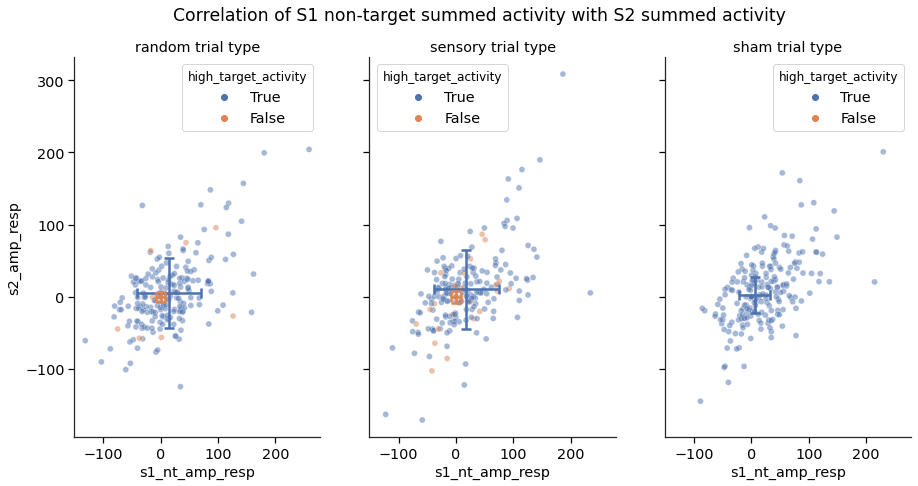

In [44]:
# need to plot target activity as another variable on scatterplot of s1 nontarget vs s2 nontarget activity

trial_types = ['random', 'sensory', 'sham']
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(15,7))

for ax, trial in zip(axes, trial_types):
    trial_type_df = df.copy(deep=True)
    trial_type_df = trial_type_df[trial_type_df['trial_type'] == trial]
    
    if trial not in 'sham':
        trial_type_df['high_target_activity'] = trial_type_df['target_amp_resp']>=15
    else:
        trial_type_df['high_target_activity'] = trial_type_df['target_amp_resp']>=0
        
    sns.scatterplot(data=trial_type_df, x='s1_nt_amp_resp', y='s2_amp_resp', alpha=0.5, 
                    hue='high_target_activity', hue_order=[True, False], ax=ax);
    
    high_act_mean_df = trial_type_df.query('high_target_activity').mean()
    high_act_std_df = trial_type_df.query('high_target_activity').std()
    low_act_mean_df = trial_type_df.query('~high_target_activity').mean()
    low_act_std_df = trial_type_df.query('~high_target_activity').std()
    
    ax.errorbar(high_act_mean_df['s1_nt_amp_resp'], high_act_mean_df['s2_amp_resp'],
                yerr=high_act_std_df['s2_amp_resp'], xerr=high_act_std_df['s1_nt_amp_resp'], elinewidth=2.5,
               capsize=5, capthick=2.5)
    
    ax.errorbar(low_act_mean_df['s1_nt_amp_resp'], low_act_mean_df['s2_amp_resp'],
                yerr=low_act_std_df['s2_amp_resp'], xerr=low_act_std_df['s1_nt_amp_resp'], elinewidth=2.5,
               capsize=5, capthick=2.5)

    ax.set_title(trial + ' trial type')
    plt.suptitle('Correlation of S1 non-target summed activity with S2 summed activity', fontsize='x-large')

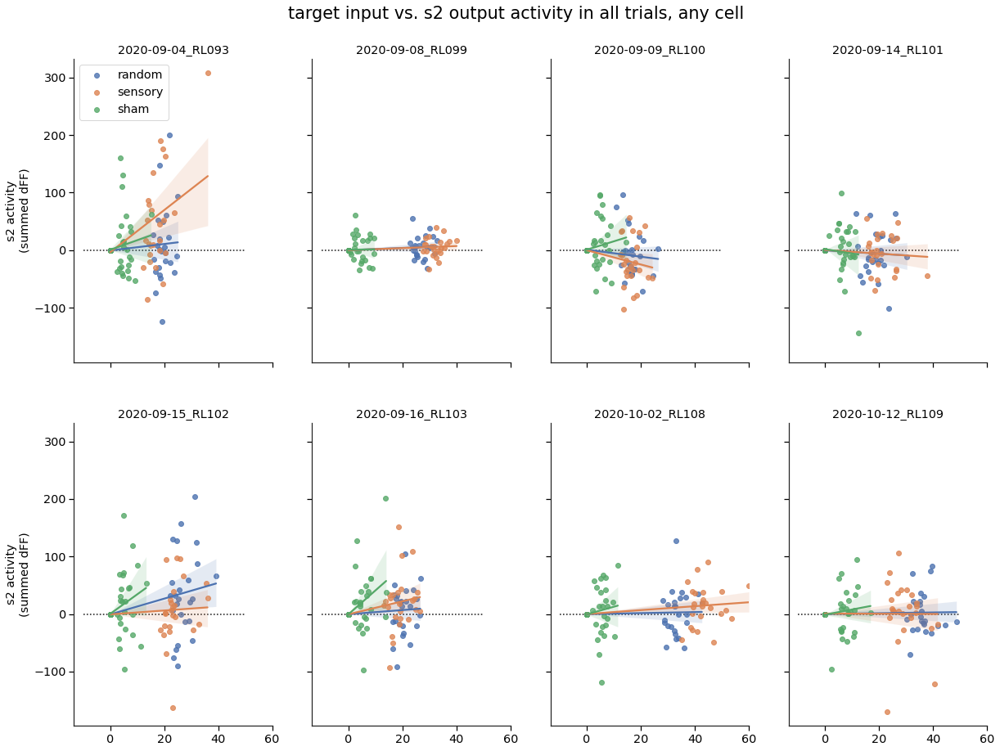

In [19]:
cell_trial_df = pd.read_pickle(cell_trial_df_path)
cell_df = pd.read_pickle(cell_df_path)

input_ = 'target'
output_ = 's2'

responses = ['pr_amp_resp', 'ps_amp_resp', 'spont_amp_resp']
targets = ['pr_target', 'ps_target', 'pr_target']
trials = ['random', 'sensory', 'sham']

session_ids = cell_trial_df['session_id'].unique()

# create and populate the plots using filtered data
fig, axes = plt.subplots(nrows=2, ncols=4, sharex=True, sharey=True, figsize=(20,15))

for response, target, trial in zip(responses, targets, trials):
    
    s1_cell_ids = cell_df.query('s1_cell & ~' + target).index
    s2_cell_ids = cell_df.query('s2_cell & ~' + target).index
    target_cell_ids = cell_df.query(target).index

    target_filter = cell_trial_df['cell_id'].isin(target_cell_ids)
    target_df = cell_trial_df[target_filter]
    target_amp_resp = target_df.groupby(['trial_num','session_id']).sum()[response]

    s1_filter = cell_trial_df['cell_id'].isin(s1_cell_ids)
    s1_df = cell_trial_df[s1_filter]
    s1_amp_resp = s1_df.groupby(['trial_num','session_id']).sum()[response]

    s2_filter = cell_trial_df['cell_id'].isin(s2_cell_ids)
    s2_df = cell_trial_df[s2_filter]
    s2_amp_resp = s2_df.groupby(['trial_num','session_id']).sum()[response]

    df = pd.DataFrame({'target_amp_resp' : target_amp_resp,
                       's1_amp_resp'     : s1_amp_resp,
                       's2_amp_resp'     : s2_amp_resp})

    df = df.reset_index(drop=False)
    
    for ax_i, ax in enumerate(axes.flatten()):
        
        try:
            sns.regplot(x=input_ + '_amp_resp', y=output_ + '_amp_resp', 
                    data=df[df['session_id']==session_ids[ax_i]], ax=ax, label=trial)
            
            ax.set_title(session_ids[ax_i])
            ax.hlines(0, -10, 50, linestyles='dotted', zorder=0, alpha=0.5, color='k');

            if not ax_i%4: ax.set_ylabel(output_ + ' activity\n(summed dFF)')
            else: ax.set_ylabel('')

            if ax_i==0: ax.legend()

            if ax_i>=12: ax.set_xlabel(input_ + ' activity (summed dFF)')
            else: ax.set_xlabel('')
        
        except:            
            break
            
plt.suptitle(input_ + ' input vs. ' + output_ + ' output activity in all trials, any cell', y=0.94, 
         fontsize='xx-large');

# Input vs output activity in all trials for responding cells, >1 sd baseline response (scatterplot)

In [ ]:
cell_trial_df = pd.read_pickle(cell_trial_df_path)
cell_df = pd.read_pickle(cell_df_path)

input_ = 'target'
output_ = 's1'

responses = ['pr_amp_resp', 'ps_amp_resp', 'spont_amp_resp']
targets = ['pr_target', 'ps_target', 'pr_target']
trials = ['random', 'sensory', 'sham']
tests = ['trial_sig_dff_pr', 'trial_sig_dff_ps', 'trial_sig_dff_spont']

session_ids = cell_trial_df['session_id'].unique()

# create and populate the plots using filtered data
fig, axes = plt.subplots(nrows=4, ncols=4, sharex=True, figsize=(20,15))

for response, target, trial, test in zip(responses, targets, trials, tests):
    
    s1_cell_ids = cell_df.query('s1_cell & ~' + target).index
    s2_cell_ids = cell_df.query('s2_cell & ~' + target).index
    target_cell_ids = cell_df.query(target).index

    target_filter = cell_trial_df['cell_id'].isin(target_cell_ids)
    target_df = cell_trial_df[target_filter].dropna().query(test)
    target_amp_resp = target_df.groupby(['trial_num','session_id']).sum()[response]

    s1_filter = cell_trial_df['cell_id'].isin(s1_cell_ids)
    s1_df = cell_trial_df[s1_filter].dropna().query(test)
    s1_amp_resp = s1_df.groupby(['trial_num','session_id']).sum()[response]

    s2_filter = cell_trial_df['cell_id'].isin(s2_cell_ids)
    s2_df = cell_trial_df[s2_filter].dropna().query(test)
    s2_amp_resp = s2_df.groupby(['trial_num','session_id']).sum()[response]

    df = pd.DataFrame({'target_amp_resp' : target_amp_resp,
                       's1_amp_resp'     : s1_amp_resp,
                       's2_amp_resp'     : s2_amp_resp})

    df = df.reset_index(drop=False)
    
    for ax_i, ax in enumerate(axes.flatten()):
        
        try:
            sns.regplot(x=input_+'_amp_resp', y=output_+'_amp_resp', 
                        data=df[df['session_id']==session_ids[ax_i]], ax=ax, label=trial)

            ax.set_title(session_ids[ax_i])
            ax.hlines(0, -10, 50, linestyles='dotted', zorder=0, alpha=0.5, color='k');

            if not ax_i % 4: ax.set_ylabel(output_ + ' non-target activity\n(summed dFF)')
            else: ax.set_ylabel('')

            if ax_i==0: ax.legend()

            if ax_i>=12: ax.set_xlabel(input_ + ' activity (summed dFF)')
            else: ax.set_xlabel('')
                
        except:
            break
                
plt.suptitle(input_ + ' input vs. ' + output_ + ' output activity in all trials, responders only', y=0.94, 
             fontsize='xx-large');

# Probability of response in all cells between trial types (distribution + scatterplot)

pr vs. spont: KstestResult(statistic=0.01870107277471731, pvalue=0.17907056883181408)
pr vs. ps: KstestResult(statistic=0.006668599594085242, pvalue=0.9979475528730813)
ps vs. spont: KstestResult(statistic=0.01696143809799942, pvalue=0.27420209599422)


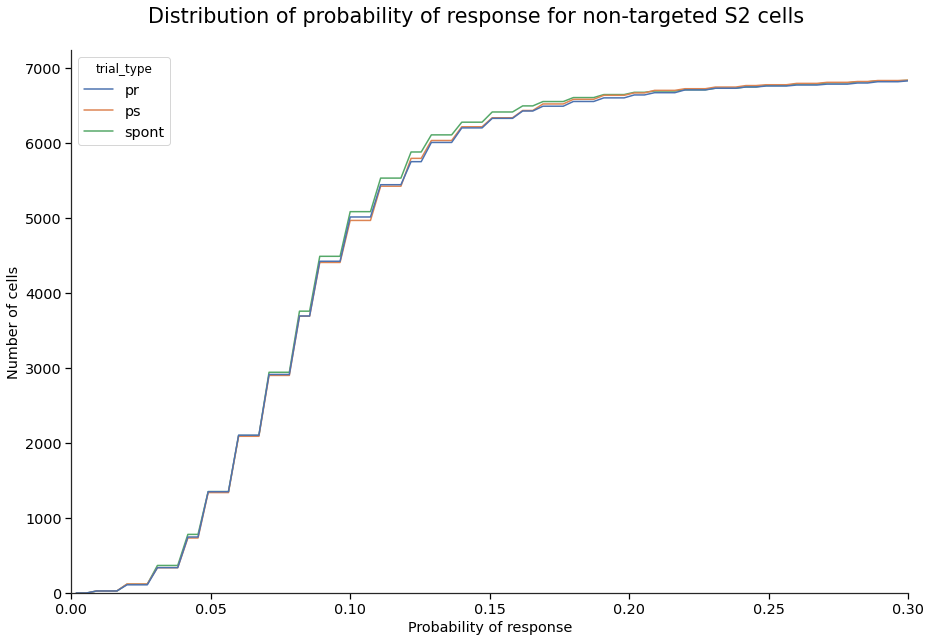

In [15]:
cell_df = pd.read_pickle(cell_df_path)

targets = ['pr', 'ps', 'pr']
trials = ['pr', 'ps', 'spont']

df = pd.DataFrame()

for trial, target in zip(trials, targets):
    query_df = cell_df.query('~' + target + '_target & s2_cell')
    
    temp_df = pd.DataFrame({
        'prob_response' : query_df['prob_response_' + trial],
        'trial_type' : np.repeat(trial, len(query_df))
    })
    df = pd.concat([df, temp_df])

# sns.displot(data=df, x='prob_response', hue='trial_type', kind='kde', height=10, aspect=10/8)
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(15,10))
sns.histplot(data=df, x='prob_response', hue='trial_type', stat='count', cumulative=True, fill=False, element='poly')
plt.xlim([0, 0.3])
plt.xlabel('Probability of response')
plt.ylabel('Number of cells')
# plt.ylim([0, 0.5])
plt.suptitle('Distribution of probability of response for non-targeted S2 cells', y=0.94, fontsize='xx-large');

print('pr vs. spont:', stats.ks_2samp(df[df['trial_type']=='pr']['prob_response'],
                                      df[df['trial_type']=='spont']['prob_response']))
print('pr vs. ps:', stats.ks_2samp(df[df['trial_type']=='pr']['prob_response'],
                                   df[df['trial_type']=='ps']['prob_response']))
print('ps vs. spont:', stats.ks_2samp(df[df['trial_type']=='ps']['prob_response'],
                                      df[df['trial_type']=='spont']['prob_response']))

# save the figure
save_path = os.path.join(qnap_path, session_type + '_ResponseProbCompare_NonTarget_displot_splitby_TrialType')
# ia.savePlot(save_path)

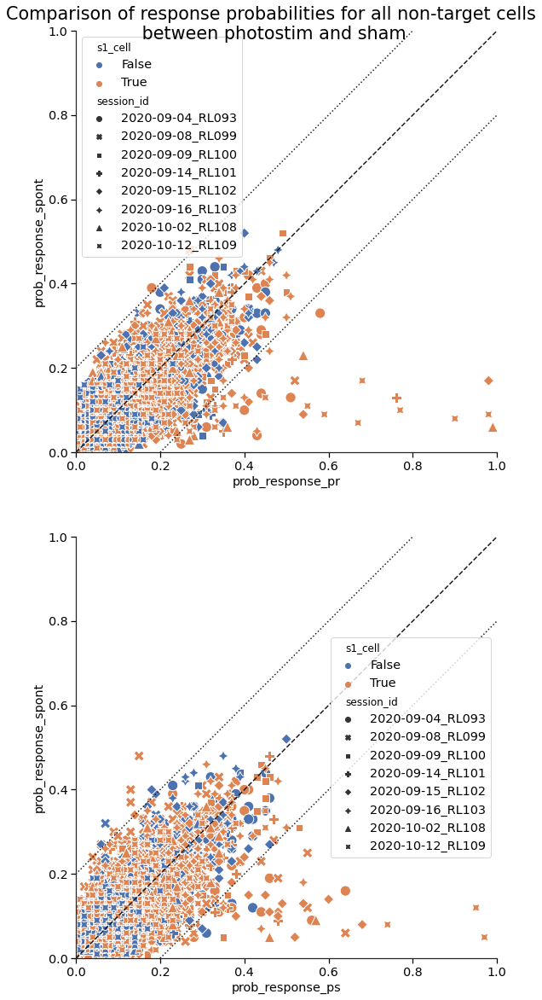

In [16]:
cell_df = pd.read_pickle(cell_df_path)

trials = ['pr', 'ps']

fig, axes = plt.subplots(nrows=2, figsize=(20,20))

for trial, ax in zip(trials, axes):
    sns.scatterplot(x='prob_response_'+trial, y='prob_response_spont', style='session_id', hue='s1_cell', 
                    data=cell_df.query('~' + trial + '_target'), ax=ax, color='k', s=150)
    ax.plot([0,1],[0,1], 'k', linestyle='dashed')
    ax.plot([0,1],[0.2,1.2], 'k', linestyle='dotted')
    ax.plot([0.2,1.2],[0,1], 'k', linestyle='dotted')
    ax.set_aspect('equal')
    ax.axis([0,1,0,1]);
    
plt.suptitle('Comparison of response probabilities for all non-target cells\n between photostim and sham', 
             y=0.9, fontsize='xx-large');

# save the figure
save_path = os.path.join(qnap_path, session_type + 
                         '_ResponseProbCompare_NonTarget_scatterplot_row_TrialType_splitby_S1Cell_SessionID')
# ia.savePlot(save_path)

# Average traces of individual cells with probability of response higher in photostim than sham + some offset (lineplots)

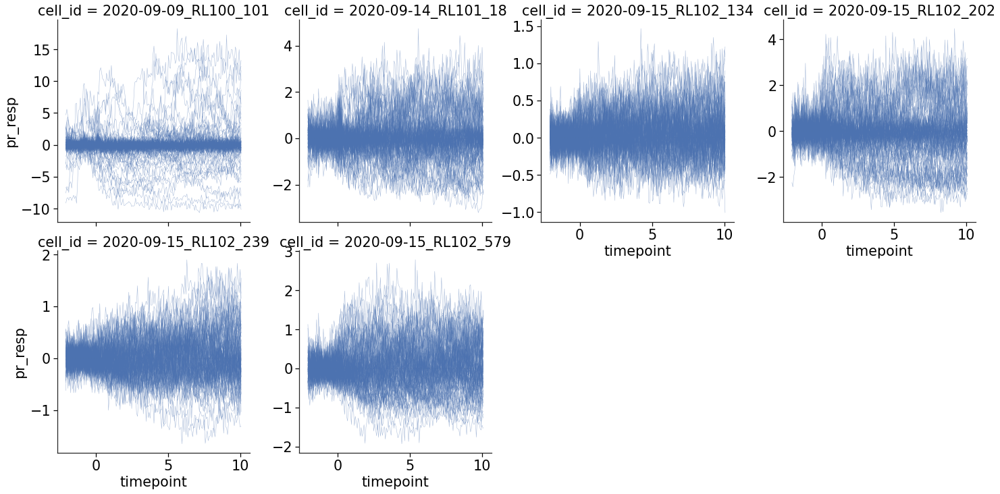

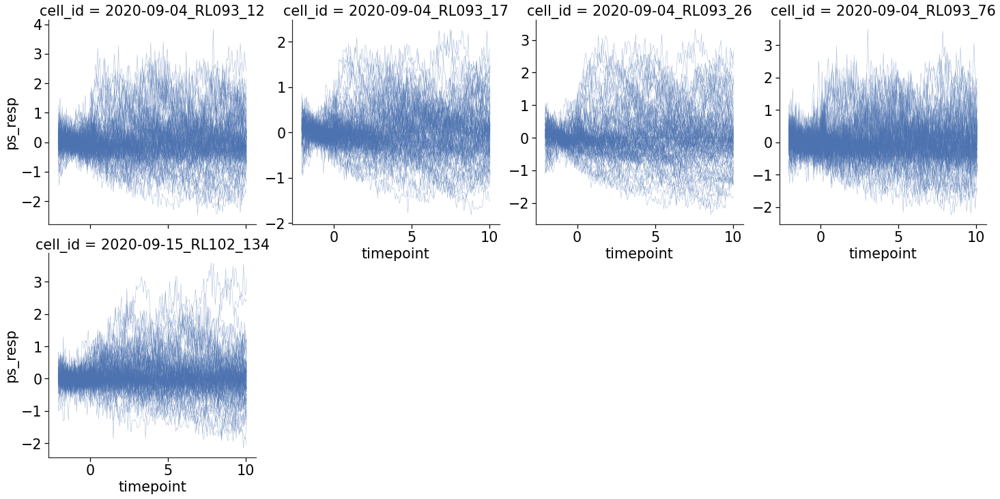

In [18]:
cell_trial_single_timepoint_df = pd.read_pickle(cell_trial_single_timepoint_df_path)
cell_df = pd.read_pickle(cell_df_path)

trials = ['pr', 'ps']
targets = ['pr', 'ps']
colors = ['C0', 'C1']

for color, trial, target in zip(colors, trials, targets):
    
    cell_ids = cell_df.query('(prob_response_' + trial + ' > (prob_response_spont + 0.2))' + 
                             '& ~' + target + '_target & s2_cell').index

    row_filter = cell_trial_single_timepoint_df['cell_id'].isin(cell_ids)
    filtered_df = cell_trial_single_timepoint_df[row_filter]
    
    g = sns.relplot(kind='line', x='timepoint', y=trial+'_resp', units='trial_num', lw=0.5, 
                    alpha=0.5, data=filtered_df, ci=None, estimator=None, col='cell_id', col_wrap=4, 
                    facet_kws={'sharey' : False})
    
    for ax in g.axes:
        ax.hlines(0, -2, 10, linestyles='dotted', zorder=0, alpha=0.5, color='k');

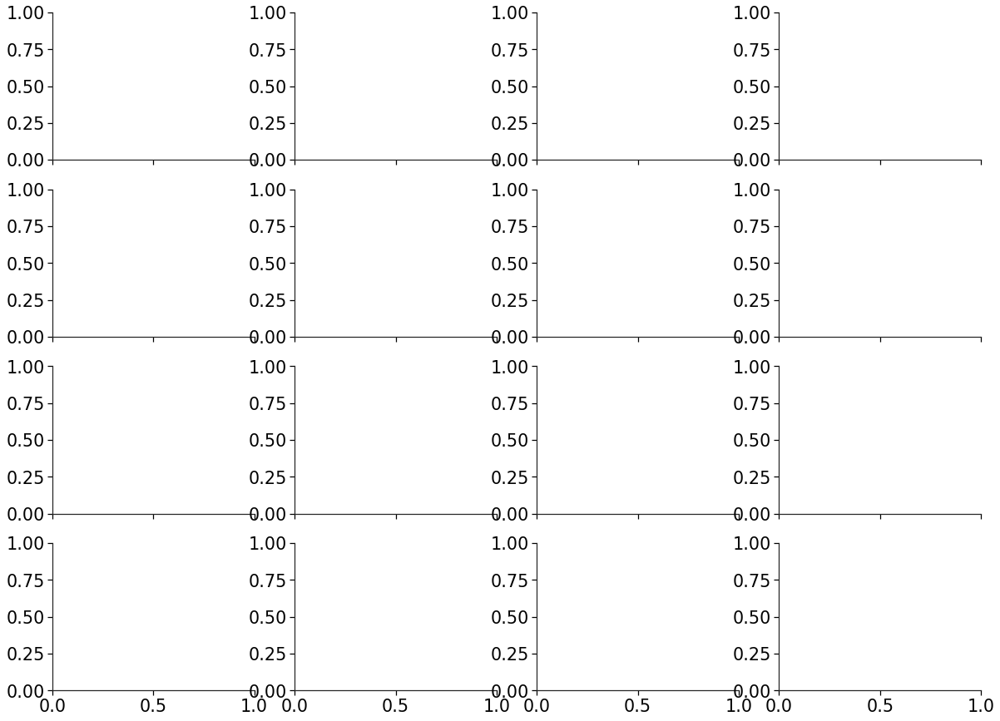

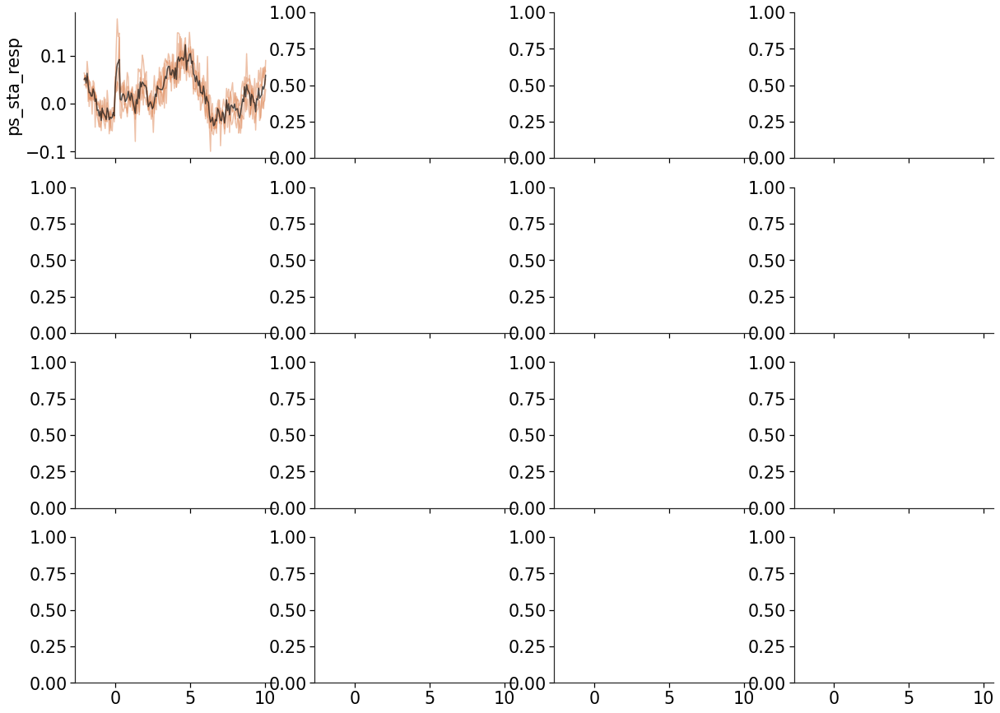

In [19]:
cell_df = pd.read_pickle(cell_df_path)
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)

trials = ['pr', 'ps']
targets = ['pr', 'ps']
colors = ['C0', 'C1']

for color, trial, target in zip(colors, trials, targets):
    
    cell_ids = cell_df.query('(prob_response_' + trial + ' > (prob_response_spont + 0.2))' + 
                             '& ~' + target + '_target & s2_cell').index

    row_filter = cell_mean_timepoint_df['cell_id'].isin(cell_ids)
    filtered_df = cell_mean_timepoint_df[row_filter]

    session_ids = cell_trial_df['session_id'].unique()   

    fig, axes = plt.subplots(nrows=4, ncols=4, sharex=True, figsize=(20,15))
    
    for ax_i, ax in enumerate(axes.flatten()):
        
        try:
            session_df = filtered_df[filtered_df['session_id']==session_ids[ax_i]]

            for group in session_df.groupby('cell_id'):
                sns.lineplot(x='timepoint', y=trial+'_sta_resp', data=group[1], ax=ax, label=trial, 
                             color=color, alpha=0.5, legend=False)
            sns.lineplot(x='timepoint', y=trial+'_sta_resp', data=session_df, ci=None, color='k', 
                         alpha=0.75, ax=ax, label=trial, legend=False)

            col.set_title(session_ids[ax_i])
            col.hlines(0, -2, 10, linestyles='dotted', zorder=0, alpha=0.5, color='k');
            
        except:
            break

# For responding cells, what is their probability of response?

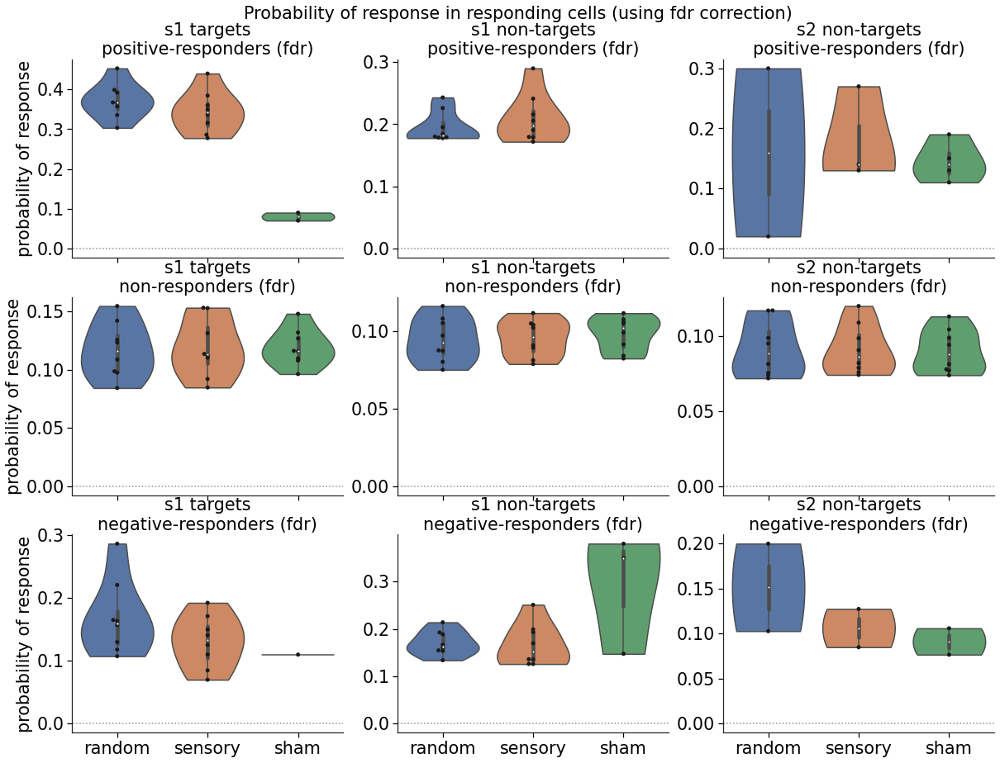

In [20]:
cell_df = pd.read_pickle(cell_df_path)

# list of column names to be used to filter the dataframe
test_type = 'fdr'
if test_type == 'fdr':
    stat_test = ['sta_sig_pr', 'sta_sig_ps', 'sta_sig_spont']
if test_type == 'nomulti':
    stat_test = ['sta_sig_nomulti_pr', 'sta_sig_nomulti_ps', 'sta_sig_nomulti_spont']
target_type = ['pr_target', 'ps_target', 'pr_target']
sign_bool = ['pr_resp_sign', 'ps_resp_sign', 'spont_resp_sign']
responses = ['prob_response_pr', 'prob_response_ps', 'prob_response_spont']
trial_type = ['random', 'sensory', 'sham']

s1_targets_pos_df = pd.DataFrame()
s1_nontargets_pos_df = pd.DataFrame()
s2_nontargets_pos_df = pd.DataFrame()

s1_targets_non_df = pd.DataFrame()
s1_nontargets_non_df = pd.DataFrame()
s2_nontargets_non_df = pd.DataFrame()

s1_targets_neg_df = pd.DataFrame()
s1_nontargets_neg_df = pd.DataFrame()
s2_nontargets_neg_df = pd.DataFrame()
    
for stim_id, trial in enumerate(trial_type):
    
    # define column names
    response = responses[stim_id]
    test = stat_test[stim_id]
    target = target_type[stim_id]
    sign = sign_bool[stim_id]

    # filter dataframes using variables above
    s1_targets_pos = cell_df[cell_df[test] & cell_df[target] & cell_df['s1_cell'] & 
                             cell_df[sign]].groupby('session_id').mean()
    s1_targets_pos_df = pd.concat([s1_targets_pos_df, pd.DataFrame({trial : s1_targets_pos[response]})])
    
    s1_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & 
                                cell_df[sign]].groupby('session_id').mean()
    s1_nontargets_pos_df = pd.concat([s1_nontargets_pos_df, pd.DataFrame({trial : s1_nontargets_pos[response]})])
    
    s2_nontargets_pos = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & 
                                cell_df[sign]].groupby('session_id').mean()
    s2_nontargets_pos_df = pd.concat([s2_nontargets_pos_df, pd.DataFrame({trial : s2_nontargets_pos[response]})])

    s1_targets_non = cell_df[~cell_df[test] & cell_df[target] & cell_df['s1_cell']].groupby('session_id').mean()
    s1_targets_non_df = pd.concat([s1_targets_non_df, pd.DataFrame({trial : s1_targets_non[response]})])
    
    s1_nontargets_non = cell_df[~cell_df[test] & ~cell_df[target] & cell_df['s1_cell']].groupby('session_id').mean()
    s1_nontargets_non_df = pd.concat([s1_nontargets_non_df, pd.DataFrame({trial : s1_nontargets_non[response]})])
    
    s2_nontargets_non = cell_df[~cell_df[test] & ~cell_df[target] & cell_df['s2_cell']].groupby('session_id').mean()
    s2_nontargets_non_df = pd.concat([s2_nontargets_non_df, pd.DataFrame({trial : s2_nontargets_non[response]})])

    s1_targets_neg = cell_df[cell_df[test] & cell_df[target] & cell_df['s1_cell'] & 
                             ~cell_df[sign]].groupby('session_id').mean()
    s1_targets_neg_df = pd.concat([s1_targets_neg_df, pd.DataFrame({trial : s1_targets_neg[response]})])
    
    s1_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s1_cell'] & 
                                ~cell_df[sign]].groupby('session_id').mean()
    s1_nontargets_neg_df = pd.concat([s1_nontargets_neg_df, pd.DataFrame({trial : s1_nontargets_neg[response]})])
    
    s2_nontargets_neg = cell_df[cell_df[test] & ~cell_df[target] & cell_df['s2_cell'] & 
                                ~cell_df[sign]].groupby('session_id').mean()
    s2_nontargets_neg_df = pd.concat([s2_nontargets_neg_df, pd.DataFrame({trial : s2_nontargets_neg[response]})])
    
# create and populate the plots using filtered data
fig, axes = plt.subplots(nrows=3, ncols=3, sharex=True, figsize=(20,15))

data_array = [[s1_targets_pos_df, s1_nontargets_pos_df, s2_nontargets_pos_df],
              [s1_targets_non_df, s1_nontargets_non_df, s2_nontargets_non_df],
              [s1_targets_neg_df, s1_nontargets_neg_df, s2_nontargets_neg_df]
             ]

row_titles = ['positive-responders (' + test_type + ')', 
              'non-responders (' + test_type + ')',
              'negative-responders (' + test_type + ')'
             ]
col_titles = ['s1 targets', 's1 non-targets', 's2 non-targets']

for row_i, row in enumerate(axes):
    for col_i, col in enumerate(row):
        ax=axes[row_i,col_i]
        sns.swarmplot(data=data_array[row_i][col_i], color='k', ax=ax, edgecolor='k')
        sns.violinplot(data=data_array[row_i][col_i], ax=ax, cut=0, scale='width')
        
        col.set_title(col_titles[col_i] + '\n' + row_titles[row_i])
        if col_i == 0: col.set_ylabel('probability of response')
        col.hlines(0, -3, 11, linestyles='dotted', zorder=4, alpha=0.5, color='k');

plt.suptitle('Probability of response in responding cells (using ' + test_type + ' correction)', 
             y=0.94, fontsize='xx-large');
    
# save the figure
save_path = os.path.join(qnap_path, session_type + '_ProbResponse_' + 
                         test_type + '_boxswarmplot_row_ResponseType_col_TargetID_splitby_TrialType')
# ia.savePlot(save_path)

# Whisker response vs. photostimulation response

slope 0.004760932209095493 r_value 0.02825433985751213 p_value 0.24484605176665916


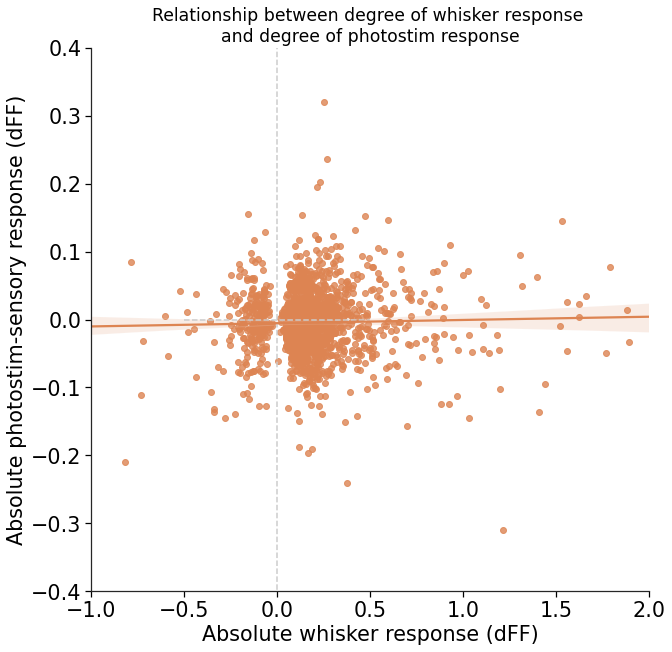

In [12]:
# Scatterplot
# S2 cells only
# Whisker sta resp
# Photostim sta resp

cell_df = pd.read_pickle(cell_df_path)

absolute = False

s2_df = cell_df.query('s2_cell & sta_sig_whisker')
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10,10))
if absolute:
    sns.regplot(y=np.absolute(s2_df['ps_sta_amp_resp']), x=np.absolute(s2_df['whisker_sta_amp_resp']), color='C1')
else:
    sns.regplot(y=s2_df['ps_sta_amp_resp'], x=s2_df['whisker_sta_amp_resp'], color='C1')

plt.hlines(0, -0.5, 0.5, linestyle='--', color='0.8')
plt.vlines(0, -2, 2.5, linestyle='--', color='0.8')
plt.axis([-1, 2, -0.4, 0.4]);
plt.xlabel('Absolute whisker response (dFF)')
plt.ylabel('Absolute photostim-sensory response (dFF)')
plt.title('Relationship between degree of whisker response \nand degree of photostim response', fontsize='x-large')

if absolute:
    slope, _, r_value, p_value, _ = stats.linregress(x=np.absolute(s2_df['whisker_sta_amp_resp']), 
                                                 y=np.absolute(s2_df['ps_sta_amp_resp']))
else:
    slope, _, r_value, p_value, _ = stats.linregress(x=s2_df['whisker_sta_amp_resp'], 
                                                 y=s2_df['ps_sta_amp_resp'])
print('slope', slope,
      'r_value', r_value,
      'p_value', p_value
     )

# Calculating influence of photostim for each cell (Chettih + Harvey style)

1. Doing photostim response probability minus spont response probability is convoluted behind the calculation of responsivity on single trials, which is if the 500 ms average of post-stim response was >1 SD of the baseline, why not just use the raw dFF values to calculate influence?
2. I was going to do photostim average response minus spont average response for each cell as an 'influence' value
3. Chettih and Harvey do single trial photostim minus average of all spont trials, then normalise the difference by the standard deviation of all differences for that cell
    - I think this accounts for the reliability of the influence for a single cell, i.e. cell with high standard deviation of differences will be penalised (lower influence) over one with small standard deviation
    - Does it matter if the influence is reliable?
    - Potentially normalise by the standard deviation of the baseline period to account for poor estimation of spiking activity, rather than the many bouts of delta Activity

## Shuffle cells to control for random influence

In [50]:
# Shuffle the average spontaneous response 100 times
# plot mean count at each influence
# plot min value at each influence
# plot max count at each influence

cell_id_trial_df = cell_trial_df['cell_id'].reset_index(drop=True).to_numpy()
cell_id_cell_df = cell_df.reset_index(drop=False)['cell_id'].to_numpy()

sorted_ids = np.argsort(cell_id_cell_df)
match_indices = np.searchsorted(cell_id_cell_df[sorted_ids], cell_id_trial_df)
indices = sorted_ids[match_indices]

shuffle_p_df = pd.DataFrame()

for i in range(0,100):
    
    print('shuffle progress:', i, 'of 99   ', end='\r')
    cell_df = pd.read_pickle(cell_df_path)

    a = cell_df['spont_sta_amp_resp']
    a = a.sample(frac=1)
    
    avg_spont_response = a.iloc[indices].values

    trials = ['pr', 'ps']

    for trial in ['pr','ps']:

        cell_trial_df['avg_spont_resp'] = avg_spont_response
        cell_trial_df[trial + '_influence'] = cell_trial_df[trial + '_amp_resp'] - cell_trial_df['avg_spont_resp']

        cell_trial_df[trial + '_influence_std'] = np.repeat(cell_trial_df.groupby('cell_id').std()[trial + '_influence'], 100).to_numpy()
        cell_trial_df[trial + '_norm_influence'] = cell_trial_df[trial + '_influence']/cell_trial_df[trial + '_influence_std']

        shuffle_p_df[trial + '_avg_norm_influence_' + str(i)] = cell_trial_df.groupby('cell_id').mean()[trial + '_norm_influence']

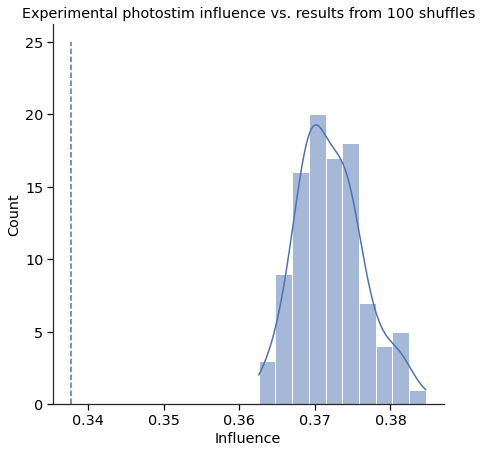

In [51]:
influence_df = np.absolute(shuffle_p_df)
s2_ids = np.where(~cell_df['pr_target'] & cell_df['s2_cell'])[0]

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(7,7))
sns.histplot(influence_df.iloc[s2_ids,1::2].mean(axis=0), kde=True, ax=axes)

non_target_df = cell_df.query('~pr_target & s2_cell')
influence = non_target_df['pr_avg_norm_influence']
plt.vlines(np.nanmean(np.absolute(influence)), ymin=0, ymax=25, linestyle='--');
plt.xlabel('Influence');
plt.title('Experimental photostim influence vs. results from 100 shuffles');

In [ ]:
cell_trial_df = pd.read_pickle(cell_trial_df_path)
cell_df = pd.read_pickle(cell_df_path)

shuffle_df = pd.DataFrame()

for df_i in range(0,100):
    
    crop_df = cell_trial_df.iloc[:, 4:].reset_index(drop=True)
    crop_df = crop_df.sample(frac=1, axis=0)
    
    cell_trial_df['spont_amp_resp'] = crop_df['spont_amp_resp'].values
    
    leftout_influence = np.full((100,len(cell_df)), np.nan)

    for i, trial in enumerate(np.arange(1, 101)):
        trial_leftout = cell_trial_df.query('trial_num == ' + str(trial))
        remaining_trials = cell_trial_df.query('trial_num != ' + str(trial))

        remaining_mean_resp = remaining_trials.groupby('cell_id')['spont_amp_resp'].mean().to_numpy()
        leftout_influence[i,:] = trial_leftout['spont_amp_resp'].to_numpy() - remaining_mean_resp

        print('shuffle progress:', df_i, 'of 99   ', 'trial', i, '     ', end='\r')
        
    cell_trial_df['spont_influence'] = np.swapaxes(leftout_influence, 0, 1).flatten()

    cell_trial_df['spont_influence_std'] = np.repeat(cell_trial_df.groupby('cell_id').std()['spont_influence'], 100).to_numpy()
    cell_trial_df['spont_norm_influence'] = cell_trial_df['spont_influence']/cell_trial_df['spont_influence_std']

    shuffle_df['spont_avg_norm_influence_' + str(df_i)] = cell_trial_df.groupby('cell_id').mean()['spont_norm_influence']

In [ ]:
influence_df = np.absolute(shuffle_df)
s2_ids = np.where(~cell_df['pr_target'] & cell_df['s2_cell'])[0]

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(7,7))
sns.histplot(influence_df.iloc[s2_ids,1::2].mean(axis=0), kde=True, ax=axes)

non_target_df = cell_df.query('~pr_target & s2_cell')
influence = non_target_df['spont_avg_norm_influence']
plt.vlines(np.nanmean(np.absolute(influence)), ymin=0, ymax=15, linestyle='--');
plt.xlabel('Influence');
plt.title('Experimental spont influence vs. results from 100 shuffles');

## Normalise by standard deviation of all trial ΔActivity

In [4]:
cell_df = pd.read_pickle(cell_df_path)
cell_trial_df = pd.read_pickle(cell_trial_df_path)

trials = ['pr', 'ps']

for trial in ['pr','ps']:
    cell_trial_df[trial + '_norm_influence'] = cell_trial_df[trial + '_influence']/cell_trial_df[trial + 
                                                                                                 '_influence_std']
    cell_df[trial + '_avg_norm_influence'] = cell_trial_df.groupby('cell_id').mean()[trial + '_norm_influence']

cell_trial_df['spont_norm_influence'] = cell_trial_df['spont_influence']/cell_trial_df['spont_influence_std']
cell_df['spont_avg_norm_influence'] = cell_trial_df.groupby('cell_id').mean()['spont_norm_influence']

cell_df.to_pickle(cell_df_path)
cell_trial_df.to_pickle(cell_trial_df_path)

## Normalise by mean spont activity

In [22]:
cell_df = pd.read_pickle(cell_df_path)
cell_trial_df = pd.read_pickle(cell_trial_df_path)

trials = ['pr', 'ps', 'spont']

for trial in trials:
    
    cell_trial_df[trial + '_norm_influence'] = cell_trial_df[trial + '_influence']/cell_trial_df['avg_spont_resp']
    cell_df[trial + '_avg_norm_influence'] = cell_trial_df.groupby('cell_id').mean()[trial + '_norm_influence']
    
cell_df.to_pickle(cell_df_path)
cell_trial_df.to_pickle(cell_trial_df_path)

## Normalise each ΔActivity by standard deviation of all spont dFF values at baseline timepoints for that cell

In [ ]:
cell_df = pd.read_pickle(cell_df_path)
cell_trial_single_timepoint_df = pd.read_pickle(cell_trial_single_timepoint_df_path)

df_filter = cell_trial_single_timepoint_df['timepoint']<0
filtered_df = cell_trial_single_timepoint_df[df_filter]
std_df = filtered_df.groupby('cell_id').std()

temp_df = pd.DataFrame({'std_spont_resp' : std_df['spont_resp'],
                        'std_pr_resp' : std_df['pr_resp'],
                        'std_ps_resp' : std_df['ps_resp']
                       })

cell_df = pd.concat([cell_df, temp_df], axis=1)
cell_df.index.name = 'cell_id'

cell_df.to_pickle(cell_df_path)

In [ ]:
cell_df = pd.read_pickle(cell_df_path)
cell_trial_df = pd.read_pickle(cell_trial_df_path)

trials = ['pr', 'ps', 'spont']

for trial in trials:
    
    baseline_std = np.repeat(cell_df['std_' + trial + '_resp'], 100).to_numpy()
    
    cell_trial_df[trial + '_norm_influence'] = cell_trial_df[trial + '_influence']/baseline_std
    cell_df[trial + '_avg_norm_influence'] = cell_trial_df.groupby('cell_id').mean()[trial + '_norm_influence']

cell_df.to_pickle(cell_df_path)
cell_trial_df.to_pickle(cell_trial_df_path)

4.7% p-value for pr
5.75% p-value for ps
7.6% p-value for spont


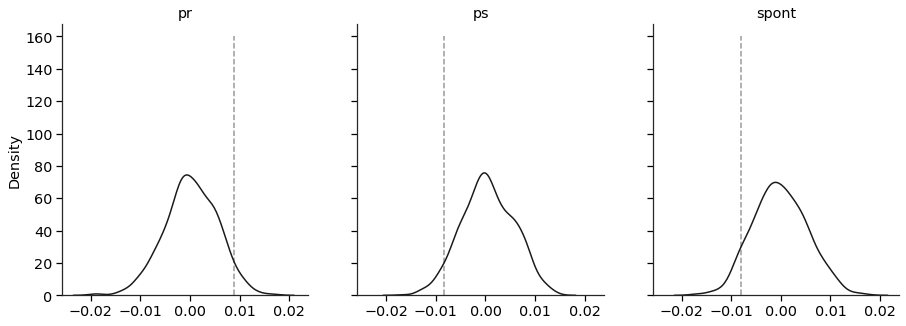

In [56]:
# 1000 shuffles of (non) whisker-responsive cells to see if diff between 
# whisker-responsive and non-whisker-responsive is greater than chance

diff = []

trials = ['pr', 'ps', 'spont']
trial_cats = ['random', 'sensory', 'sham']
targets = ['pr', 'ps', 'pr']

fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(15,5))

for trial, target, trial_cat, ax in zip(trials, targets, trial_cats, axes):
    
    diff = []
    
    for i in range(1,1000):
    
        random_label = cell_df.sample(frac=1)['sta_sig_whisker'].values

        cell_df_rand = cell_df.copy(deep=True)
        cell_df_rand['sta_sig_whisker'] = random_label

        whisker_df = cell_df_rand.query('~' + target + '_target & s2_cell & sta_sig_whisker')
        non_whisker_df = cell_df_rand.query('~' + target + '_target & s2_cell & ~sta_sig_whisker')

        whisker_bias = whisker_df[trial + '_avg_norm_influence'].mean()
        non_whisker_bias = non_whisker_df[trial + '_avg_norm_influence'].mean()

        diff.append(non_whisker_bias-whisker_bias)
        
    sns.kdeplot(diff, ax=ax, color='k')
    ax.set_title(trial)
    
    whisker_df = cell_df.query('~' + target + '_target & s2_cell & sta_sig_whisker')
    non_whisker_df = cell_df.query('~' + target + '_target & s2_cell & ~sta_sig_whisker')
   
    whisker_bias = whisker_df[trial + '_avg_norm_influence'].mean()
    non_whisker_bias = non_whisker_df[trial + '_avg_norm_influence'].mean()
    
    real_diff = non_whisker_bias-whisker_bias
    
    ax.vlines(real_diff, 0, 160, color='0.6', linestyle='--')
    
    sign_real_diff = np.sign(real_diff)

    if sign_real_diff > 0:
        neg_real_diff = -(real_diff)
        num_occurences = np.count_nonzero(np.logical_or(diff<neg_real_diff, diff>real_diff))
    else:
        pos_real_diff = -(real_diff)
        num_occurences = np.count_nonzero(np.logical_or(diff<real_diff, diff>pos_real_diff))
        
    print(str(num_occurences/20) + '% p-value for ' + trial)

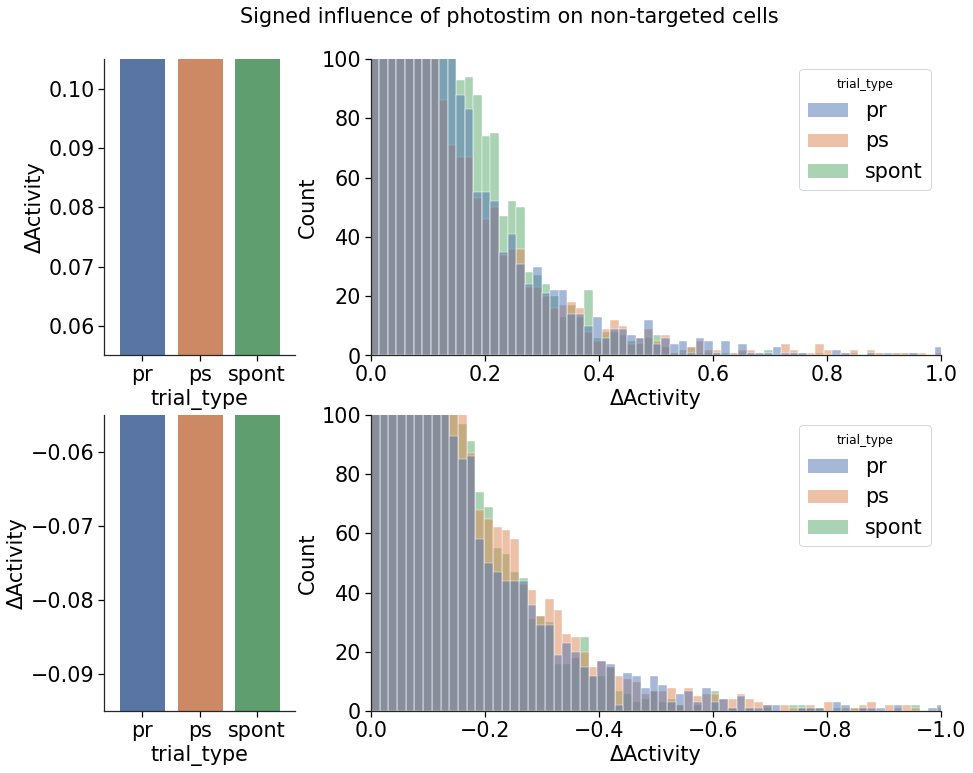

In [8]:
cell_df = pd.read_pickle(cell_df_path)

trials = ['pr', 'ps', 'spont']
targets = ['pr', 'ps', 'pr']

pos_inf_df = pd.DataFrame()
neg_inf_df = pd.DataFrame()

for trial, target in zip(trials, targets):
    
    non_target_df = cell_df.query('~' + target + '_target & s2_cell')
    inf_pos = non_target_df.query(trial + '_avg_norm_influence > 0')[trial + '_avg_norm_influence']
    inf_neg = non_target_df.query(trial + '_avg_norm_influence <= 0')[trial + '_avg_norm_influence']
    
    pos_inf_df = pd.concat([pos_inf_df, pd.DataFrame({'trial_type' : np.repeat(trial, len(inf_pos)),
                                                        'bias_pos' : inf_pos
                                                       })
                            ])
    
    neg_inf_df = pd.concat([neg_inf_df, pd.DataFrame({'trial_type' : np.repeat(trial, len(inf_neg)),
                                                        'bias_neg' : inf_neg
                                                       })
                            ])

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15,12), sharex=False, gridspec_kw={'width_ratios':[1,3]})

bias_signs = ['pos', 'neg']
dfs = [pos_inf_df, neg_inf_df]

for df, bias_sign, col in zip(dfs, bias_signs, axes):
    sns.barplot(x='trial_type', y='bias_' + bias_sign, data=df, ci=95, ax=col[0]);
    col[0].set_ylabel('ΔActivity')
    col[0].hlines(0, -0.5, 2.5, linestyles='dotted', zorder=4, alpha=0.5, color='k');
#     col[0].set_title(bias_sign)
    
#     sns.kdeplot(cumulative=True, hue=df['trial_type'], x=np.absolute(df['bias_' + bias_sign]), ax=col[1], cut=0)
    sns.histplot(cumulative=False, hue=df['trial_type'], x=df['bias_' + bias_sign], ax=col[1])
    col[1].set_ylim([0, 100])
    col[1].set_xlabel('ΔActivity')

axes[0,0].set_ylim([0.055, 0.105])
axes[1,0].set_ylim([-0.095, -0.055])
axes[0,1].set_xlim([0, 1])
axes[1,1].set_xlim([0, -1])

plt.suptitle('Signed influence of photostim on non-targeted cells', y=0.94, fontsize='xx-large');

## Plot spont and photostim trials for a few random non-target cells

In [ ]:
# cell_trial_single_timepoint_df = pd.read_pickle(cell_trial_single_timepoint_df_path)
# cell_df = pd.read_pickle(cell_df_path)

trial = 'pr'
target = 'pr'
control = 'spont'

high_influence_df = cell_df.query('(' + trial + '_avg_norm_influence > 0.1) & ~' + target + '_target & s2_cell')
cell_ids = high_influence_df.sample(n=3).index

chosen_cells = cell_trial_single_timepoint_df['cell_id'].isin(cell_ids)
chosen_cells_df = cell_trial_single_timepoint_df[chosen_cells]

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20,10))

for single_cell_df, ax in zip(chosen_cells_df.groupby('cell_id'), axes):
    
    x = np.tile(np.arange(0,182), 100) # frames rather than timepoints
    sns.lineplot(x=x, y=trial + '_resp', color='C0', ci=95, ax=ax, data=single_cell_df[1])
    sns.lineplot(x=x, y=control + '_resp', color='C2', ci=95, ax=ax, data=single_cell_df[1])
    ax.hlines(0, -20, 185, linestyles='dotted', zorder=4, alpha=0.5, color='k');
    
    ax.set_xlim([0, 60])
    ax.set_xlabel('Time (frames)')
    ax.set_ylabel('Response (dFF)')
    
    display(fig)
    clear_output(wait = True)
    
plt.suptitle('Response of three randomly-chosen cells on ' + control + ' vs. ' + trial + ' trials', 
             y=0.94, fontsize='xx-large');

In [ ]:
cell_mean_timepoint_df = pd.read_pickle(cell_mean_timepoint_df_path)

trial = 'pr'
target = 'pr'

high_influence_df = cell_df.query('(' + trial + '_avg_norm_influence > 0.25) & ~' + target + '_target & s2_cell')
cell_ids = high_influence_df.index

chosen_cells = cell_mean_timepoint_df['cell_id'].isin(cell_ids)
chosen_cells_df = cell_mean_timepoint_df[chosen_cells]

In [ ]:
mean_df = chosen_cells_df.groupby('frame').mean()

sns.lineplot(x=mean_df.index, y=mean_df.pr_sta_resp)

## Plot influence distribution binned by distance from nearest target

### Calculate nearest neighbour distance to nearest responsive target cell for each cell

In [ ]:
# goal: get a new column in cell_df which shows euclidean distance to nearest target (only for non-target, nan otherwise)
# get all target cell_med values for this trial type (i.e. pr)
# for each row of cell_df, if target for this trial type, add nan to list, if not a target,
# get cell_med for this non-target
# search for nearest neighbour of all targets and provide euclidean distance
# add euclid distance to cell_df

cell_df = pd.read_pickle(cell_df_path)
cell_df = cell_df.drop(columns=['pr_dist_to_targ', 'ps_dist_to_targ', 'spont_dist_to_targ'])

dist_to_targ = pd.DataFrame(index=cell_df.index, columns=['pr_dist_to_targ', 
                                                          'ps_dist_to_targ', 
                                                          'spont_dist_to_targ'
                                                         ])

targets = ['pr', 'ps']
trials = ['pr', 'ps', 'spont']

for target, trial in zip(targets, trials):
    for name, group in cell_df.groupby('session_id'):
        target_coords = group.query(target + '_target & sta_sig_' + trial)['cell_med'].to_numpy()
        target_coords = np.vstack(target_coords)
        
        target_query = group[target + '_target']
        cell_meds = group['cell_med']
        cell_ids = group.index

        for i, (target_bool, cell_med, cell_id) in enumerate(zip(target_query, cell_meds, cell_ids)):
            
            if target_bool == False:
                dists = spatial.distance.cdist([cell_med], target_coords)
                min_dist = np.amin(dists)
                
                dist_to_targ.loc[cell_id, trial + '_dist_to_targ'] = min_dist

cell_df = pd.concat([cell_df, dist_to_targ], axis=1) # maybe MERGE here instead?

cell_df.to_pickle(cell_df_path)

### Calculate distance to target group from each cell

In [ ]:
# goal: get a new column in cell_df which shows euclidean distance to centre of targets
# get all target cell_med values for this trial type (i.e. pr)
# for each row of cell_df, if target for this trial type, add nan to list, if not a target,
# get cell_med for this non-target
# add euclid distance to centre of targets to cell_df

cell_df = pd.read_pickle(cell_df_path)
cell_df = cell_df.drop(columns=['pr_dist_to_targ_group', 'ps_dist_to_targ_group', 'spont_dist_to_targ_group'])

dist_to_targ = pd.DataFrame(index=cell_df.index, columns=['pr_dist_to_targ_group', 
                                                          'ps_dist_to_targ_group', 
                                                          'spont_dist_to_targ_group'
                                                         ])

targets = ['pr', 'ps']
trials = ['pr', 'ps', 'spont']

for target, trial in zip(targets, trials):
    for name, group in cell_df.groupby('session_id'):
        target_coords = group.query(target + '_target & sta_sig_' + trial)['cell_med'].to_numpy()
        target_coords = np.vstack(target_coords)
        
        centre_x = np.mean([x for (x, y) in target_coords])
        centre_y = np.mean([y for (x, y) in target_coords])
        
        target_query = group[target + '_target']
        cell_meds = group['cell_med']
        cell_ids = group.index
        
        for i, (target_bool, cell_med, cell_id) in enumerate(zip(target_query, cell_meds, cell_ids)):
            
            if target_bool == False:
                dist = spatial.distance.cdist([cell_med], [[centre_x, centre_y]])                
                dist_to_targ.loc[cell_id, trial + '_dist_to_targ_group'] = dist[0][0]

cell_df = pd.concat([cell_df, dist_to_targ], axis=1) # maybe MERGE here instead?

cell_df.to_pickle(cell_df_path)

### Bin and mean data by dist_to_target, then plot

In [ ]:
trials = ['pr', 'ps', 'spont']
targets = ['pr', 'ps', 'pr']

fig, axes = plt.subplots(nrows=2, ncols=2, sharex=True, figsize=(20,12), gridspec_kw={'height_ratios' : [2,1]})

for trial, target in zip(trials, targets):
    df = cell_df.query('~' + target + '_target & s2_cell')
    dist = df[target + '_dist_to_targ'].values.astype('float32')
    influence = np.absolute(df[trial + '_avg_norm_influence'].values.astype('float32'))
    bias = df[trial + '_avg_norm_influence'].values.astype('float32')
    
    mean_dist, bin_edges, bin_nums = stats.binned_statistic(dist, dist, statistic=np.nanmean, bins=15, range=(0,750))
    bin_nums[np.where(bin_nums==16)[0]] = 15
    
    count, hist_bins = np.histogram(dist, bin_edges)
#     print(np.array(['bin {0}: {1} cells, {2:.0f} pixels mean dist'.format(bin_num, n_cells, mean_d) \
#                 for bin_num, n_cells, mean_d in zip(range(0,16), count, mean_dist)]), '\n')

    temp_df = pd.DataFrame({'bin_number' : bin_nums,
                            'mean_dist' : mean_dist[bin_nums-1],
                            'influence' : influence,
                            'bias' : bias
                           })
        
#     sns.lineplot(y=mean_inf, x=mean_dist)
    sns.lineplot(x='mean_dist', y='influence', ci=95, data=temp_df, ax=axes[0,0])
    sns.lineplot(x='mean_dist', y='bias', ci=95, data=temp_df, ax=axes[0,1])
    sns.histplot(x='mean_dist', data=temp_df, ax=axes[1,0])
    sns.histplot(x='mean_dist', data=temp_df, ax=axes[1,1])

axes[0,0].set_ylabel('Influence magnitude (|ΔActivity|)')
axes[0,0].set_title('Influence magnitude vs. distance\n to nearest responsive target', fontsize='x-large');
axes[0,0].set_ylim([0.04, 0.12]);
# axes[0,0].set_ylim([0.04, 0.12]);
axes[0,0].set_xlim([0, 750])

axes[0,1].set_ylabel('Influence bias (ΔActivity)')
axes[0,1].set_title('Influence bias vs. distance\n to nearest responsive target', fontsize='x-large');
axes[0,1].hlines(0, 0, 750, linestyles='dotted', zorder=4, alpha=0.5, color='k');
axes[0,1].set_ylim([-0.05, 0.04]);
# axes[0,1].set_ylim([-0.02, 0.03]);
axes[0,1].set_xlim([0, 750]);

axes[1,0].set_xlabel('Distance to nearest responsive target (pixels)');
axes[1,1].set_xlabel('Distance to nearest responsive target (pixels)');

In [ ]:
trials = ['pr', 'ps', 'spont']
targets = ['pr', 'ps', 'pr']

fig, axes = plt.subplots(nrows=2, ncols=2, sharex=True, figsize=(20,12), gridspec_kw={'height_ratios' : [2,1]})

for trial, target in zip(trials, targets):
    df = cell_df.query('~' + target + '_target & s2_cell')
    dist = df[target + '_dist_to_targ_group'].values.astype('float32')
    influence = np.absolute(df[trial + '_avg_norm_influence'].values.astype('float32'))
    bias = df[trial + '_avg_norm_influence'].values.astype('float32')
    
    mean_dist, bin_edges, bin_nums = stats.binned_statistic(dist, dist, statistic=np.nanmean, bins=15, range=(200,900))
    bin_nums[np.where(bin_nums==16)[0]] = 15
    
    count, hist_bins = np.histogram(dist, bin_edges)
#     print(np.array(['bin {0}: {1} cells, {2:.0f} pixels mean dist'.format(bin_num, n_cells, mean_d) \
#                 for bin_num, n_cells, mean_d in zip(range(0,16), count, mean_dist)]), '\n')

    temp_df = pd.DataFrame({'bin_number' : bin_nums,
                            'mean_dist' : mean_dist[bin_nums-1],
                            'influence' : influence,
                            'bias' : bias
                           })
        
#     sns.lineplot(y=mean_inf, x=mean_dist)
    sns.lineplot(x='mean_dist', y='influence', ci=95, data=temp_df, ax=axes[0,0])
    sns.lineplot(x='mean_dist', y='bias', ci=95, data=temp_df, ax=axes[0,1])
    sns.histplot(x='mean_dist', data=temp_df, ax=axes[1,0])
    sns.histplot(x='mean_dist', data=temp_df, ax=axes[1,1])

axes[0,0].set_ylabel('Influence magnitude (|ΔActivity|)')
axes[0,0].set_title('Influence magnitude vs. distance\n to target group', fontsize='x-large');
axes[0,0].set_ylim([0.04, 0.12]);
# axes[0,0].set_ylim([0.04, 0.12]);
axes[0,0].set_xlim([200, 900])

axes[0,1].set_ylabel('Influence bias (ΔActivity)')
axes[0,1].set_title('Influence bias vs. distance\n to target group', fontsize='x-large');
axes[0,1].hlines(0, 0, 900, linestyles='dotted', zorder=4, alpha=0.5, color='k');
axes[0,1].set_ylim([-0.04, 0.04]);
# axes[0,1].set_ylim([-0.02, 0.03]);
axes[0,1].set_xlim([200, 900]);

axes[1,0].set_xlabel('Distance to target group (pixels)');
axes[1,1].set_xlabel('Distance to target group (pixels)');

In [ ]:
trials = ['pr', 'ps', 'spont']
targets = ['pr', 'ps', 'pr']
colors = ['C0', 'C1', 'C2']

fig, axes = plt.subplots(nrows=2, ncols=3, sharex=True, figsize=(18,10), gridspec_kw={'height_ratios' : [2,1]})

for trial, target, col, color in zip(trials, targets, axes.swapaxes(0,1), colors):
    df = cell_df.query('~' + target + '_target & s2_cell')
    dist = df[target + '_dist_to_targ'].values.astype('float32')
    influence = df[trial + '_avg_norm_influence'].values.astype('float32')
    sign = df[trial + '_avg_norm_influence'] > 0
    
#     mean_inf, bin_edges, bin_nums = stats.binned_statistic(dist, influence, statistic=np.nanmean, bins=15)
    mean_dist, bin_edges, bin_nums = stats.binned_statistic(dist, dist, statistic=np.nanmean, bins=15, range=(0,750))
    bin_nums[np.where(bin_nums==16)[0]] = 15
    
    count, hist_bins = np.histogram(dist, bin_edges)
#     print(np.array(['bin {0}: {1} cells, {2:.0f} pixels mean dist'.format(bin_num, n_cells, mean_d) \
#                 for bin_num, n_cells, mean_d in zip(range(0,16), count, mean_dist)]), '\n')

    temp_df = pd.DataFrame({'bin_number' : bin_nums,
                            'mean_dist' : mean_dist[bin_nums-1],
                            'influence' : influence,
                            'sign' : sign
                           })
        
#     sns.lineplot(y=mean_inf, x=mean_dist)
    sns.lineplot(x='mean_dist', y=np.absolute(temp_df['influence']), style='sign', style_order=[True, False], 
                 color=color, ci=95, data=temp_df, ax=col[0])
    sns.histplot(x='mean_dist', hue='sign', hue_order=[True, False], data=temp_df, ax=col[1])
    col[0].set_title(trial)

for row_i, row in enumerate(axes):
    for col_i, col in enumerate(row):
        if col_i==0 and row_i==0: col.set_ylabel('Signed influence (ΔActivity)')
        if row_i==0: col.set_ylim([0.04, 0.12])
        
        col.set_xlim([0, 750])
        col.legend(['Positive', 'Negative'])

        if row_i==1: col.set_xlabel('Distance to nearest responsive target (pixels)');

plt.suptitle('Influence vs. distance to nearest responsive target', fontsize='x-large');

In [ ]:
trials = ['pr', 'ps', 'spont']
targets = ['pr', 'ps', 'pr']

fig, axes = plt.subplots(nrows=2, ncols=2, sharex=True, figsize=(20,12), gridspec_kw={'height_ratios' : [2,1]})

for trial, target in zip(trials, targets):
    df = cell_df.query('~' + target + '_target & s2_cell')

#     sns.lineplot(y=mean_inf, x=mean_dist)
    sns.scatterplot(x=target + '_dist_to_targ', y=np.absolute(df[trial + '_avg_norm_influence']), ci=95, 
                    data=df, ax=axes[0,0])
    sns.scatterplot(x=target + '_dist_to_targ', y=trial + '_avg_norm_influence', ci=95, data=df, ax=axes[0,1])
    sns.histplot(x=target + '_dist_to_targ', data=df, ax=axes[1,0])
    sns.histplot(x=target + '_dist_to_targ', data=df, ax=axes[1,1])

axes[0,0].set_ylabel('Influence magnitude (|ΔActivity|)')
axes[0,0].set_title('Influence magnitude vs. distance\n to nearest responsive target', fontsize='x-large');
axes[0,0].set_ylim([0, 2.5]);
axes[0,0].set_xlim([0, 750])

axes[0,1].set_ylabel('Influence bias (ΔActivity)')
axes[0,1].set_title('Influence bias vs. distance\n to nearest responsive target', fontsize='x-large');
axes[0,1].hlines(0, 0, 750, linestyles='dotted', zorder=4, alpha=0.5, color='k');
axes[0,1].set_ylim([-2.5, 2.5]);
axes[0,1].set_xlim([0, 750]);

axes[1,0].set_xlabel('Distance to nearest responsive target (pixels)');
axes[1,1].set_xlabel('Distance to nearest responsive target (pixels)');

### Bin and mean data by whisker response, then plot

In [ ]:
trials = ['pr', 'ps', 'spont']
targets = ['pr', 'ps', 'pr']

fig, axes = plt.subplots(nrows=2, ncols=2, sharex=True, figsize=(20,12), gridspec_kw={'height_ratios' : [2,1]})

for trial, target in zip(trials, targets):
    df = cell_df.query('~' + target + '_target & s2_cell')
    resp = df['whisker_sta_amp_resp'].values.astype('float32')
    influence = np.absolute(df[trial + '_avg_norm_influence'].values.astype('float32'))
    bias = df[trial + '_avg_norm_influence'].values.astype('float32')
    
    bins = 20
#     mean_inf, bin_edges, bin_nums = stats.binned_statistic(dist, influence, statistic=np.nanmean, bins=15)
    mean_resp, bin_edges, bin_nums = stats.binned_statistic(resp, resp, statistic=np.nanmean, 
                                                            bins=bins, range=(-0.25,0.5))
    bin_nums[np.where(bin_nums==bins+1)[0]] = bins
    
    count, hist_bins = np.histogram(resp, bin_edges)
#     print(np.array(['bin {0}: {1} cells, {2:.2f} dFF mean response'.format(bin_num, n_cells, mean_r) \
#                 for bin_num, n_cells, mean_r in zip(range(0,bins), count, mean_resp)]), '\n')

    temp_df = pd.DataFrame({'bin_number' : bin_nums,
                            'mean_resp'  : mean_resp[bin_nums-1],
                            'influence'  : influence,
                            'bias'       : bias
                           })
        
#     sns.lineplot(y=mean_inf, x=mean_dist)
    sns.lineplot(x='mean_resp', y='influence', ci=95, data=temp_df, ax=axes[0,0])
    sns.lineplot(x='mean_resp', y='bias', ci=95, data=temp_df, ax=axes[0,1])
    sns.histplot(x='mean_resp', data=temp_df, ax=axes[1,0])
    sns.histplot(x='mean_resp', data=temp_df, ax=axes[1,1])
    
axes[0,0].set_ylabel('Influence magnitude (|ΔActivity|)')
axes[0,0].set_title('Influence magnitude vs. response magnitude\n to whisker stimulation', fontsize='x-large');
# axes[0,0].set_ylim([0.1, 0.25]);
axes[0,0].set_ylim([0.04, 0.12]);
axes[0,0].set_xlim([-0.25, 0.5]);

axes[0,1].set_ylabel('Influence bias (ΔActivity)')
axes[0,1].set_title('Influence bias vs. response magnitude\n to whisker stimulation', fontsize='x-large');
axes[0,1].hlines(0, -1, 1, linestyles='dotted', zorder=4, alpha=0.5, color='k');
# axes[0,1].set_ylim([-0.1, 0.1]);
axes[0,1].set_ylim([-0.05, 0.05]);
axes[0,1].set_xlim([-0.25, 0.5]);

axes[1,0].set_xlabel('Mean response to whisker stimulation (dFF)');
axes[1,1].set_xlabel('Mean response to whisker stimulation (dFF)');

In [ ]:
trials = ['pr', 'ps', 'spont']
targets = ['pr', 'ps', 'pr']
colors = ['C0', 'C1', 'C2']

fig, axes = plt.subplots(nrows=2, ncols=3, sharex=True, figsize=(18,10), gridspec_kw={'height_ratios' : [2,1]})

for trial, target, col, color in zip(trials, targets, axes.swapaxes(0,1), colors):
    df = cell_df.query('~' + target + '_target & s2_cell')
    resp = df['whisker_sta_amp_resp'].values.astype('float32')
    influence = df[trial + '_avg_norm_influence'].values.astype('float32')
    sign = df[trial + '_avg_norm_influence'] > 0
    
    bins = 20
    
#     mean_inf, bin_edges, bin_nums = stats.binned_statistic(dist, influence, statistic=np.nanmean, bins=15)
    mean_resp, bin_edges, bin_nums = stats.binned_statistic(resp, resp, statistic=np.nanmean, 
                                                            bins=bins, range=(-0.25,0.5))
    bin_nums[np.where(bin_nums==bins+1)[0]] = bins
    
    count, hist_bins = np.histogram(resp, bin_edges)
#     print(np.array(['bin {0}: {1} cells, {2:.0f} pixels mean dist'.format(bin_num, n_cells, mean_d) \
#                 for bin_num, n_cells, mean_d in zip(range(0,16), count, mean_dist)]), '\n')

    temp_df = pd.DataFrame({'bin_number' : bin_nums,
                            'mean_resp' : mean_resp[bin_nums-1],
                            'influence' : influence,
                            'sign' : sign
                           })
        
#     sns.lineplot(y=mean_inf, x=mean_dist)
    sns.lineplot(x='mean_resp', y=np.absolute(temp_df['influence']), style='sign', style_order=[True, False], 
                 color=color, ci=95, data=temp_df, ax=col[0])
    sns.histplot(x='mean_resp', hue='sign', hue_order=[True, False], data=temp_df, ax=col[1])
    col[0].set_title(trial)

for row_i, row in enumerate(axes):
    for col_i, col in enumerate(row):
        if col_i==0 and row_i==0: col.set_ylabel('Signed influence (ΔActivity)')
#         if row_i==0: col.set_ylim([0.125, 0.25])
        
#         col.set_xlim([0, 750])
        col.legend(['Positive', 'Negative'])

        if row_i==1: col.set_xlabel('Mean response to whisker stimulation (dFF)');

plt.suptitle('Influence magnitude vs. response magnitude to whisker stimulation', y=0.94, fontsize='xx-large');

# Finding CTB intensity for each cell

In [ ]:
cell_df = pd.read_pickle(cell_df_path)

session_df = pd.read_pickle(session_df_path)

s2p_paths = session_df['s2p_path'].values
session_ids = session_df.index.values

CTB_vals = pd.Series()

for s2p_path, session_id in zip(s2p_paths, session_ids):
    
    tiff_folder = os.path.dirname(os.path.dirname(s2p_path))
    file_list = os.listdir(tiff_folder)
    
    for file in file_list:
        if 'CTB' in file:
            CTB_image = tf.imread(os.path.join(tiff_folder, file))
            
    session_cell_df = cell_df[cell_df['session_id'] == session_id]
    
    cell_x_list = session_cell_df['cell_x'].values
    cell_y_list = session_cell_df['cell_y'].values
    cell_id_list = session_cell_df.index.values
    
    CTB_intensity = []
    
    for cell_x, cell_y in zip(cell_x_list, cell_y_list):
        
        CTB_intensity.append(np.mean(CTB_image[cell_x, cell_y]))
    
    new_rows = pd.Series(data=CTB_intensity, index=cell_id_list)
    
    CTB_vals = CTB_vals.append(new_rows)
    
cell_df['ctb_intensity'] = CTB_vals

# Find CTB intensity of target cells

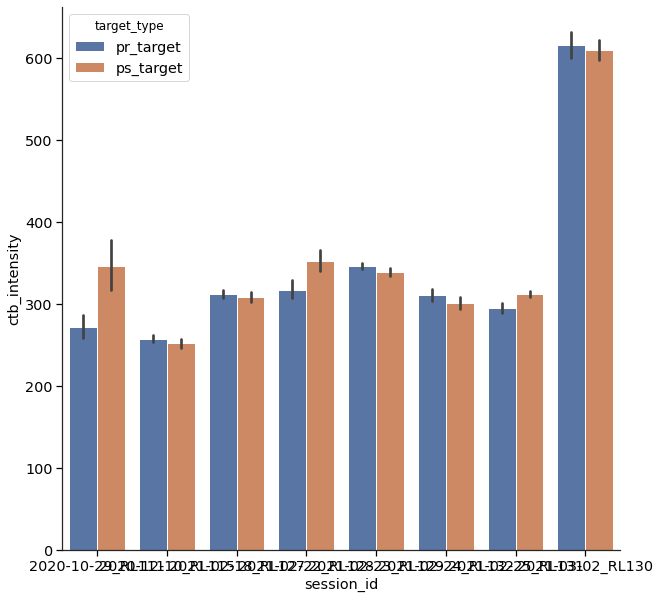

In [15]:
df = pd.DataFrame()

targets = ['pr_target', 'ps_target']

for target in targets:
    target_df = cell_df.query(target)
    
    temp_df = pd.DataFrame({'target_type' : np.repeat(target, len(target_df)),
                            'ctb_intensity' : target_df['ctb_intensity'],
                            'session_id' : target_df['session_id']
                           })
    
    df = pd.concat([df, temp_df])
    
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10,10))

sns.barplot(data=df, x='session_id', y='ctb_intensity', hue='target_type', ax=ax);

# Correlate CTB intensity with whisker response

In [52]:
cell_whisker_df = cell_df.dropna(subset=['whisker_sta_amp_resp'])
s1_cell_whisker_df = cell_whisker_df.query('s1_cell')

sns.lmplot(data=s1_cell_whisker_df, x='whisker_sta_amp_resp', y='ctb_intensity', hue='session_id', height=7, aspect=1.5);
plt.axis([-1, 1.5, -50, 1000]);

KeyError: "['ctb_intensity'] not in index"

# Variance in cell rates

In [2]:
def variance_cell_rates(flu, frames): 

    vars_ = []
    for t in range(flu.shape[1]):
        trial = flu[:, t, :]
        trial = trial[:, frames]
        vars_.append(np.var(np.mean(trial, axis=1)))

    return np.array(vars_)

In [14]:
stim_types = ['pr', 'ps', 'none']
pkl_files = ia.listdirFullpath(os.path.join(pkl_folder, session_type), string='.pkl')

df = pd.DataFrame()
index = []

for pkl in pkl_files:
    
    ses_obj = ia.loadPickle(pkl)
    
    exp_list = ia.makeExpList(ses_obj, stim_types)
    
    for exp_obj in exp_list:

        for i, stim in enumerate(exp_obj.stim_start_frames[0]):
            # get frame indices of entire trial from pre-stim start to post-stim end
            trial_frames = np.s_[stim - exp_obj.pre_frames : stim + exp_obj.post_frames]

            # use trial frames to extract this trial for every cell
            flu_trial = exp_obj.dfof[0][:, trial_frames]

            # only append trials of the correct length - will catch corrupt/incomplete data and not include
            if i == 0:
                trial_array = flu_trial
                flu_trial_shape = flu_trial.shape[0]
            else:
                if flu_trial.shape[0] == flu_trial_shape:
                    trial_array = np.dstack((trial_array, flu_trial))
                else:
                    print('**incomplete trial detected and not appended to trial_array**', end='\r')

        trial_array = trial_array.swapaxes(1,2)
        pre_frames = list(range(21,29))
        
        trial_std = np.std(trial_array, axis=(0,2))
        
        var_cell_rates = variance_cell_rates(trial_array[exp_obj.cell_s1[0]], pre_frames)
        vcr = stats.zscore(var_cell_rates)

        s2_cells = exp_obj.cell_s2[0]
        s2_sum_dff = exp_obj.all_amplitudes[0][s2_cells, :].sum(axis=0)

        target_sum_dff = exp_obj.all_amplitudes[0][exp_obj.targeted_cells, :].sum(axis=0)
        
        trial_type = np.repeat(exp_obj.stim_type, exp_obj.n_trials)

        temp_df = pd.DataFrame({'vcr' : vcr,
                                'std' : trial_std,
                                's2_sum_dff' : stats.zscore(s2_sum_dff),
                                'target_sum_dff' : target_sum_dff,
                                'session_id' : np.repeat(exp_obj.sheet_name, exp_obj.n_trials),
                                'trial_type' : trial_type
                               })
        df = pd.concat([df, temp_df])

Loading pickle: /home/rlees/mnt/qnap/pkl_files/sensory_nodetrend/2020-09-04_RL093.pkl
Loading pickle: /home/rlees/mnt/qnap/pkl_files/sensory_nodetrend/2020-09-08_RL099.pkl
Loading pickle: /home/rlees/mnt/qnap/pkl_files/sensory_nodetrend/2020-09-09_RL100.pkl
Loading pickle: /home/rlees/mnt/qnap/pkl_files/sensory_nodetrend/2020-09-14_RL101.pkl
Loading pickle: /home/rlees/mnt/qnap/pkl_files/sensory_nodetrend/2020-09-15_RL102.pkl
Loading pickle: /home/rlees/mnt/qnap/pkl_files/sensory_nodetrend/2020-09-16_RL103.pkl
Loading pickle: /home/rlees/mnt/qnap/pkl_files/sensory_nodetrend/2020-10-02_RL108.pkl
Loading pickle: /home/rlees/mnt/qnap/pkl_files/sensory_nodetrend/2020-10-12_RL109.pkl


In [ ]:
# std pre-stim lower for photostim vs. sham?
# no targets?
# pre-stim frames only
# std vs. time over trials
# vcr vs. time over trials

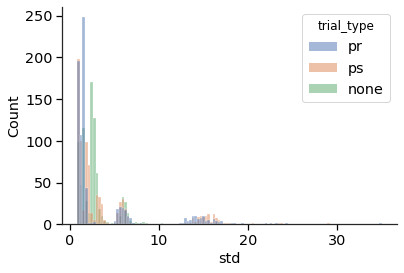

In [70]:
sns.histplot(data=vcr_df, x='std', hue='trial_type');

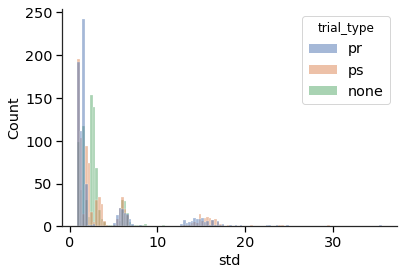

In [68]:
sns.histplot(data=df, x='std', hue='trial_type');

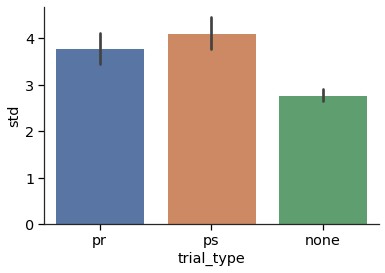

In [69]:
sns.barplot(data=df, x='trial_type', y='std');

In [64]:
vcr_df = df.copy(deep=True)

<AxesSubplot:ylabel='vcr'>

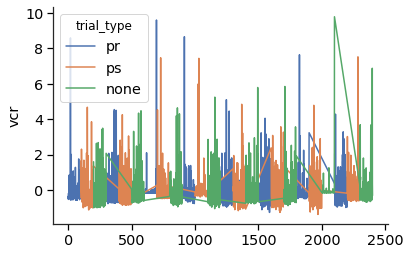

In [74]:
sns.lineplot(data=vcr_df, x=list(range(0,len(vcr_df))), y='vcr', hue='trial_type')

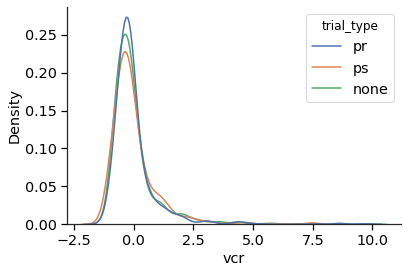

In [13]:
sns.kdeplot(data=df, x='vcr', hue='trial_type');

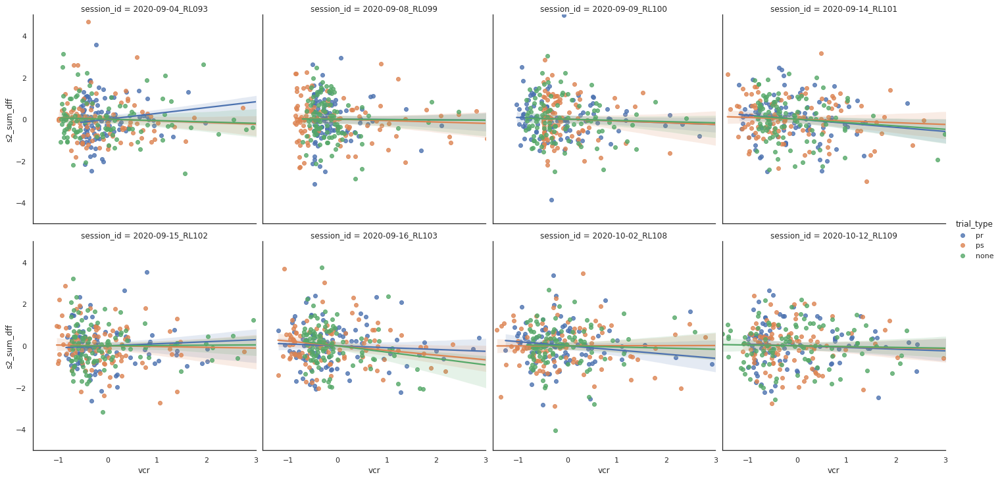

In [16]:
grid = sns.lmplot(data=df, x='vcr', y='s2_sum_dff', col='session_id', hue='trial_type', col_wrap=4)
grid.set(xlim=(None, 3), ylim=(-10, 5));

In [ ]:
for session_name, session_df in df.groupby('session_id'):
    slope, _, r_value, p_value, _  = stats.linregress(session_df.vcr, session_df.s2_sum_dff)
    if p_value<0.05: sig = '**'
    else: sig = ''
    print(f'Session: {session_name} \n slope: {slope} r^2: {r_value**2} p_value: {p_value}{sig} \n\n')

# Comparison of sham and photostim pre-stim data

- Get pre-stim activity from all cells, all trials
- Make dataframe with s1_cell, pre-stim mean, post-stim mean, cell_id, session_id, trial_id, trial_type
- Mean across cells (each trial, each animal)
- Plot pre/post scatter with different colour for each animal, new plot each trial type
- Do we need normalisation
- Tells us the relationship between the total mean pre-stimulus activity and mean post-stimulus activity in a single trial (essentially the mean activity in S1/S2 autocorrelated)
- Use sham trials to define pre-stimulus activity distribution, see what post-stim result is for each section of distribution
- If there is a clear relationship between pre and post-stim activity in sham, we should expect it in photostim
- On those trials in photostim when pre-stim activity was similar to sham cases, did the post-stim also look similar to sham, or was it more negative (implying inhibition dominates) - plot distributions first?

In [ ]:
# session_type = 'sensory_nodetrend'
session_type = 'sensory_long_prestim'
# df_name = session_type + '_cell_trial_df_long_shuffled'
df_name = session_type + '_cell_trial_df_long'
stim_types = ['pr', 'ps', 'none']
pkl_files = ia.listdirFullpath(os.path.join(pkl_folder, session_type), string='.pkl')

df = pd.DataFrame()
index = []

for pkl in pkl_files:
    
    ses_obj = ia.loadPickle(pkl)
    
    exp_list = ia.makeExpList(ses_obj, stim_types)
    
    for exp_obj in exp_list:
        
        n_trials = exp_obj.n_trials 
        
        session_id = list(np.repeat(exp_list[0].sheet_name, exp_list[0].n_units[0] * n_trials))
                
        cell_num = np.repeat(exp_list[0].cell_id[0], n_trials, axis=0)
        cell_num_str = np.array(cell_num, dtype='str')
        cell_id = [session + '_' + cell for session, cell in zip(session_id, cell_num_str)]

        trial_num = np.tile(np.arange(1, n_trials+1), len(exp_list[0].cell_id[0]))
        trial_num_str = np.array(trial_num, dtype='str')

        cell_trial_id = [session + '_' + cell + '_' + trial for session, cell, trial in zip(session_id, cell_num_str, trial_num_str)]
        
        trial_type = np.repeat(exp_obj.stim_type, exp_list[0].n_units[0] * n_trials)
        
        s2_cell = np.repeat(exp_list[0].cell_s2[0], n_trials, axis=0)
        target_cell = np.repeat(exp_obj.targeted_cells, n_trials, axis=0)
        
#         max_ssf = max(exp_obj.stim_start_frames[0])
#         min_ssf = min(exp_obj.stim_start_frames[0])

#         np.random.seed(0)
#         exp_obj.stim_start_frames[0] = np.random.randint(min_ssf, high=max_ssf, size=n_trials)
        
        trial_array = []
                
        for i, stim in enumerate(exp_obj.stim_start_frames[0]):
            # get frame indices of entire trial from pre-stim start to post-stim end
            trial_frames = np.s_[stim - exp_obj.pre_frames : stim + exp_obj.post_frames]

            # use trial frames to extract this trial for every cell
            flu_trial = exp_obj.dfof[0][:, trial_frames]
            flu_trial_len = exp_obj.pre_frames + exp_obj.post_frames
            
            # only append trials of the correct length - will catch corrupt/incomplete data and not include
            if flu_trial.shape[1] == flu_trial_len:
                if len(trial_array)==0:
                    trial_array = flu_trial
                else:
                    trial_array = np.dstack((trial_array, flu_trial))
            else:
                print('**incomplete trial detected and not appended to trial_array**', end='\r')

        trial_array = trial_array.swapaxes(1,2)
        pre_frames = list(range(0, exp_obj.pre_frames))
        post_frames = list(range(exp_obj.pre_frames+7, exp_obj.pre_frames+15))
        
        pre_array = np.mean(trial_array[:, :, pre_frames], axis=2)
        post_array = np.mean(trial_array[:, :, post_frames], axis=2)
    
        temp_df = pd.DataFrame({'session_id' : pd.Series(session_id, dtype='category'),
                                'cell_num' : pd.Series(cell_num, dtype='int16'),
                                'cell_id' : pd.Series(cell_id, dtype='category'),
                                'trial_num' : pd.Series(trial_num, dtype='int8'),
                                'trial_type' : pd.Series(trial_type, dtype='category'),
                                's2_cell' : s2_cell,
                                'target_cell' : target_cell,
                                'pre_stim' : pre_array.flatten(),
                                'post_stim' : post_array.flatten()
                                })

        df = pd.concat([df, temp_df])
        index.extend(cell_trial_id)

df.set_index(pd.Index(index, name='cell_trial_id'), inplace=True)

df['diff'] = df['post_stim'] - df['pre_stim']

# Pickle the object output to save it for analysis
pkl_path = os.path.join(pkl_folder, 'dataframes', df_name + '.pkl')
df.to_pickle(pkl_path)

In [27]:
session_type = 'sensory_long_prestim'
df_name = session_type + '_cell_trial_single_timepoint_df'
# df_name = session_type + '_cell_trial_single_timepoint_df_shuffled'
stim_types = ['pr', 'ps', 'none', 'w']
pkl_files = ia.listdirFullpath(os.path.join(pkl_folder, session_type), string='.pkl')

df = pd.DataFrame()

for pkl in pkl_files:
        
    ses_obj = ia.loadPickle(pkl)
    
    exp_list = ia.makeExpList(ses_obj, stim_types)

    session_id = list(np.repeat(exp_list[0].sheet_name, exp_list[0].n_units[0] * 100 * len(exp_list[0].time)))
    
    cell_num = np.repeat(exp_list[0].cell_id[0], 100 * len(exp_list[0].time), axis=0)
    cell_id = np.array(cell_num, dtype='str')
    cell_id = np.char.add(np.char.add(session_id, np.repeat('_', len(session_id))), cell_id)
    
    trial_num = np.tile(np.repeat(np.arange(1,101), len(exp_list[0].time)), len(exp_list[0].cell_id[0]))
    
    timepoint = np.tile(exp_list[0].time, exp_list[0].n_units[0] * 100)
    frame = np.tile(np.arange(len(exp_list[0].time)), exp_list[0].n_units[0] * 100)
    
    for exp_obj in exp_list:
        
#         max_ssf = max(exp_obj.stim_start_frames[0])
#         min_ssf = min(exp_obj.stim_start_frames[0])

#         np.random.seed(0)
#         exp_obj.stim_start_frames[0] = np.random.randint(min_ssf, high=max_ssf, size=100)
        
        trial_array = []
                
        for i, stim in enumerate(exp_obj.stim_start_frames[0]):
            # get frame indices of entire trial from pre-stim start to post-stim end
            trial_frames = np.s_[stim - exp_obj.pre_frames : stim + exp_obj.post_frames]

            # use trial frames to extract this trial for every cell
            flu_trial = exp_obj.dfof[0][:, trial_frames]
            flu_trial_len = exp_obj.pre_frames + exp_obj.post_frames
            
            # only append trials of the correct length - will catch corrupt/incomplete data and not include
            if flu_trial.shape[1] == flu_trial_len:
                if len(trial_array)==0:
                    trial_array = flu_trial
                else:
                    trial_array = np.dstack((trial_array, flu_trial))
            else:
                print('**incomplete trial detected and not appended to trial_array**', end='\r')
        
        all_trials = np.swapaxes(trial_array, 1, 2)
        
        if exp_obj.stim_type == 'pr':
            pr_resp = pd.Series(all_trials.flatten()).reindex(np.arange(0,len(trial_num)))
            
        if exp_obj.stim_type == 'ps':
            ps_resp = pd.Series(all_trials.flatten()).reindex(np.arange(0,len(trial_num)))
                    
        if exp_obj.stim_type == 'none':
            spont_resp = pd.Series(all_trials.flatten()).reindex(np.arange(0,len(trial_num)))

    temp_df = pd.DataFrame({'session_id' : pd.Series(session_id, dtype='category'),
                            'cell_num' : pd.Series(cell_num, dtype='int16'),
                            'cell_id' : pd.Series(cell_id, dtype='category'),
                            'trial_num' : pd.Series(trial_num, dtype='int8'),
                            'timepoint' : pd.Series(timepoint, dtype='float32'),
                            'pr_resp' : pr_resp,
                            'ps_resp' : ps_resp,
                            'spont_resp' : spont_resp
                            })
        
    df = pd.concat([df, temp_df])
    
df.reset_index(drop=True)

# Pickle the object output to save it for analysis
pkl_path = os.path.join(pkl_folder, 'dataframes', df_name + '.pkl')
df.to_pickle(pkl_path)

Loading pickle: /home/rlees/mnt/qnap/pkl_files/sensory_long_prestim/2020-09-04_RL093.pkl
Loading pickle: /home/rlees/mnt/qnap/pkl_files/sensory_long_prestim/2020-09-08_RL099.pkl
Loading pickle: /home/rlees/mnt/qnap/pkl_files/sensory_long_prestim/2020-09-09_RL100.pkl
Loading pickle: /home/rlees/mnt/qnap/pkl_files/sensory_long_prestim/2020-09-14_RL101.pkl
Loading pickle: /home/rlees/mnt/qnap/pkl_files/sensory_long_prestim/2020-09-15_RL102.pkl
Loading pickle: /home/rlees/mnt/qnap/pkl_files/sensory_long_prestim/2020-09-16_RL103.pkl
Loading pickle: /home/rlees/mnt/qnap/pkl_files/sensory_long_prestim/2020-10-02_RL108.pkl
Loading pickle: /home/rlees/mnt/qnap/pkl_files/sensory_long_prestim/2020-10-12_RL109.pkl


In [ ]:
df['abs_diff'] = np.absolute(df['diff'])

In [ ]:
#remove extreme cells

extreme_cells = np.load(os.path.join(pkl_folder, 'dataframes', 'sensory_extreme_cell_ids.npy'), allow_pickle=True)

df = df[~df.cell_id.isin(extreme_cells)]

pkl_path = os.path.join(pkl_folder, 'dataframes', df_name + '.pkl')
df.to_pickle(pkl_path)

In [24]:
# session_type = 'sensory_nodetrend'
session_type = 'sensory_long_prestim'
df_name = session_type + '_cell_trial_df_long_shuffled'
# df_name = session_type + '_cell_trial_df_long'
pkl_path = os.path.join(pkl_folder, 'dataframes', df_name + '.pkl')
df = pd.read_pickle(pkl_path)
df.head()

,session_id,cell_num,cell_id,trial_num,trial_type,s2_cell,target_cell,pre_stim,post_stim,diff
cell_trial_id,,,,,,,,,,
2020-09-04_RL093_0_1,2020-09-04_RL093,0,2020-09-04_RL093_0,1,pr,False,False,-0.066146,-0.343375,-0.277229
2020-09-04_RL093_0_2,2020-09-04_RL093,0,2020-09-04_RL093_0,2,pr,False,False,-0.575947,-0.415451,0.160496
2020-09-04_RL093_0_3,2020-09-04_RL093,0,2020-09-04_RL093_0,3,pr,False,False,-0.240527,-0.389518,-0.148990
2020-09-04_RL093_0_4,2020-09-04_RL093,0,2020-09-04_RL093_0,4,pr,False,False,-0.169240,-0.033788,0.135452
2020-09-04_RL093_0_5,2020-09-04_RL093,0,2020-09-04_RL093_0,5,pr,False,False,-0.319658,-0.270748,0.048910


In [4]:
# session_type = 'sensory_nodetrend'
session_type = 'sensory_long_prestim'
# df_name = session_type + '_cell_trial_single_timepoint_df'
df_name = session_type + '_cell_trial_single_timepoint_df_shuffled'
pkl_path = os.path.join(pkl_folder, 'dataframes', df_name + '.pkl')
cell_trial_single_timepoint_df = pd.read_pickle(pkl_path)

cell_trial_single_timepoint_df = cell_trial_single_timepoint_df.round({'timepoint' : 2})

cell_trial_single_timepoint_df.head()

,session_id,cell_num,cell_id,trial_num,timepoint,pr_resp,ps_resp,spont_resp
0,2020-09-04_RL093,0,2020-09-04_RL093_0,1,-5.06,-0.048725,0.307502,-0.352931
1,2020-09-04_RL093,0,2020-09-04_RL093_0,1,-4.99,0.622537,0.496055,-0.532697
2,2020-09-04_RL093,0,2020-09-04_RL093_0,1,-4.93,0.379602,0.152315,-0.477605
3,2020-09-04_RL093,0,2020-09-04_RL093_0,1,-4.86,0.128793,0.058455,-0.620223
4,2020-09-04_RL093,0,2020-09-04_RL093_0,1,-4.79,0.461804,0.096979,-0.869261


In [5]:
#s1 target df
#s2 df

session_type = 'sensory_nodetrend'
df_name = session_type + '_cell_df'
pkl_path = os.path.join(pkl_folder, 'dataframes', df_name + '.pkl')
cell_df = pd.read_pickle(pkl_path)

In [6]:
s2_cell_ids = cell_df.query('s2_cell').index
pr_target_ids = cell_df.query('pr_target').index
ps_target_ids = cell_df.query('ps_target').index

In [7]:
s2_cells = cell_trial_single_timepoint_df.cell_id.isin(s2_cell_ids)
pr_targets = cell_trial_single_timepoint_df.cell_id.isin(pr_target_ids)
ps_targets = cell_trial_single_timepoint_df.cell_id.isin(ps_target_ids)

In [8]:
mean_trial_timepoint_df = cell_trial_single_timepoint_df.groupby(['session_id', 'trial_num', 'timepoint']).mean()
mean_trial_timepoint_df = mean_trial_timepoint_df.reset_index().set_index(['session_id', 'trial_num'], drop=True)

In [9]:
s2_single_timepoint_df = cell_trial_single_timepoint_df[s2_cells]
s2_mean_timepoint_df = s2_single_timepoint_df.groupby(['session_id', 'trial_num', 'timepoint']).mean()
s2_mean_timepoint_df = s2_mean_timepoint_df.reset_index().set_index(['session_id', 'trial_num'], drop=True)

In [10]:
s1_single_timepoint_df = cell_trial_single_timepoint_df[~s2_cells]
s1_mean_timepoint_df = s1_single_timepoint_df.groupby(['session_id', 'trial_num', 'timepoint']).mean()
s1_mean_timepoint_df = s1_mean_timepoint_df.reset_index().set_index(['session_id', 'trial_num'], drop=True)

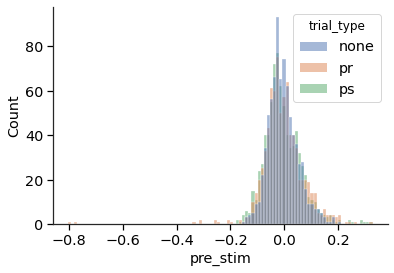

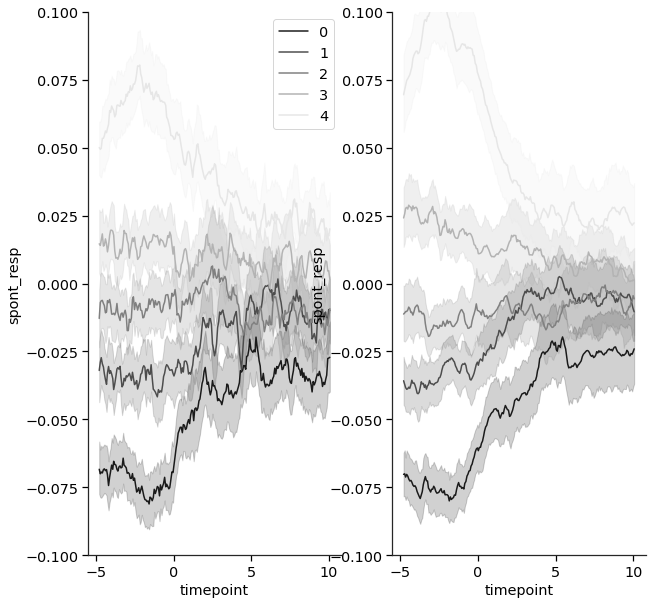

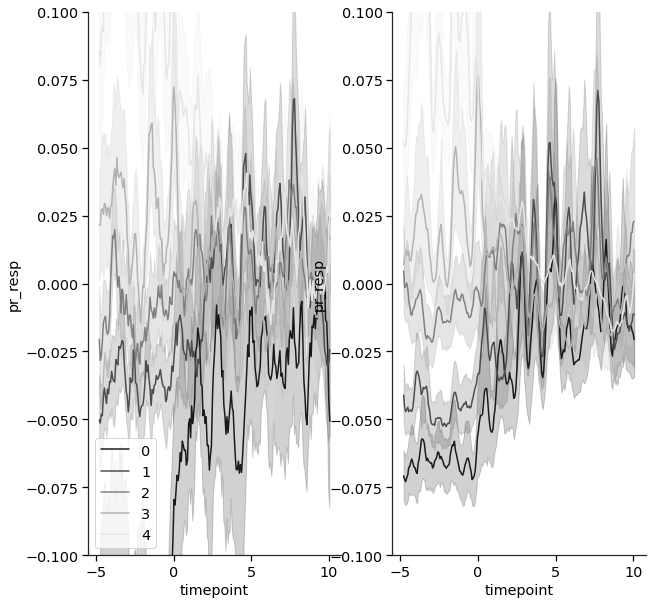

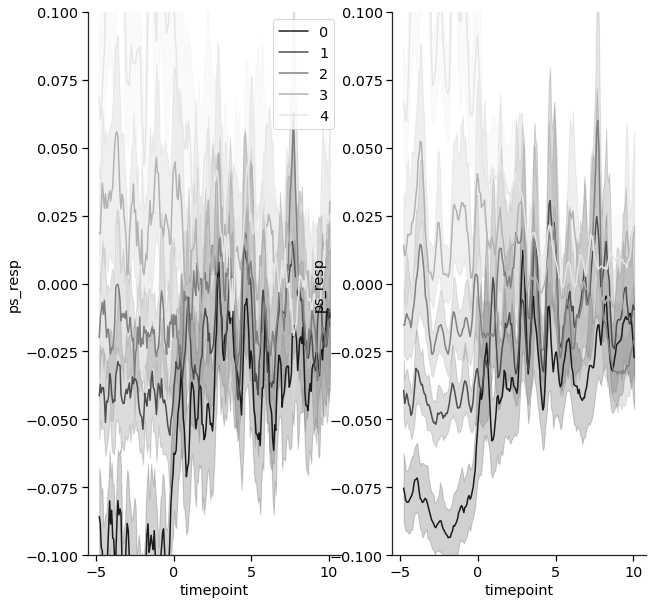

In [25]:
# separate trial-avg pre-stim activity in to top/middle/bottom percentiles
# could use pre-stim S1 activity OR S2 activity OR whole multi-area pre-stim activity, try all!
# use whole multi-area first, so average all cells for each trial, per animal
# don't need this pre_stim_tertiles = trial_avg_df['pre_stim'].quantile(q=[1/3, 2/3])
# instead, rank the pre-stim values using percentile form, then get < 1/3, 1/3-2/3 and >2/3
# do i need to do the ranking for each trial type, to compare? Otherwise different number of trials from each
# trial type, in each bin - no, distributions are similar
# What is the final comparison? Between trial types and the different bands of pre-stim, what is the post-stim 
# S2 output, also taking account of target activity

# df_s2_filter = df.cell_id.isin(s2_cell_ids)
# trial_avg_df = df[~df_s2_filter].groupby(['session_id', 'trial_num', 'trial_type']).mean()
trial_avg_df = df.groupby(['session_id', 'trial_num', 'trial_type']).mean()
sns.histplot(data=trial_avg_df, x='pre_stim', hue='trial_type');

trial_types = trial_avg_df.index.get_level_values(2).unique()
responses = ['spont_resp', 'pr_resp', 'ps_resp']
cell_id_list = [pr_targets, pr_targets, ps_targets]

fraction = 5
percentiles = [(i/fraction, (i+1)/fraction) for i in range(0, fraction)]
percentile_colors = np.mean(percentiles, axis=1)

for trial_type, response, cell_ids in zip(trial_types, responses, cell_id_list):
    
    target_single_timepoint_df = cell_trial_single_timepoint_df[cell_ids]
    target_mean_timepoint_df = target_single_timepoint_df.groupby(['session_id', 'trial_num', 'timepoint']).mean()
    target_mean_timepoint_df = target_mean_timepoint_df.reset_index().set_index(['session_id', 'trial_num'], drop=True)
        
    fig, axes = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=False, figsize=(10,10))
        
    trial_type_df = trial_avg_df.query('trial_type.str.contains(@trial_type)').copy(deep=True)
    trial_type_df['pct_rank'] = trial_type_df['pre_stim'].rank(pct=True)
    
    for percentile, color in zip(percentiles, percentile_colors):
        pre_stim_percentile = (percentile[0] < trial_type_df['pct_rank']) & (trial_type_df['pct_rank'] <= percentile[1])
        pre_stim_percentile_df = trial_type_df[pre_stim_percentile]
        percentile_trial_indices = pre_stim_percentile_df.index

        # use dataframe with timeseries data to find average of all cells for only these trials
        # and only this trial type (filter column)
        # plot target data in left plot and s2 data in right plot, using same axes for columns, use 95% CI
        # new plot for each trial type
        
#         target_timeseries_df = target_mean_timepoint_df.loc[tertile_trial_indices]
#         target_rolling_mean = target_timeseries_df.rolling(5).mean()[response].fillna(np.inf)
#         sns.lineplot(data=target_timeseries_df, x='timepoint', y=target_rolling_mean, estimator='mean', ci=95, ax=axes[0])

        s1_timeseries_df = s1_mean_timepoint_df.loc[percentile_trial_indices]
        s1_rolling_mean = s1_timeseries_df.rolling(5).mean()[response].fillna(np.inf)
        sns.lineplot(data=s1_timeseries_df, x='timepoint', y=s1_rolling_mean, estimator='mean', ci=95, ax=axes[0],
                    color=str(color))
    
        s2_timeseries_df = s2_mean_timepoint_df.loc[percentile_trial_indices]
        s2_rolling_mean = s2_timeseries_df.rolling(5).mean()[response].fillna(np.inf)
        sns.lineplot(data=s2_timeseries_df, x='timepoint', y=s2_rolling_mean, estimator='mean', ci=95, ax=axes[1],
                    color=str(color))
    
    axes[1].set_ylim([-0.1, 0.1])
    axes[0].set_ylim([-0.1, 0.1])
    axes[0].legend(list(range(len(percentiles))))

In [ ]:
# separate trial-avg pre-stim activity in to top/middle/bottom percentiles
# could use pre-stim S1 activity OR S2 activity OR whole multi-area pre-stim activity, try all!
# use whole multi-area first, so average all cells for each trial, per animal
# don't need this pre_stim_tertiles = trial_avg_df['pre_stim'].quantile(q=[1/3, 2/3])
# instead, rank the pre-stim values using percentile form, then get < 1/3, 1/3-2/3 and >2/3
# do i need to do the ranking for each trial type, to compare? Otherwise different number of trials from each
# trial type, in each bin - no, distributions are similar
# What is the final comparison? Between trial types and the different bands of pre-stim, what is the post-stim 
# S2 output, also taking account of target activity

# df_s2_filter = df.cell_id.isin(s2_cell_ids)
# trial_avg_df = df[~df_s2_filter].groupby(['session_id', 'trial_num', 'trial_type']).mean()
trial_avg_df = df.groupby(['session_id', 'trial_num', 'trial_type']).mean()
sns.histplot(data=trial_avg_df, x='pre_stim', hue='trial_type');

trial_types = trial_avg_df.index.get_level_values(2).unique()
responses = ['spont_resp', 'pr_resp', 'ps_resp']
cell_id_list = [pr_targets, pr_targets, ps_targets]

fraction = 3
percentiles = [(i/fraction, (i+1)/fraction) for i in range(0, fraction)]
percentile_colors = np.mean(percentiles, axis=1)

for trial_type, response, cell_ids in zip(trial_types, responses, cell_id_list):
    
    target_single_timepoint_df = cell_trial_single_timepoint_df[cell_ids]
    target_mean_timepoint_df = target_single_timepoint_df.groupby(['session_id', 'trial_num', 'timepoint']).mean()
    target_mean_timepoint_df = target_mean_timepoint_df.reset_index().set_index(['session_id', 'trial_num'], drop=True)
        
    fig, axes = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=False, figsize=(10,10))
        
    trial_type_df = trial_avg_df.query('trial_type.str.contains(@trial_type)').copy(deep=True)
    trial_type_df['pct_rank'] = trial_type_df['pre_stim'].rank(pct=True)
    
    for percentile, color in zip(percentiles, percentile_colors):
        pre_stim_percentile = (percentile[0] < trial_type_df['pct_rank']) & (trial_type_df['pct_rank'] <= percentile[1])
        pre_stim_percentile_df = trial_type_df[pre_stim_percentile]
        percentile_trial_indices = pre_stim_percentile_df.index

        # use dataframe with timeseries data to find average of all cells for only these trials
        # and only this trial type (filter column)
        # plot target data in left plot and s2 data in right plot, using same axes for columns, use 95% CI
        # new plot for each trial type
        
#         target_timeseries_df = target_mean_timepoint_df.loc[tertile_trial_indices]
#         target_rolling_mean = target_timeseries_df.rolling(5).mean()[response].fillna(np.inf)
#         sns.lineplot(data=target_timeseries_df, x='timepoint', y=target_rolling_mean, estimator='mean', ci=95, ax=axes[0])

        s1_timeseries_df = s1_mean_timepoint_df.loc[percentile_trial_indices]
        s1_rolling_mean = s1_timeseries_df.rolling(5).mean()[response].fillna(np.inf)
        sns.lineplot(data=s1_timeseries_df, x='timepoint', y=s1_rolling_mean, estimator='mean', ci=95, ax=axes[0],
                    color=str(color))
    
        s2_timeseries_df = s2_mean_timepoint_df.loc[percentile_trial_indices]
        s2_rolling_mean = s2_timeseries_df.rolling(5).mean()[response].fillna(np.inf)
        sns.lineplot(data=s2_timeseries_df, x='timepoint', y=s2_rolling_mean, estimator='mean', ci=95, ax=axes[1],
                    color=str(color))
    
    axes[1].set_ylim([-0.1, 0.1])
    axes[0].set_ylim([-0.1, 0.1])
    axes[0].legend(list(range(len(percentiles))))

In [38]:
#Replicating the pre-stim/post-stim correlation from the data used to plot the timeseries
pre_stim = cell_trial_single_timepoint_df.query('(timepoint > -5) & (timepoint < 0)').groupby(['session_id', 'trial_num']).mean()
post_stim = cell_trial_single_timepoint_df.query('(timepoint > 0) & (timepoint < 5)').groupby(['session_id', 'trial_num']).mean()

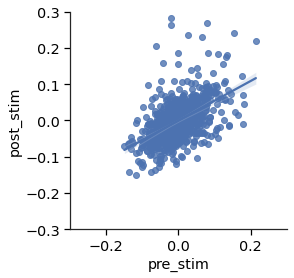

In [48]:
sns.regplot(x=pre_stim['spont_resp'], y=post_stim['spont_resp'])
plt.axis([-0.3, 0.3, -0.3, 0.3])
plt.gca().set_aspect('equal')
plt.xlabel('pre_stim')
plt.ylabel('post_stim');

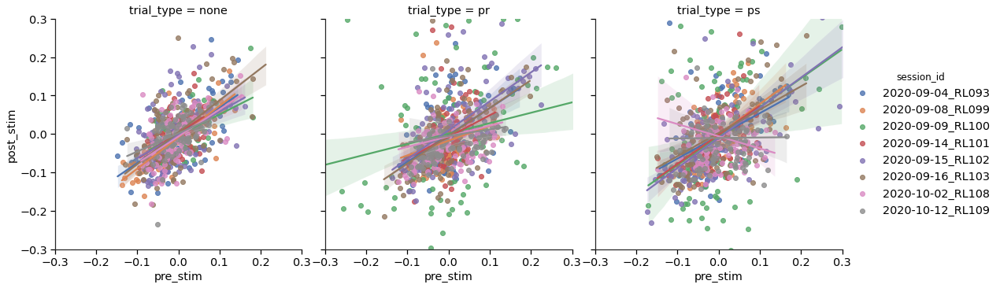

In [37]:
df2 = df.groupby(['session_id', 'trial_num', 'trial_type']).mean().reset_index(drop=False)

g = sns.lmplot(data=df2, x='pre_stim', y='post_stim', hue='session_id', col='trial_type')

g.set(xlim=(-0.3,0.3));
g.set(ylim=(-0.3,0.3));

In [ ]:
df_filtered = df[df.s2_cell]

g = sns.lmplot(data=df, x='pre_stim', y='post_stim', hue='session_id', col='trial_type')

g.set(xlim=(-20,20));
g.set(ylim=(-20,20));

In [ ]:
s2_df = df[df.s2_cell]
low_pre_s2_df = s2_df[(s2_df.pre_stim < 0.1) & (s2_df.pre_stim > -0.1)]

sns.histplot(data=low_pre_s2_df, x='post_stim', hue='trial_type')
plt.axis([-1, 1, 0, 2000]);

In [ ]:
s2_df = df[df.s2_cell]
low_diff_s2 = s2_df[(s2_df['diff'] < 0.1) & (s2_df['diff'] > -0.1) & (s2_df.trial_type == 'none')].cell_id.unique()
low_diff_s2

# Make classifier for S2 activity (logistic regression sham/photostim)

In [2]:
df_name = session_type + '_cell_trial_df_long'
pkl_path = os.path.join(pkl_folder, 'dataframes', df_name + '.pkl')
df = pd.read_pickle(pkl_path)
df.head()

,session_id,cell_num,cell_id,trial_num,trial_type,s2_cell,target_cell,pre_stim,post_stim,diff
cell_trial_id,,,,,,,,,,
2020-09-04_RL093_0_1,2020-09-04_RL093,0,2020-09-04_RL093_0,1,pr,False,False,-0.138509,-0.234488,-0.095979
2020-09-04_RL093_0_2,2020-09-04_RL093,0,2020-09-04_RL093_0,2,pr,False,False,-0.216305,-0.416031,-0.199726
2020-09-04_RL093_0_3,2020-09-04_RL093,0,2020-09-04_RL093_0,3,pr,False,False,0.818333,0.205392,-0.612941
2020-09-04_RL093_0_4,2020-09-04_RL093,0,2020-09-04_RL093_0,4,pr,False,False,-0.063995,0.019071,0.083066
2020-09-04_RL093_0_5,2020-09-04_RL093,0,2020-09-04_RL093_0,5,pr,False,False,0.443467,0.812246,0.368779


In [7]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn import metrics

def logisticClassifier(data, labels):
    
    x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=0.25, random_state=0)
    
    pipe = make_pipeline(StandardScaler(), LogisticRegression())
    pipe.fit(x_train, y_train)

    predictions = pipe.predict(x_test)

    score = pipe.score(x_test, y_test)
    
    return y_test, predictions, score

def logisticClassifierCV(data, labels):
    
#     x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=0.25, random_state=0)
    
    cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
    
    pipe = make_pipeline(StandardScaler(), LogisticRegression())
#     pipe.fit(x_train, y_train)
    
    scores = cross_val_score(pipe, data, labels, cv=cv, n_jobs=-1)
    
    return scores

def plotConfusionMatrix(y_test, predictions, score):
    cm = metrics.confusion_matrix(y_test, predictions)
    print(cm)

    plt.figure(figsize=(9,9))
    sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
    plt.ylabel('Actual label');
    plt.xlabel('Predicted label');
    all_sample_title = 'Accuracy Score: {0}'.format(score)
    plt.title(all_sample_title, size = 15);
    
    return cm

In [8]:
# What format should the data be in? post-stim average activity per neuron, for a single animal? 
# An array of S2 average activity per trial, with label of trial type

s2_df = df[df.s2_cell]

for session_id in s2_df.session_id.unique():
    
    test_df = s2_df[s2_df['session_id'] == session_id]
    trial_groups = test_df.groupby(['session_id', 'trial_num', 'trial_type'])

    data = np.empty([len(trial_groups), len(test_df.cell_id.unique())])
    labels = np.empty(len(trial_groups), dtype='object')

    for i, group in enumerate(trial_groups):
        labels[i] = group[1].trial_type[0]
        data[i] = group[1].post_stim.to_numpy()

    photostim_labels = np.where((labels == 'pr') | (labels == 'ps'))
    labels[photostim_labels] = 'photostim'

    scores = logisticClassifierCV(data, labels)
    print('session: {2}, mean: {0:.1f}%, std: {1:.1f}%'.format(scores.mean()*100, scores.std()*100, session_id))
#     y_test, predictions, score = logisticClassifier(data, labels)
#     cm = plotConfusionMatrix(y_test, predictions, score)
#     plt.suptitle(session_id, y=0.90)

session: 2020-09-04_RL093, mean: 51.6%, std: 8.3%
session: 2020-09-08_RL099, mean: 51.7%, std: 9.2%
session: 2020-09-09_RL100, mean: 48.6%, std: 8.5%
session: 2020-09-14_RL101, mean: 51.1%, std: 8.7%
session: 2020-09-15_RL102, mean: 50.3%, std: 7.7%
session: 2020-09-16_RL103, mean: 74.3%, std: 6.8%
session: 2020-10-02_RL108, mean: 68.3%, std: 8.2%
session: 2020-10-12_RL109, mean: 63.7%, std: 9.0%


# Find calcium event frequency across all sessions and plot trial types against each other

In [ ]:
def moving_average(a, n=4):
    ret = np.cumsum(a)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1:] / n

def _good_cells(cell_ids: list, raws: np.ndarray, photostim_frames: list, std_thresh: int):
    """
    This function is used for filtering for "good" cells based on detection of Flu deflections that are above some std threshold based on std_thresh.
    Note: a moving averaging window of 4 frames is used to find Flu deflections above std threshold.
    :param cell_ids: list of cell ids to iterate over
    :param raws: raw flu values corresponding to the cell list in cell_ids
    :param photostim_frames: frames to delete from the raw flu traces across all cells (because they are photostim frames)
    :param std_thresh: std. factor above which to define reliable Flu events
    :return:
        good_cells: list of cell_ids that had atleast 1 event above the std_thresh
        events_loc_cells: dictionary containing locations for each cell_id where the moving averaged Flu trace passes the std_thresh
        flu_events_cells: dictionary containing the dff Flu value corresponding to events_loc_cells
        stds = dictionary containing the dFF trace std value for each cell_id
    """
    good_cells = []
    events_loc_cells = {}
    flu_events_cells = {}
    stds = {}  # collect the std values for all filtered cells used later for identifying high and low std cells
    for i in range(len(cell_ids)):
        cell_id = cell_ids[i]
#         if i % 100 == 0:  # print the progress once every 100 cell iterations
#             print(i, " out of ", len(cell_ids), " cells done")
        # print(i, " out of ", len(cell_ids), " cells")
        raw = raws[i]
        raw_ = np.delete(raw, photostim_frames)
        raw_dff = normalize_dff_jit(raw_)  # note that this function is defined in this file a little further down
        std_ = raw_dff.std()
        raw_dff_ = moving_average(raw_dff, n=4)
        thr = np.mean(raw_dff) + std_thresh * std_
        events = np.where(raw_dff_ > thr)
        flu_values = raw_dff[events]
        if len(events[0]) > 0:
            events_loc_cells[cell_id] = events
            flu_events_cells[cell_id] = flu_values
            good_cells.append(cell_id)
            stds[cell_id] = std_
        # if i == 465:  # just using this here if ever need to check back with specific cells if function seems to be misbehaving
        #     print(events, len(events[0]), thr)
#     print('# of good cells found: ', len(good_cells), ' (out of ', len(cell_ids), ' ROIs)')
    return good_cells, events_loc_cells, flu_events_cells, stds

def normalize_dff_jit(arr, threshold=20):
    """normalize given array (cells x time) to the mean of the fluorescence values below given threshold"""
    if arr.ndim == 1:
        a = np.percentile(arr, threshold)
        mean_ = abs(arr[arr < a].mean())
        new_array = (arr - mean_) / mean_ * 100
        # print(mean)
    else:
        new_array = np.empty_like(arr)
        for i in range(len(arr)):
            a = np.percentile(arr[i], threshold)
            mean_ = np.mean(arr[i][arr[i] < a])
            new_array[i] = arr[i] / abs(mean_) * 100
            if np.isnan(new_array[i]).any() == True:
                print('Warning:')
                print('Cell %d: contains nan' % (i + 1))
                print('      Mean of the sub-threshold for this cell: %s' % mean_)
    return new_array

In [ ]:
def calciumEventFreq(ses_obj, exp_obj, std_thresh=1):
    cell_ids = exp_obj.cell_id[0]
    raws = exp_obj.raw[0]
    photostim_frames = ses_obj._getPhotostimFrames(exp_obj)

    good_cells, event_loc_cells, flu_events_cells, std = _good_cells(cell_ids, raws, photostim_frames, std_thresh);

    events = []

    for cell in cell_ids:
        try:
            events.append(np.shape(event_loc_cells[cell])[1])
        except:
            events.append(np.nan)
        
    return events

In [ ]:
pkl_files = listdirFullpath(os.path.join(pkl_folder, session_type), '.pkl')

session_ids = [pkl.split('/')[-1][:-4] for pkl in pkl_files]

pr_events = []
ps_events = []
spont_events = []

df = pd.DataFrame()

for pkl, session_id in zip(pkl_files, session_ids):
    
    ses_obj = loadPickle(pkl)

    pr_events = calciumEventFreq(ses_obj, ses_obj.photostim_r, std_thresh=1);
    ps_events = calciumEventFreq(ses_obj, ses_obj.photostim_s, std_thresh=1);
    spont_events = calciumEventFreq(ses_obj, ses_obj.spont, std_thresh=1);
    
    session_col = np.repeat(session_id, len(pr_events))
    
    temp_df = pd.DataFrame({
                            'session_id': session_col,
                            'pr_targets' : ses_obj.photostim_r.targeted_cells,
                            'ps_targets' : ses_obj.photostim_s.targeted_cells,
                            's1_cell' : ses_obj.photostim_r.cell_s1[0],
                            'pr_events' : pr_events,
                            'ps_events' : ps_events,
                            'spont_events' : spont_events,
                            'pr_sta_amp' : ses_obj.photostim_r.sta_amplitudes[0],
                            'ps_sta_amp' : ses_obj.photostim_s.sta_amplitudes[0],
                            'whisker_sta_amp' : ses_obj.whisker_stim.sta_amplitudes[0],
                            'spont_sta_amp' : ses_obj.whisker_stim.sta_amplitudes[0]
                           })
    
    df = pd.concat([df, temp_df])

In [ ]:
s2_df = df.query('~s1_cell')
s2_df['high_freq_spont'] = s2_df['spont_events']>2000

sns.barplot(data=s2_df, x='high_freq_spont', y='ps_sta_amp')
stats.mannwhitneyu(s2_df.query('~high_freq_spont')['ps_sta_amp'], s2_df.query('high_freq_spont')['ps_sta_amp'])

In [ ]:
plot_df = df.query('~pr_targets & ~ps_targets & ~s1_cell')

rel = sns.relplot(x='pr_events', y='ps_events', col='session_id', col_wrap=4, data=plot_df, kind='scatter')

axes = rel.fig.axes

for ax in axes:
    ax.plot([0,df['pr_events'].max()],[0,df['pr_events'].max()], 'k', linestyle='dashed')
    ax.set_aspect('equal')

In [ ]:
exp_obj = ses_obj.photostim_r

cell_ids = exp_obj.cell_id[0]
raws = exp_obj.raw[0]
photostim_frames = ses_obj._getPhotostimFrames(exp_obj)
std_thresh=1

# good_cells, event_loc_cells, flu_events_cells, std = _good_cells(cell_ids, raws, photostim_frames, std_thresh);

cell_id = 121
dict_id = cell_ids[cell_id]

cell_raw = np.delete(raws[cell_id], photostim_frames)
cell_raw_dff = normalize_dff_jit(cell_raw)  # note that this function is defined in this file a little further down
# cell_raw_dff = moving_average(cell_raw_dff, n=4)

plt.figure(figsize=(20,5))
plt.plot(cell_raw_dff, color='k')
plt.scatter(event_loc_cells[dict_id][0], flu_events_cells[dict_id], color='r')
plt.xlim([0,2000]);

# Calcium responses over timeseries in targeted cells

In [ ]:
pkl_files = listdirFullpath(os.path.join(pkl_folder, session_type), '.pkl')

session_ids = [pkl.split('/')[-1][:-4] for pkl in pkl_files]

df = pd.DataFrame()

for pkl, session_id in zip(pkl_files, session_ids):
    
    ses_obj = loadPickle(pkl);
    exp_obj = ses_obj.photostim_r
    
    tcell_dfof = exp_obj.dfof[0][exp_obj.targeted_cells & exp_obj.sta_sig[0]]

    ssf = exp_obj.stim_start_frames[0]
    
    first10_dfof = np.array([tcell_dfof[:, frame-20:frame-1] for frame in ssf[:10]])
    first10_dfof_mean = np.mean(first10_dfof, axis=(0,1))
    
    last10_dfof = np.array([tcell_dfof[:, frame-20:frame-1] for frame in ssf[-10:]])
    last10_dfof_mean = np.mean(last10_dfof, axis=(0,1))
    
    temp_df = pd.DataFrame({'first10' : first10_dfof_mean,
                            'last10' : last10_dfof_mean,
                            'session_id' : np.repeat(session_id, len(first10_dfof_mean))
                           })
    
    df = pd.concat([df, temp_df])

In [ ]:
plt.figure(figsize=(10,10))
sns.scatterplot(y='last10', x='first10', data=df, color='k')
plt.plot(np.linspace(-0.2,0.2,num=50), np.linspace(-0.2,0.2,num=50), c='0.8', linestyle='--')
plt.xlabel('First 10 trials mean dfof (dFF)')
plt.ylabel('Last 10 trials mean dfof (dFF)')
plt.suptitle('Target cell mean dfof for first 10 trials vs. last 10 trials', y=0.92, fontsize='x-large')
df.mean()

In [ ]:
plt.figure(figsize=(7,7))
sns.histplot(x='first10', data=df, color='0.1')
sns.histplot(x='last10', data=df, color='0.7')
plt.xlabel('Activity level (dFF)')
plt.ylabel('Number of cells')
plt.legend(['First 10 trials', 'Last 10 trials'])
plt.title('Distribution of target cell activity levels on\nfirst 10 trials and last 10 trials');

In [ ]:
pkl_files = listdirFullpath(os.path.join(pkl_folder, 'sensory'), 'RL102.pkl')

for pkl in pkl_files:
    
    ses_obj = loadPickle(pkl)

exp_obj = ses_obj.photostim_r

In [ ]:
# plot final 2 seconds of trial average for each cell to see how many go up to that level?

sig_tcell_stas = exp_obj.stas[0][exp_obj.targeted_cells & exp_obj.sta_sig[0]]
sig_tcell_trials = exp_obj.all_trials[0][exp_obj.targeted_cells & exp_obj.sta_sig[0]]

final2sec = sig_tcell_stas[:,-60:]
first2sec = sig_tcell_stas[:,60:]

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20,7), sharey=True, gridspec_kw={'width_ratios':[1, 1, 3]})

axes[0].plot(final2sec.T, color='k', alpha=0.3);
axes[0].plot(np.mean(final2sec, axis=0), color='r', lw=5)

axes[1].plot(first2sec.T, color='k', alpha=0.3);
axes[1].plot(np.mean(first2sec, axis=0), color='r', lw=5)

n = 20
axes[2].set_prop_cycle('color', [plt.cm.hot(i) for i in np.linspace(0, 1, n)])

for i in range(n):
    axes[2].plot(sig_tcell_trials[18,:,i])

# Interactive plotting of target cell dfof trials

In [ ]:
pkl_files = listdirFullpath(os.path.join(pkl_folder, 'sensory_nodetrend'), 'RL109.pkl')

for pkl in pkl_files:
    
    ses_obj = loadPickle(pkl)

exp_obj = ses_obj.photostim_r

In [ ]:
%matplotlib widget
from ipywidgets import *

tcell_dfof = exp_obj.dfof[0][exp_obj.targeted_cells & exp_obj.sta_sig[0]]
ssf = exp_obj.stim_start_frames[0]

default_cell = 0
default_stim = 0

time_start = -2
time_end = 19
time_buffer = 30

stim_1 = ssf[default_stim]-time_buffer
stim_2 = ssf[default_stim+1]+time_buffer
    
tcell_stims = tcell_dfof[:,stim_1:stim_2][default_cell]

default_y = tcell_stims
default_x = np.linspace(time_start, time_end, (stim_2)-(stim_1))

fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
dff_line, = ax.plot(default_x, default_y, c='k')
baseline = ax.hlines(0, time_start, time_end, color='0.6', linestyle='--')

def update(time_start, time_end, time_buffer, cell_n, stim_n):
    
    stim_1 = ssf[stim_n]-time_buffer
    stim_2 = ssf[stim_n+1]+time_buffer
    
    y = tcell_dfof[:,stim_1:stim_2][cell_n]
    x = np.linspace(time_start,time_end,stim_2-stim_1)
    
    dff_line.set_ydata(y)
    dff_line.set_xdata(x)
    
#     hline_y = np.nanmean(tcell_dfof[cell_n,:ssf[0]])
    
#     baseline.set_segments([np.array([[time_start, hline_y], [time_end, hline_y]])])
    
    ax.set_ylim(ymin=np.amin(y)-0.5, ymax=np.amax(y)+0.5)
    fig.canvas.draw_idle()

n_tcells = len(tcell_dfof)-1
n_stims = len(ssf)-1

interact(update, time_start=time_start, time_end=time_end, time_buffer=time_buffer,
         stim_n=widgets.IntSlider(min=0, max=n_stims, step=1, value=0),
         cell_n=widgets.IntSlider(min=0, max=n_tcells, step=1, value=0));